### Marine Particle Analysis

#### 1. Data Processing Functions
- `get_all_images()` - Load and process image metadata from directories
- `calculate_biovol()` - Add volume to particle data
- `add_position_density()` - Add position density values to each particle record

#### 2. Binning Functions (2D binning: Size × Depth/Pressure)
- `bin_particles_by_depth_and_size()` - Bin particles by depth bins and ESD size classes
- `bin_particles_by_pressure_and_size()` - Bin particles by pressure bins and ESD size classes (normalized by sampling volume)
- `count_particles_by_pressure_and_size()` - Raw abundance counts per pressure/ESD bin
- `sum_biovol_by_pressure_and_size()` - Total biovolume per pressure/ESD bin

#### 3. Advanced Analysis Functions
- `calculate_particle_size_spectrum()` - Calculate PSS and WBS using logarithmic size bins

#### 4. Basic Plotting Functions
- `plot_particle_size_histogram()` - Log-scale histogram of ESD values
- `plot_particle_positions()` - Histograms and 2D heatmap of particle positions

#### 5. Distribution Plotting Functions
- `plot_particle_size_distribution_vs_depth()` - Multi-axis normalized abundance vs pressire for size classes
- `plot_abundance_vs_pressure()` - Raw abundance counts vs pressure for taxonomic groups
- `plot_biovolume_vs_pressure()` - Biovolume distribution vs pressure for taxonomic groups

#### 6. Environmental Data Plotting
- `plot_ctd_profile()` - Multi-parameter CTD profile plot (salinity, temperature, oxygen, chlorophyll)

#### 7. Advanced Comparison Plots
- `plot_pss_wbs_comparison()` - 4-panel comparison: fixed size classes, PSS, WBS, and classic PSS plots
- `plot_biovolume_vs_size_by_class()` - Scatter plots of biovolume vs ESD for taxonomic groups
- `plot_abundance_vs_size_by_class()` - Line plots of abundance vs ESD for taxonomic groups

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os


### fixed variables
VOLUME_PER_IMAGE = 50 * (3.5)**2 * np.pi  # in cubic centimeters
VOLUME_PER_IMAGE_LITERS = VOLUME_PER_IMAGE / 1000  # convert to liters
IMAGE_SIZE = 2560

In [10]:
M1811121CTD037 = '/home/fanny/export__TSV_17108_20250619_1240/ecotaxa_M181-112-1_CTD-037.tsv'
M1811121CTD037_df = pd.read_csv(M1811121CTD037, sep='\t')
df1 = pd.read_csv('/home/fanny/Profiles/export__TSV_17668_20250725_1143_CTD-50/ecotaxa_export__TSV_17668_20250725_1143.tsv', sep='\t')
df2 = pd.read_csv('/home/fanny/Profiles/export__TSV_17785_20250725_1020_CTD-37-60-75-81/ecotaxa_export__TSV_17785_20250725_1020.tsv', sep='\t')
df = pd.concat([df1, df2], ignore_index=True)

df_puff = pd.read_csv('/home/fanny/Profiles/ET_non-living_export__TSV_17720_20250808_0926/ecotaxa_puff.tsv', sep='\t')
df_tuft = pd.read_csv('/home/fanny/Profiles/ET_non-living_export__TSV_17720_20250808_0926/ecotaxa_tuft.tsv', sep='\t')
df_trichodesmium = pd.concat([df_puff, df_tuft], ignore_index=True)

all_images_df = get_all_images('/home/fanny/M181_output')

plot_path = '/home/fanny/plots'
os.makedirs(plot_path, exist_ok=True)

In [2]:
ViT_validated_CTD50_df = pd.read_csv('/home/fanny/Profiles/export__TSV_17668_20250818_1533_CTD-50/ecotaxa_export__TSV_17668_20250818_1533.tsv', sep='\t')
ViT_fully_predicted_df = pd.read_csv('/home/fanny/Profiles/export__TSV_17785_20250818_1537__M181_PISCO2_deconv_fully_ViT_predicted/ecotaxa_export__TSV_17785_20250818_1537.tsv', sep='\t')

/tmp/ipykernel_2350932/3610379964.py:2: DtypeWarning: Columns (9,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  ViT_fully_predicted_df = pd.read_csv('/home/fanny/Profiles/export__TSV_17785_20250818_1537__M181_PISCO2_deconv_fully_ViT_predicted/ecotaxa_export__TSV_17785_20250818_1537.tsv', sep='\t')


In [3]:
ViT_validated_CTD37_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758']
ViT_validated_CTD60_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748']
ViT_validated_CTD75_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024']
ViT_validated_CTD81_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218']

df_five_profiles = pd.concat([ViT_validated_CTD50_df, ViT_validated_CTD37_df, ViT_validated_CTD60_df, ViT_validated_CTD75_df, ViT_validated_CTD81_df], ignore_index=True)

In [5]:
# ============================================================================
# 1. DATA PROCESSING FUNCTIONS
# ============================================================================

def get_all_images(base_folder):
    """
    Load and process image metadata from directories.
    
    Scans through profile folders and extracts metadata from filenames
    including pressure, temperature, and datetime information.
    
    Parameters:
    - base_folder: str, path to the base folder containing profile directories
    
    Returns:
    - all_images_df: DataFrame with columns 'profile_name', 'filename', 'full_path', 
                     'pressure', 'temperature', 'date-time'
    """
    
    all_files = []

    # Iterate through profile folders
    for profile in os.listdir(base_folder):
        profile_path = os.path.join(base_folder, profile)
        if os.path.isdir(profile_path):
            data_folder = os.path.join(profile_path, "Data")
            if os.path.isdir(data_folder):
                for filename in os.listdir(data_folder):
                    file_path = os.path.join(data_folder, filename)
                    if os.path.isfile(file_path):
                        all_files.append({
                            "profile_name": profile,
                            "filename": filename,
                            "full_path": file_path
                        })

    # Convert to DataFrame
    df = pd.DataFrame(all_files)
    
    if df.empty:
        print(f"Warning: No files found in {base_folder}")
        return df

    # Parse filename to extract metadata
    split_df = df['filename'].apply(lambda f: os.path.splitext(f)[0]).str.split('_', expand=True)

    # Assign headers
    split_df.columns = ["date-time", "pressure", "temperature"]

    # Clean and convert numeric values
    split_df['pressure'] = split_df['pressure'].str.replace('bar', '', regex=False).astype(float)
    split_df['pressure'] = split_df['pressure'] * 10  # Convert to dbar
    split_df['temperature'] = split_df['temperature'].str.replace('C', '', regex=False).astype(float)

    # Merge split columns back into df
    all_images_df = pd.concat([df, split_df], axis=1)

    # Extract sample_id from profile_name
    all_images_df['sample_id'] = all_images_df['profile_name'].str.extract(r'(M181-\d+-\d+_CTD-\d+)')
    
    #print(f"Loaded metadata for {len(all_images_df)} images from {len(all_images_df['profile_name'].unique())} profiles")
    
    return all_images_df




def calculate_biovol(df):
    """
    Add volume and carbon biomass calculations to particle data.
    
    Uses allometric equations to estimate carbon content from biovolume.
    
    Parameters:
    - df: DataFrame with 'object_esd' column
    
    Returns:
    - df: DataFrame with added 'volume_um3' and 'biomass_pgC' columns
    """
    df = df.copy()
    
    # Calculate biovolume in μm³ (assuming spherical particles)
    df['volume_um3'] = (4/3) * np.pi * (df['object_esd']/2)**3
    
    # Calculate carbon biomass in picograms using allometric equation
    # Menden-Deuer & Lessard (2000): pgC = 0.216 × Volume^0.939
    #df['biomass_pgC'] = 0.216 * (df['volume_um3'] ** 0.939)
    
    return df


def add_position_density(df):
    """
    Add a position density value for each particle based on local particle density.
    
    Calculates a 2D histogram of particle positions and assigns each particle
    the density value of its position bin.
    
    Parameters:
    - df: DataFrame with 'object_centroid_x' and 'object_centroid_y' columns
    
    Returns:
    - df: DataFrame with added 'position_density' column
    """
    def compute_position_histogram(x, y, n_bins):
        step = IMAGE_SIZE / n_bins
        hist = np.zeros((n_bins, n_bins), dtype=np.int64)
        for row in range(len(x)):
            try:
                x_index = int(x[row] // step)
                y_index = int(y[row] // step)
                hist[y_index, x_index] += 1
            except:
                pass
        return hist
    
    hist = compute_position_histogram(df["object_centroid_x"], df["object_centroid_y"], 500)

    def get_density_value(x, y):
        step = IMAGE_SIZE / 500
        x_index = int(x // step)
        y_index = int(y // step)
        return hist[x_index][y_index]
    
    df = df.copy()
    df["position_density"] = df.apply(
        lambda row: get_density_value(row["object_centroid_x"], row["object_centroid_y"]), 
        axis=1
    )

    return df


# ============================================================================
# 2. BINNING FUNCTIONS (2D: Size × Depth/Pressure)
# ============================================================================

def bin_particles_by_depth_and_size(df, esd_bins=np.array([125,250,500,1000,100000]), depth_bin_size=5):
    """
    2D BINNING: Bin particles by both depth and ESD size classes.
    
    Creates a 2D histogram where:
    - X-axis: Size classes (ESD bins)  
    - Y-axis: Depth bins
    - Values: Normalized abundance (particles per liter)
    
    Parameters:
    - df: DataFrame with columns 'object_esd', 'depth [m]', 'img_id'
    - esd_bins: Array of ESD bin edges in micrometers
    - depth_bin_size: Size of depth bins in meters
    
    Returns:
    - histogram: DataFrame with raw counts and normalized counts
    - pivoted_df: 2D table with depth as rows, ESD size classes as columns
    """
    # Define depth bins
    max_depth = df['depth [m]'].max()
    min_depth = df['depth [m]'].min()
    depth_bins = np.arange(min_depth, max_depth + depth_bin_size, depth_bin_size)

    # Assign particles to bins
    df = df.copy()
    df['esd_bin'] = np.digitize(df['object_esd'], esd_bins)
    df['depth_bin'] = np.digitize(df['depth [m]'], depth_bins)

    # Calculate sampled volume per depth bin (based on unique images)
    depth_bin_volumes = df.groupby('depth_bin')['img_id'].nunique() * VOLUME_PER_IMAGE_LITERS

    # Count particles per bin combination
    histogram = df.groupby(['esd_bin', 'depth_bin']).size().reset_index(name='count')
    
    # Normalize by sampled volume
    histogram['normalized_count'] = histogram.apply(
        lambda row: row['count'] / depth_bin_volumes.get(row['depth_bin'], 1), axis=1
    )

    # Create 2D pivot table
    pivoted_df = histogram.pivot(index='depth_bin', columns='esd_bin', values='normalized_count').reset_index()
    pivoted_df.columns = ['depth [m]', 'ESD<125μm', 'ESD 125-250μm', 'ESD 250-500μm', 'ESD 500-1000μm', 'ESD >1000μm']

    return histogram, pivoted_df

In [6]:
def bin_particles_by_pressure_and_size(df, all_images_df, pressure_bin_size=5, 
                                       esd_bins=np.array([0,125,250,500,1000,100000]), 
                                       VOLUME_PER_IMAGE_LITERS=0.5):
    """
    2D BINNING: Bin particles by both pressure and ESD size classes.
    
    IMPORTANT: This function does VOLUME-NORMALIZED binning by matching particle 
    data with image metadata to calculate the actual sampled volume per pressure bin.
    
    Creates a 2D histogram where:
    - X-axis: Size classes (ESD bins)  
    - Y-axis: Pressure bins
    - Values: Volume-normalized abundance (particles per liter)
    
    Parameters:
    - df: DataFrame with particle data (columns: 'object_esd', 'object_pressure', 'sample_id')
    - all_images_df: DataFrame with image metadata (columns: 'pressure', 'sample_id')
    - pressure_bin_size: Size of pressure bins in dbar
    - esd_bins: Array of ESD bin edges in micrometers
    - VOLUME_PER_IMAGE_LITERS: Sampled volume per image in liters
    
    Returns:
    - histogram: DataFrame with counts, sampled volumes, and normalized counts
    - pivoted_df: 2D table with pressure_bin as rows, ESD size classes as columns
    """
    
    # Match profiles between particle data and image metadata
    if 'sample_id' in df.columns:
        #profiles_in_df = df['sample_id'].unique()
        df_core_ids = df['sample_id'].str.extract(r'(M181-\d+-\d+_CTD-\d+)')[0].dropna().unique()
    else:
        #profiles_in_df = [None]
        df_core_ids = [None]

    # Filter image metadata to match the profiles being analyzed
    if 'sample_id' in all_images_df.columns and len(df_core_ids) > 0 and df_core_ids[0] is not None:
        matching_images = all_images_df[all_images_df['sample_id'].isin(df_core_ids)]
        if matching_images.empty:
            print(f"Warning: No matching images found for profiles {df_core_ids}")
            print(f"Available profiles in image data: {all_images_df['sample_id'].unique()}")
            matching_images = all_images_df
        else:
            print(f"Found {len(matching_images)} matching images for profiles: {df_core_ids}")
    else:
        print("Using all available image metadata for normalization")
        matching_images = all_images_df

    # Define pressure bins using the filtered matching images
    max_pressure = matching_images['pressure'].max()
    min_pressure = matching_images['pressure'].min()
    pressure_bins = np.arange(min_pressure, max_pressure + pressure_bin_size, pressure_bin_size)

    # Assign particles and images to bins
    df = df.copy()
    df['esd_bin'] = np.digitize(df['object_esd'], esd_bins)
    df['pressure_bin'] = np.digitize(df['object_pressure'], pressure_bins)
    
    matching_images = matching_images.copy()
    matching_images['pressure_bin'] = np.digitize(matching_images['pressure'], pressure_bins)

    # Count images per pressure bin & calculate sampled volume
    image_counts = matching_images.groupby('pressure_bin').size().reset_index(name='image_count')
    image_counts['sampled_volume_L'] = image_counts['image_count'] * VOLUME_PER_IMAGE_LITERS

    # Count particles per ESD & pressure bin combination
    histogram = df.groupby(['esd_bin', 'pressure_bin']).size().reset_index(name='count')

    # Merge sampled volumes into histogram
    histogram = histogram.merge(image_counts[['pressure_bin', 'sampled_volume_L']], on='pressure_bin', how='left')
    histogram['sampled_volume_L'] = histogram['sampled_volume_L'].fillna(0)
    
    # Normalize particle counts by sampled volume
    histogram['normalized_count'] = histogram.apply(
        lambda row: row['count'] / row['sampled_volume_L'] if row['sampled_volume_L'] > 0 else 0, 
        axis=1
    )

    # Create 2D pivot table for plotting
    pivoted_df = histogram.pivot(index='pressure_bin', columns='esd_bin', values='normalized_count').reset_index()

    return histogram, pivoted_df


def count_particles_by_pressure_and_size(df, all_images_df, pressure_bin_size, esd_bins):
    """
    2D BINNING: Count raw particle abundance by pressure and ESD size classes.
    
    NOTE: This function counts RAW ABUNDANCE (not normalized by volume).
    Use bin_particles_by_pressure_and_size() for volume-normalized results.
    
    Parameters:
    - df: DataFrame with particle data (columns: 'object_esd', 'object_pressure', 'sample_id')
    - all_images_df: DataFrame with image metadata (columns: 'pressure', 'sample_id')
    - pressure_bin_size: Size of pressure bins
    - esd_bins: Array of ESD bin edges
    
    Returns:
    - abundance_hist: DataFrame with raw abundance counts
    - pivoted_abundance: 2D pivot table for plotting
    """
    # Match profiles between particle data and image metadata
    if 'sample_id' in df.columns:
        #profiles_in_df = df['sample_id'].unique()
        df_core_ids = df['sample_id'].str.extract(r'(M181-\d+-\d+_CTD-\d+)')[0].dropna().unique()
    else:
        #profiles_in_df = [None]
        df_core_ids = [None]

    
    # Filter image metadata to match the profiles being analyzed
    if 'sample_id' in all_images_df.columns and len(df_core_ids) > 0 and df_core_ids[0] is not None:
        matching_images = all_images_df[all_images_df['sample_id'].isin(df_core_ids)]
        if matching_images.empty:
            print(f"Warning: No matching images found for profiles {df_core_ids}")
            print(f"Available profiles in image data: {all_images_df['sample_id'].unique()}")
            matching_images = all_images_df
        else:
            print(f"Found {len(matching_images)} matching images for profiles: {df_core_ids}")
    else:
        print("Using all available image metadata for pressure range")
        matching_images = all_images_df

    # Define pressure bins using the filtered matching images
    max_pressure = matching_images['pressure'].max()
    min_pressure = matching_images['pressure'].min()
    pressure_bins = np.arange(min_pressure, max_pressure + pressure_bin_size, pressure_bin_size)

    df = df.copy()
    df['esd_bin'] = np.digitize(df['object_esd'], esd_bins)
    df['pressure_bin'] = np.digitize(df['object_pressure'], pressure_bins)

    # Count raw abundance in each bin (no volume normalization)
    abundance_hist = df.groupby(['esd_bin', 'pressure_bin']).size().reset_index(name='abundance')

    # Create pivot table for plotting
    pivoted_abundance = abundance_hist.pivot(index='pressure_bin', columns='esd_bin', values='abundance').reset_index()

    return abundance_hist, pivoted_abundance


def sum_biovolume_by_pressure_and_size(df, all_images_df, pressure_bin_size, esd_bins):
    """
    2D BINNING: Sum total biovolume by pressure and ESD size classes.
    
    Parameters:
    - df: DataFrame with particle data (must have 'object_esd' column and 'sample_id')
    - all_images_df: DataFrame with image metadata (columns: 'pressure', 'sample_id')
    - pressure_bin_size: Size of pressure bins
    - esd_bins: Array of ESD bin edges
    
    Returns:
    - biovolume_hist: DataFrame with summed biovolume per bin
    - pivoted_biovolume: 2D pivot table for plotting
    """
    # Match profiles between particle data and image metadata
    if 'sample_id' in df.columns:
        df_core_ids = df['sample_id'].str.extract(r'(M181-\d+-\d+_CTD-\d+)')[0].dropna().unique()
    else:
        df_core_ids = [None]

    # Filter image metadata to match the profiles being analyzed
    if 'sample_id' in all_images_df.columns and len(df_core_ids) > 0 and df_core_ids[0] is not None:
        matching_images = all_images_df[all_images_df['sample_id'].isin(df_core_ids)]
        if matching_images.empty:
            print(f"Warning: No matching images found for profiles {df_core_ids}")
            print(f"Available profiles in image data: {all_images_df['sample_id'].unique()}")
            matching_images = all_images_df
        else:
            print(f"Found {len(matching_images)} matching images for profiles: {df_core_ids}")
    else:
        print("Using all available image metadata for pressure range")
        matching_images = all_images_df

    # Define pressure bins using the filtered matching images
    max_pressure = matching_images['pressure'].max()
    min_pressure = matching_images['pressure'].min()
    pressure_bins = np.arange(min_pressure, max_pressure + pressure_bin_size, pressure_bin_size)

    # Calculate biovolume if not present
    df = df.copy()
    if 'volume_um3' not in df.columns:
        df['volume_um3'] = (4/3) * np.pi * (df['object_esd']/2)**3

    df = df.copy()
    df['esd_bin'] = np.digitize(df['object_esd'], esd_bins)
    df['pressure_bin'] = np.digitize(df['object_pressure'], pressure_bins)

    # Assign pressure bins to matching images
    matching_images = matching_images.copy()
    matching_images['pressure_bin'] = np.digitize(matching_images['pressure'], pressure_bins)

    # Count images per pressure bin & calculate sampled volume
    image_counts = matching_images.groupby('pressure_bin').size().reset_index(name='image_count')
    image_counts['sampled_volume_L'] = image_counts['image_count'] * VOLUME_PER_IMAGE_LITERS

    # Sum biovolume in each bin
    biovolume_hist = df.groupby(['esd_bin', 'pressure_bin'])['volume_um3'].sum().reset_index(name='biovolume_sum_um3')
    
    # Merge sampled volumes into biovolume histogram
    biovolume_hist = biovolume_hist.merge(image_counts[['pressure_bin', 'sampled_volume_L']], on='pressure_bin', how='left')
    biovolume_hist['sampled_volume_L'] = biovolume_hist['sampled_volume_L'].fillna(0)
    
    # Normalize biovolume by sampled volume
    biovolume_hist['biovolume_normalized_um3_per_L'] = biovolume_hist.apply(
        lambda row: row['biovolume_sum_um3'] / row['sampled_volume_L'] if row['sampled_volume_L'] > 0 else 0, 
        axis=1
    )

    # Create pivot table for plotting
    pivoted_biovolume = biovolume_hist.pivot(index='pressure_bin', columns='esd_bin', values='biovolume_sum_um3').reset_index()

    return biovolume_hist, pivoted_biovolume



def bin_particles_for_size_spectrum(df, all_images_df, pressure_ranges, esd_bins_log=None):
    """
    Bin particles with logarithmic ESD bins for size spectrum analysis.
    
    Designed specifically for abundance vs ESD plots with depth stratification.
    
    Parameters:
    - df: DataFrame with particle data
    - all_images_df: DataFrame with image metadata for volume normalization
    - pressure_ranges: list of tuples [(min1, max1), (min2, max2), ...]
    - esd_bins_log: logarithmic ESD bins (auto-generated if None)
    
    Returns:
    - results: list of dicts with binned data for each pressure range
    """
    if esd_bins_log is None:
        esd_min = df['object_esd'].min()
        esd_max = df['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=20)
    
    results = []
    
    for pressure_min, pressure_max in pressure_ranges:
        # Filter data for this pressure range
        depth_data = df[
            (df['object_pressure'] >= pressure_min) & 
            (df['object_pressure'] < pressure_max)
        ]
        
        if len(depth_data) == 0:
            continue
            
        # Calculate sampling volume for this depth range
        depth_images = all_images_df[
            (all_images_df['pressure'] >= pressure_min) & 
            (all_images_df['pressure'] < pressure_max)
        ]
        sampling_volume_L = len(depth_images) * VOLUME_PER_IMAGE_LITERS
        
        if sampling_volume_L == 0:
            continue
        
        # Bin particles by ESD
        esd_bin_indices = np.digitize(depth_data['object_esd'], esd_bins_log)
        
        # Count particles per ESD bin
        bin_centers = []
        abundances_raw = []
        abundances_normalized = []
        
        for bin_idx in range(1, len(esd_bins_log)):
            # Get particles in this bin
            particles_in_bin = depth_data[esd_bin_indices == bin_idx]
            count = len(particles_in_bin)
            
            if count > 0:
                # Calculate geometric mean for bin center
                bin_center_um = np.sqrt(esd_bins_log[bin_idx-1] * esd_bins_log[bin_idx])
                bin_center_mm = bin_center_um / 1000
                
                bin_centers.append(bin_center_mm)
                abundances_raw.append(count)
                abundances_normalized.append(count / sampling_volume_L)
        
        results.append({
            'pressure_range': (pressure_min, pressure_max),
            'pressure_label': f'{pressure_min}-{pressure_max} dbar',
            'bin_centers_mm': bin_centers,
            'abundances_raw': abundances_raw,
            'abundances_normalized': abundances_normalized,
            'sampling_volume_L': sampling_volume_L
        })
    
    return results

In [7]:
def calculate_particle_size_spectrum(df, all_images_df, depth_bin_size=5, 
                                    esd_bins_log=None, VOLUME_PER_IMAGE_LITERS=0.5):
    """
    Calculate Particle Size Spectrum (PSS) and Weighted Biovolume Spectrum (WBS).
    
    Uses logarithmically spaced size bins for proper size spectrum analysis,
    unlike the fixed size classes used in other functions.
    
    Parameters:
    - df: DataFrame with particle data (must have 'sample_id' column)
    - all_images_df: DataFrame with image metadata for volume normalization
    - depth_bin_size: Size of depth bins
    - esd_bins_log: Logarithmically spaced ESD bins (auto-generated if None)
    - VOLUME_PER_IMAGE_LITERS: Sampled volume per image
    
    Returns:
    - histogram: Basic histogram from binning
    - pivoted_df: 2D pivot table
    - pss_wbs_df: DataFrame with PSS and WBS calculations
    """
    
    # Create logarithmically spaced ESD bins if not provided
    if esd_bins_log is None:
        esd_min = df['object_esd'].min()
        esd_max = df['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=20)
    
    # Use existing binning function with log-spaced bins
    histogram, pivoted_df = bin_particles_by_pressure_and_size(
        df, all_images_df, depth_bin_size, esd_bins_log, VOLUME_PER_IMAGE_LITERS
    )
    
    # Calculate bin widths (Δs) in mm
    bin_widths_um = np.diff(esd_bins_log)
    bin_widths_mm = bin_widths_um / 1000
    
    # Create a copy of df and add bin assignments for biovolume calculations
    df_with_bins = df.copy()
    df_with_bins['esd_bin'] = np.digitize(df_with_bins['object_esd'], esd_bins_log)
    df_with_bins['pressure_bin'] = np.digitize(df_with_bins['object_pressure'], 
                                               np.arange(0, df_with_bins['object_pressure'].max() + depth_bin_size, depth_bin_size))
    
    # Calculate biovolume if not already present
    if 'volume_um3' not in df_with_bins.columns:
        df_with_bins['volume_um3'] = (4/3) * np.pi * (df_with_bins['object_esd']/2)**3
    
    # Add PSS and WBS calculations to the histogram
    pss_wbs_results = []
    
    for _, row in histogram.iterrows():
        esd_bin = int(row['esd_bin'])
        pressure_bin = int(row['pressure_bin'])
        count = row['count']
        sampled_volume_L = row['sampled_volume_L']
        
        # Skip if no bin width available
        if esd_bin <= 1 or esd_bin > len(bin_widths_mm):
            continue
            
        # Get bin width for this ESD bin
        bin_width_mm = bin_widths_mm[esd_bin - 2]  # Adjust for 1-based indexing
        
        # Calculate PSS: abundance / (volume × bin_width)
        # Unit: [# L⁻¹ mm⁻¹]
        pss = count / (sampled_volume_L * bin_width_mm) if sampled_volume_L > 0 else 0
        
        # Get particles in this size and depth bin for biovolume calculation
        particles_in_bin = df_with_bins[
            (df_with_bins['esd_bin'] == esd_bin) & 
            (df_with_bins['pressure_bin'] == pressure_bin)
        ]
        
        if len(particles_in_bin) > 0:
            total_biovolume_um3 = particles_in_bin['volume_um3'].sum()
            mean_biovolume_um3 = total_biovolume_um3 / len(particles_in_bin)
        else:
            total_biovolume_um3 = 0
            mean_biovolume_um3 = 0
        
        # Calculate WBS: total biovolume / sampled volume
        # Unit: [μm³ L⁻¹]
        wbs = total_biovolume_um3 / sampled_volume_L if sampled_volume_L > 0 else 0
        
        # Get size class center for plotting
        size_center_um = np.sqrt(esd_bins_log[esd_bin-2] * esd_bins_log[esd_bin-1])
        size_center_mm = size_center_um / 1000
        
        pss_wbs_results.append({
            'esd_bin': esd_bin,
            'pressure_bin': pressure_bin,
            'pressure_center': pressure_bin * depth_bin_size,
            'size_center_um': size_center_um,
            'size_center_mm': size_center_mm,
            'bin_width_mm': bin_width_mm,
            'count': count,
            'sampled_volume_L': sampled_volume_L,
            'pss': pss,
            'total_biovolume_um3': total_biovolume_um3,
            'mean_biovolume_um3': mean_biovolume_um3,
            'wbs': wbs
        })
    
    pss_wbs_df = pd.DataFrame(pss_wbs_results)
    return histogram, pivoted_df, pss_wbs_df

In [8]:
def plot_particle_size_histogram(df, plot_path):
    """
    Plot log-scale histogram of ESD values.
    """
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Create log-spaced bins
    esd_min = df['object_esd'].min()
    esd_max = df['object_esd'].max()
    bins = np.logspace(np.log10(esd_min), np.log10(esd_max), num=50)
    
    # Plot histogram
    ax.hist(df['object_esd'], bins=bins, alpha=0.7, color='blue', edgecolor='black')
    
    # Format axes
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel('ESD [μm]')
    ax.set_ylabel('Frequency')
    ax.set_title('Histogram of Particle Sizes (ESD)')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, 'particle_size_histogram.png'))
    plt.show()
    plt.close()

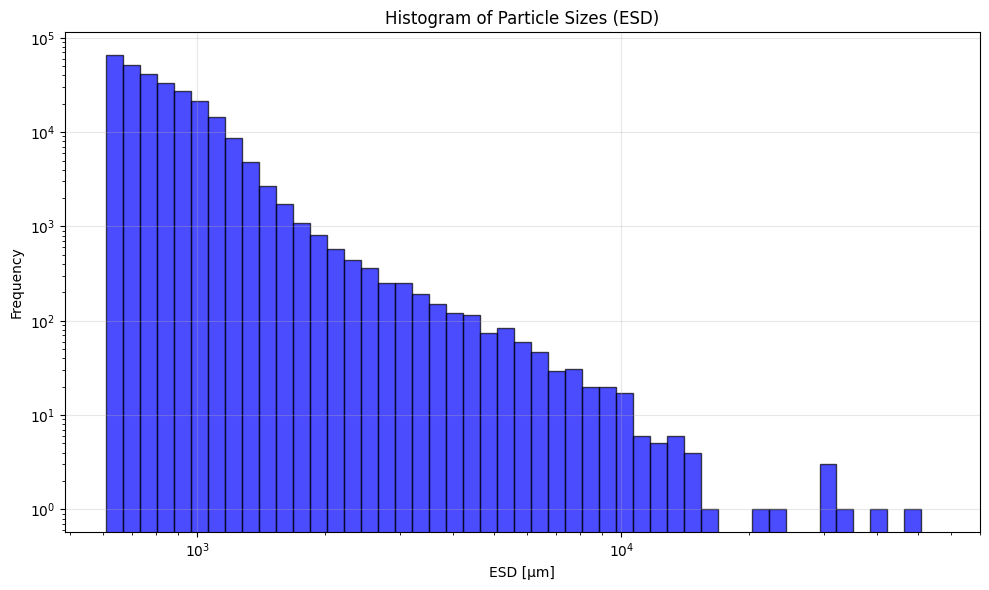

In [10]:
plot_path = '/home/fanny/plots'
plot_particle_size_histogram(df_five_profiles, plot_path)

In [11]:
# ============================================================================
# 5. DISTRIBUTION PLOTTING FUNCTIONS  
# ============================================================================

def plot_particle_size_distribution_vs_pressure(grouped_data, station_id: str, plot_path: str, 
                                            pressure_bin_size=5, depth_min=0, maximum_y_value=None):
    """
    Plot normalized particle abundance vs pressure for different ESD size classes.
    
    Creates a multi-axis plot with separate x-axes for each size class.
    
    Parameters:
    - grouped_data: DataFrame from bin_particles_by_pressure_and_size() 
    - station_id: str, identifier for the station/profile
    - plot_path: str, directory to save the plot
    - pressure_bin_size: Size of pressure bins used in binning
    - depth_min: Minimum depth offset
    - maximum_y_value: Maximum depth to plot (None = auto)
    """
    fig, ax1 = plt.subplots(figsize=(10,15))
    fig.subplots_adjust(top=0.97, bottom=0.2)
    ax1.invert_yaxis()

    # Create multiple x-axes for different size classes
    ax2 = ax1.twiny()
    ax3 = ax1.twiny()
    ax4 = ax1.twiny()
    ax5 = ax1.twiny()

    axes = [ax1, ax2, ax3, ax4, ax5]
    esd_bins = [1, 2, 3, 4, 5]
    esd_bin_names = ['<125μm', '125-250μm', '250-500μm', '500-1000μm', '>1000μm']
    colors = ['red', 'blue', 'lime', "dodgerblue", 'black']
    positions = [0, 40, 80, 120, 160]

    for ax, i, name, color, pos in zip(axes, esd_bins, esd_bin_names, colors, positions):
        if i in grouped_data.columns:
            ax.plot(grouped_data[i], grouped_data['pressure_bin']*pressure_bin_size+depth_min, 
                   color=color, label=name)
            ax.set_xlabel(f'Normalized abundance {name} [#/L]', color=color)
            ax.spines['bottom'].set_color(color)
            ax.tick_params(axis='x', colors=color)
            ax.spines['top'].set_visible(False)
            ax.spines['bottom'].set_position(('outward', pos))
            ax.xaxis.set_label_position('bottom')
            ax.xaxis.tick_bottom()
            
            if maximum_y_value is None:
                maximum_y_value = grouped_data['pressure_bin'].max() * pressure_bin_size + depth_min
            ax.set_ylim(top=0, bottom=maximum_y_value)

    ax1.set_ylabel('Pressure [dbar]')
    ax1.set_title(f'Particle Size Distribution vs Pressure\n{station_id}')

    filename = 'particle_size_distribution.png' if maximum_y_value is None else 'particle_size_distribution_zoom.png'
    fig.savefig(os.path.join(plot_path, filename))
    plt.show()
    plt.close(fig)


def plot_abundance_vs_pressure(grouped_data, taxo_group: str, plot_path: str, 
                           pressure_bin_size=1, preliminary=True, pressure_min=0, maximum_y_value=None):
    """
    Plot raw abundance counts vs depth for a taxonomic group.
    
    Parameters:
    - grouped_data: DataFrame from count_particles_by_pressure_and_size()
    - taxo_group: str, name of the taxonomic group
    - plot_path: str, directory to save the plot
    - pressure_bin_size: Size of pressure bins used
    - preliminary: bool, whether to add "Preliminary" to title
    - pressure_min: Minimum pressure offset
    - maximum_y_value: Maximum depth to plot
    """
    fig, ax1 = plt.subplots(figsize=(10, 12))
    ax1.invert_yaxis()

    esd_bins = [1, 2, 3, 4, 5]
    esd_bin_names = ['<125μm', '125-250μm', '250-500μm', '500-1000μm', '>1000μm']
    colors = ['red', 'blue', 'lime', "purple", 'black']

    for i, name, color in zip(esd_bins, esd_bin_names, colors):
        if i in grouped_data.columns:
            ax1.plot(
                grouped_data[i], 
                grouped_data['pressure_bin'] * pressure_bin_size + pressure_min, 
                color=color, 
                label=name
            )
    
    ax1.set_xlabel('Abundance (count)')
    ax1.set_ylabel('Pressure [dbar]')
    title = f'{taxo_group} Abundance\nPreliminary' if preliminary else f'{taxo_group} Abundance'
    ax1.set_title(title)
    
    if maximum_y_value is not None:
        ax1.set_ylim(top=0, bottom=maximum_y_value)
    ax1.legend(loc='best', fontsize='small')

    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, f'abundance_vs_depth_{taxo_group}.png'))
    plt.show()
    plt.close(fig)


def plot_biovolume_vs_pressure(grouped_data, taxo_group: str, plot_path: str, 
                         pressure_bin_size=1, preliminary=True, depth_min=0, maximum_y_value=None):
    """
    Plot biovolume distribution vs pressure for a taxonomic group.
    
    Parameters:
    - grouped_data: DataFrame from sum_biovolume_by_pressure_and_size()
    - taxo_group: str, name of the taxonomic group
    - plot_path: str, directory to save the plot
    - pressure_bin_size: Size of pressure bins used
    - preliminary: bool, whether to add "Preliminary" to title
    - depth_min: Minimum depth offset
    - maximum_y_value: Maximum depth to plot
    """
    fig, ax1 = plt.subplots(figsize=(10, 12))
    ax1.invert_yaxis()

    esd_bins = [1, 2, 3, 4, 5]
    esd_bin_names = ['<125μm', '125-250μm', '250-500μm', '500-1000μm', '>1000μm']
    colors = ['red', 'blue', 'lime', "purple", 'black']

    for i, name, color in zip(esd_bins, esd_bin_names, colors):
        if i in grouped_data.columns:
            ax1.plot(
                grouped_data[i], 
                grouped_data['pressure_bin'] * pressure_bin_size + depth_min, 
                color=color, 
                label=name
            )

    ax1.set_xlabel('Biovolume [μm³]')
    ax1.set_ylabel('Pressure [dbar]')
    title = f'{taxo_group} Biovolume\nPreliminary' if preliminary else f'{taxo_group} Biovolume'
    ax1.set_title(title)
    
    if maximum_y_value is not None:
        ax1.set_ylim(top=0, bottom=maximum_y_value)
    ax1.legend(loc='best', fontsize='small')

    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, f'biovolume_vs_pressure_{taxo_group}.png'))
    plt.show()
    plt.close(fig)

In [12]:
# ============================================================================
# 6. ENVIRONMENTAL DATA PLOTTING
# ============================================================================

def plot_ctd_profile(df, station_id: str, plot_path: str, maximum_y_value=None):
    """
    Plot multi-parameter CTD profile data vs depth.
    
    Creates a multi-axis plot showing salinity, temperature, oxygen, 
    chlorophyll, and z-factor profiles.
    
    Parameters:
    - df: DataFrame with CTD data and interpolated environmental variables
    - station_id: str, identifier for the station/profile  
    - plot_path: str, directory to save the plot
    - maximum_y_value: Maximum depth to plot (None = auto)
    """
    fig, ax1 = plt.subplots(figsize=(10,15))
    fig.subplots_adjust(top=0.97, bottom=0.2)
    ax1.invert_yaxis()

    # Create multiple x-axes for different parameters
    ax2 = ax1.twiny()
    ax3 = ax1.twiny()
    ax4 = ax1.twiny()
    ax5 = ax1.twiny()

    axes = [ax1, ax2, ax3, ax4, ax5]
    parameter_names = [
        'object_interpolated_s',      # Salinity
        'object_interpolated_t',      # Temperature  
        'object_interpolated_o',      # Oxygen
        'object_interpolated_chl',    # Chlorophyll
        'object_interpolated_z_factor' # Z-factor
    ]
    display_names = ['Salinity', 'Temperature [°C]', 'Oxygen', 'Chlorophyll', 'Z-factor']
    colors = ['red', 'blue', 'lime', 'cyan', 'black']
    positions = [0, 40, 80, 120, 160]

    for ax, param_name, display_name, color, pos in zip(axes, parameter_names, display_names, colors, positions):
        if param_name in df.columns:
            ax.plot(df[param_name], df['object_pressure'], color=color, label=display_name)
            ax.set_xlabel(display_name, color=color)
            ax.spines['bottom'].set_color(color)
            ax.tick_params(axis='x', colors=color)
            ax.spines['top'].set_visible(False)
            ax.spines['bottom'].set_position(('outward', pos))
            ax.xaxis.set_label_position('bottom')
            ax.xaxis.tick_bottom()
            
            ylim = maximum_y_value if maximum_y_value is not None else df['object_pressure'].max()
            ax.set_ylim(top=0, bottom=ylim)

    ax1.set_ylabel('Depth [dbar]')
    ax1.set_title(f'CTD Profile\n{station_id}')

    filename = 'ctd_profile.png' if maximum_y_value is None else 'ctd_profile_zoom.png'
    fig.savefig(os.path.join(plot_path, filename))
    plt.show()
    plt.close(fig)


# ============================================================================
# 7. ADVANCED COMPARISON PLOTS
# ============================================================================

def plot_pss_wbs_comparison(df, all_images_df, plot_path, station_id="", depth_bin_size=5):
    """
    4-panel comparison plot: Fixed size classes vs PSS/WBS approaches.
    
    Compares your traditional fixed size class approach with advanced 
    Particle Size Spectrum and Weighted Biomass Spectrum methods.
    
    Parameters:
    - df: DataFrame with particle data
    - all_images_df: DataFrame with image metadata
    - plot_path: str, directory to save the plot
    - station_id: str, identifier for the station
    - depth_bin_size: Size of depth bins
    """
    
    # Traditional approach with fixed size classes
    esd_bins_fixed = np.array([0, 125, 250, 500, 1000, 100000])
    hist_fixed, pivot_fixed = bin_particles_by_pressure_and_size(
        df, all_images_df, depth_bin_size, esd_bins_fixed, VOLUME_PER_IMAGE_LITERS
    )
    
    # PSS/WBS approach with log-spaced bins
    hist_log, pivot_log, pss_wbs_df = calculate_particle_size_spectrum(
        df, all_images_df, depth_bin_size, VOLUME_PER_IMAGE_LITERS=VOLUME_PER_IMAGE_LITERS
    )
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # Plot 1: Traditional fixed size classes
    ax1 = axes[0, 0]
    esd_bins = [1, 2, 3, 4, 5]
    esd_bin_names = ['<125μm', '125-250μm', '250-500μm', '500-1000μm', '>1000μm']
    colors = ['red', 'blue', 'lime', "purple", 'black']
    
    for i, name, color in zip(esd_bins, esd_bin_names, colors):
        if i in pivot_fixed.columns:
            ax1.plot(pivot_fixed[i], pivot_fixed['pressure_bin'] * depth_bin_size, 
                    color=color, label=name, linewidth=2)
    
    ax1.set_xlabel('Normalized Abundance [# L⁻¹]')
    ax1.set_ylabel('Depth [dbar]')
    ax1.set_title(f'Fixed Size Classes\n{station_id}')
    ax1.invert_yaxis()
    ax1.legend(fontsize='small')
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: PSS (Particle Size Spectrum)
    ax2 = axes[0, 1]
    size_classes = sorted(pss_wbs_df['size_center_mm'].unique())
    colors_pss = plt.cm.viridis(np.linspace(0, 1, len(size_classes)))
    
    for i, size_class in enumerate(size_classes):
        size_data = pss_wbs_df[pss_wbs_df['size_center_mm'] == size_class]
        if len(size_data) > 0:
            ax2.plot(size_data['pss'], size_data['pressure_center'], 
                    color=colors_pss[i], label=f'{size_class:.3f} mm', linewidth=2)
    
    ax2.set_xscale('log')
    ax2.set_xlabel('PSS [# L⁻¹ mm⁻¹]')
    ax2.set_ylabel('Depth [dbar]')
    ax2.set_title(f'Particle Size Spectrum\n{station_id}')
    ax2.invert_yaxis()
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: WBS (Weighted Biomass Spectrum)
    ax3 = axes[1, 0]
    for i, size_class in enumerate(size_classes):
        size_data = pss_wbs_df[pss_wbs_df['size_center_mm'] == size_class]
        if len(size_data) > 0:
            ax3.plot(size_data['wbs'], size_data['pressure_center'], 
                    color=colors_pss[i], label=f'{size_class:.3f} mm', linewidth=2)
    
    ax3.set_xscale('log')
    ax3.set_xlabel('WBS [mg L⁻¹]')
    ax3.set_ylabel('Depth [dbar]')
    ax3.set_title(f'Weighted Biomass Spectrum\n{station_id}')
    ax3.invert_yaxis()
    ax3.grid(True, alpha=0.3)
    
    # Plot 4: Classic PSS vs Size plot for different depths
    ax4 = axes[1, 1]
    depth_ranges = [(0, 100), (100, 200), (200, 400)]
    colors_depth = plt.cm.plasma(np.linspace(0, 1, len(depth_ranges)))
    
    for i, (depth_min, depth_max) in enumerate(depth_ranges):
        depth_data = pss_wbs_df[
            (pss_wbs_df['pressure_center'] >= depth_min) & 
            (pss_wbs_df['pressure_center'] < depth_max)
        ]
        
        if len(depth_data) > 0:
            # Average PSS for each size class in this depth range
            size_averaged = depth_data.groupby('size_center_mm')['pss'].mean().reset_index()
            
            ax4.loglog(size_averaged['size_center_mm'], size_averaged['pss'], 
                      'o-', color=colors_depth[i], label=f'{depth_min}-{depth_max} dbar', 
                      linewidth=2, markersize=6)
    
    # # Add reference slope line (slope = -2)
    # if len(size_averaged) > 0:
    #     x_ref = np.array([size_averaged['size_center_mm'].min(), size_averaged['size_center_mm'].max()])
    #     y_ref = x_ref**(-2) * 1e6  # Adjust scaling as needed
    #     ax4.plot(x_ref, y_ref, '--', color='gray', alpha=0.7, label='Slope = -2')
    
    ax4.set_xlabel('Particle Size [mm]')
    ax4.set_ylabel('PSS [# L⁻¹ mm⁻¹]')
    ax4.set_title('PSS vs Size (Classic Plot)')
    ax4.legend(fontsize='small')
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, f'pss_wbs_comparison_{station_id}.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    return hist_fixed, pivot_fixed, pss_wbs_df


def plot_biovolume_vs_size_by_class(df, main_groups, plot_path):
    """
    Plot biovolume vs ESD for each taxonomic class in separate subplots.
    
    Parameters:
    - df: DataFrame with particle data including taxonomic annotations
    - main_groups: list of taxonomic group names to plot
    - plot_path: str, directory to save the plot
    """
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    for i, group in enumerate(main_groups):
        if i < len(axes):
            # Filter data for this taxonomic group
            group_df = df[df["object_annotation_hierarchy"].str.contains(group, na=False)]
            
            if not group_df.empty:
                # Calculate biovolume if not present
                if 'volume_um3' not in group_df.columns:
                    group_df = group_df.copy()
                    group_df['volume_um3'] = (4/3) * np.pi * (group_df['object_esd']/2)**3
                
                # Create scatter plot
                axes[i].scatter(group_df['object_esd'], group_df['volume_um3'], 
                              alpha=0.6, s=20, color='blue')
                
                axes[i].set_xlabel('ESD [μm]')
                axes[i].set_ylabel('Biovolume [μm³]')
                axes[i].set_title(f'{group}\nBiovolume vs ESD')
                axes[i].set_xscale('log')
                axes[i].set_yscale('log')
                axes[i].grid(True, alpha=0.3)
            else:
                axes[i].text(0.5, 0.5, f'No data for {group}', 
                           transform=axes[i].transAxes, ha='center', va='center')
                axes[i].set_title(f'{group}\nNo data')
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, 'biovolume_vs_esd_by_taxonomic_class.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


def plot_abundance_vs_size_by_class(df, main_groups, plot_path):
    """
    Plot abundance (count) vs ESD for each taxonomic class in separate subplots.
    
    Parameters:
    - df: DataFrame with particle data including taxonomic annotations
    - main_groups: list of taxonomic group names to plot
    - plot_path: str, directory to save the plot
    """
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    for i, group in enumerate(main_groups):
        if i < len(axes):
            # Filter data for this taxonomic group
            group_df = df[df["object_annotation_hierarchy"].str.contains(group, na=False)]
            
            if not group_df.empty:
                # Create ESD bins for counting
                esd_bins = np.logspace(np.log10(group_df['object_esd'].min()), 
                                     np.log10(group_df['object_esd'].max()), 
                                     num=30)
                
                # Count particles in each bin
                counts, bin_edges = np.histogram(group_df['object_esd'], bins=esd_bins)
                bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
                
                # Plot as line with markers
                axes[i].plot(bin_centers, counts, 'o-', color='red', linewidth=2, markersize=4)
                
                axes[i].set_xlabel('ESD [μm]')
                axes[i].set_ylabel('Abundance (count)')
                axes[i].set_title(f'{group}\nAbundance vs ESD')
                axes[i].set_xscale('log')
                axes[i].set_yscale('log')
                axes[i].grid(True, alpha=0.3)
            else:
                axes[i].text(0.5, 0.5, f'No data for {group}', 
                           transform=axes[i].transAxes, ha='center', va='center')
                axes[i].set_title(f'{group}\nNo data')
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, 'abundance_vs_esd_by_taxonomic_class.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

Found 24345 matching images for profiles: ['M181-112-1_CTD-037']


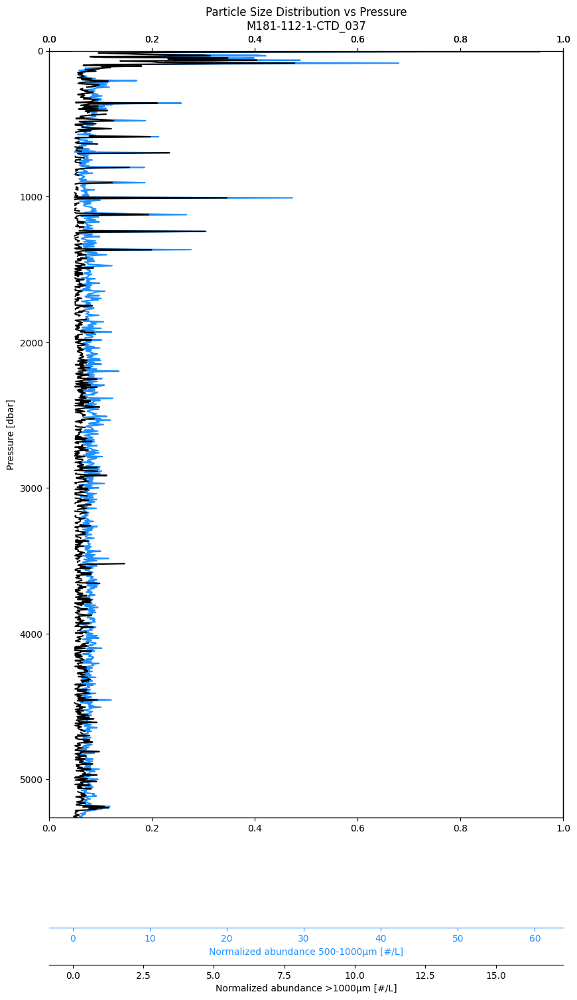

In [432]:
histogram, pivoted_df = bin_particles_by_pressure_and_size(M1811121CTD037_df, all_images_df, pressure_bin_size=5)
plot_particle_size_distribution_vs_pressure(pivoted_df, station_id='M181-112-1-CTD_037', plot_path='/home/fanny/plots')

In [433]:
pivoted_df

esd_bin,pressure_bin,4,5
0,0,0.000000,0.000000
1,1,60.671756,16.564885
2,2,19.085714,3.914286
3,3,3.517391,0.908696
4,4,7.931034,1.793103
...,...,...,...
1045,1048,1.600000,0.120000
1046,1049,1.258065,0.225806
1047,1050,1.233333,0.100000
1048,1051,0.881356,0.033898


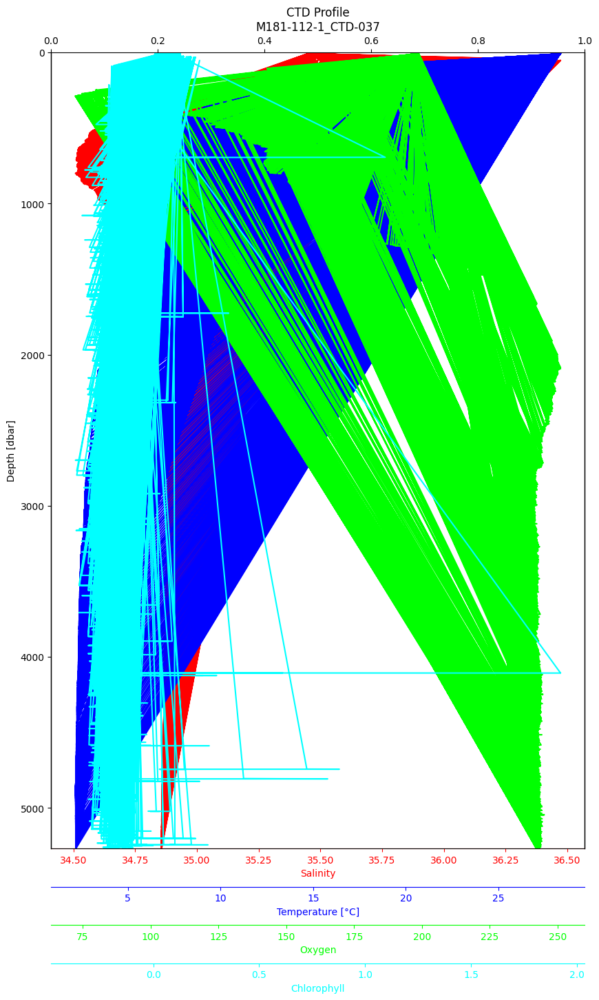

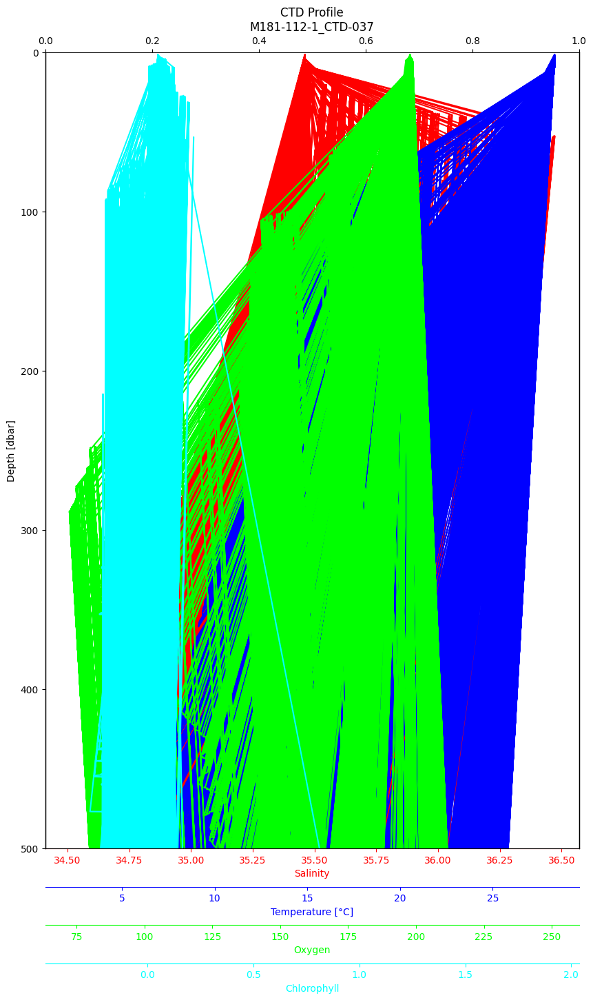

In [434]:
plot_ctd_profile(M1811121CTD037_df, 'M181-112-1_CTD-037', plot_path)
plot_ctd_profile(M1811121CTD037_df, 'M181-112-1_CTD-037', plot_path, maximum_y_value=500)

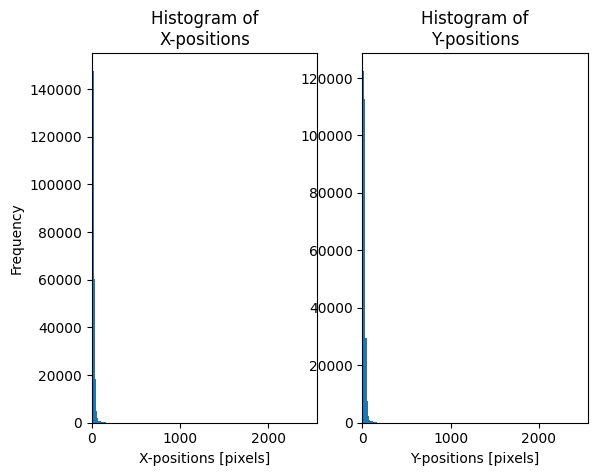

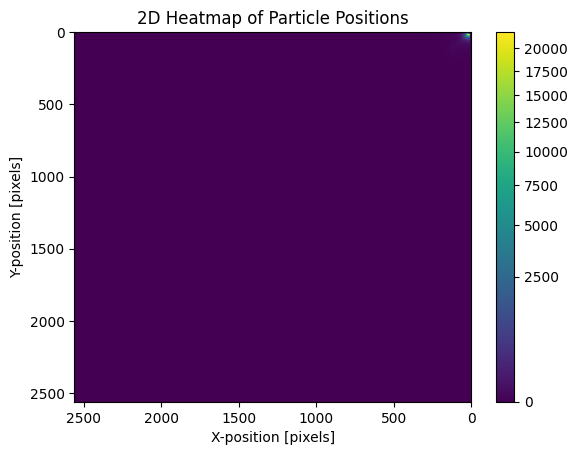

In [435]:
plot_particle_positions(df, plot_path)
plot_particle_position_heatmap(df, plot_path)
df = add_position_density(df)

### create dfs for main groups ###

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']
Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']
Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']
Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']
Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']
Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


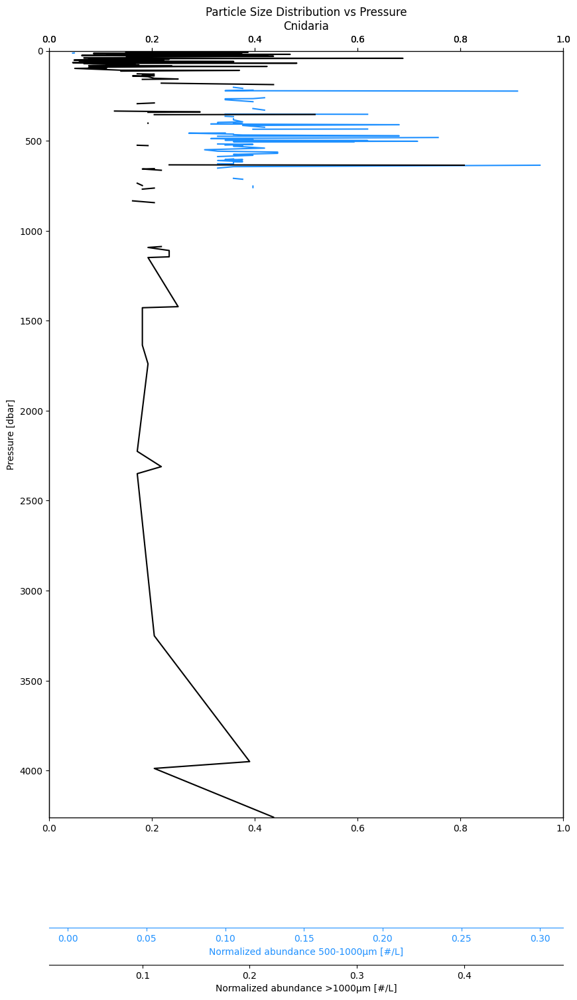

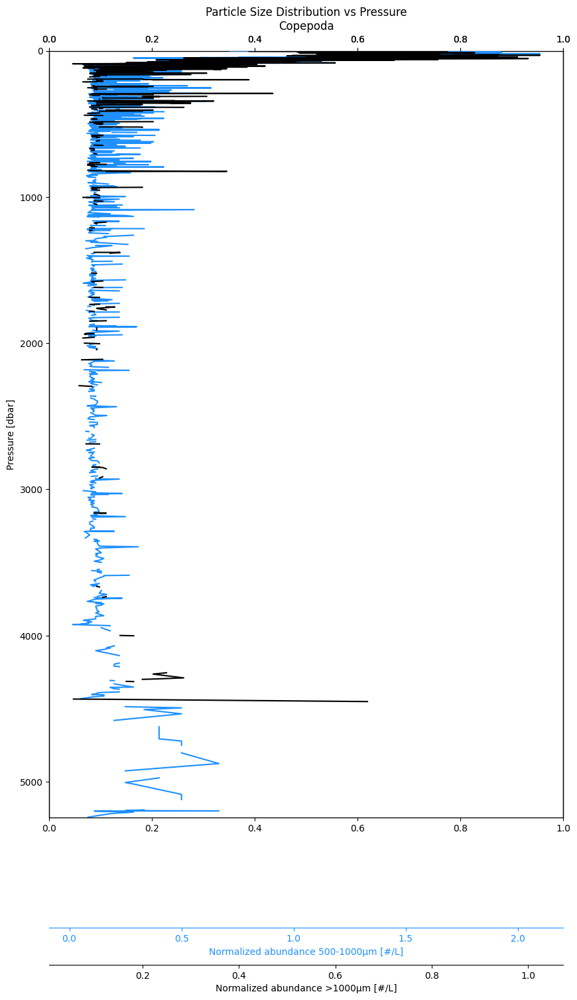

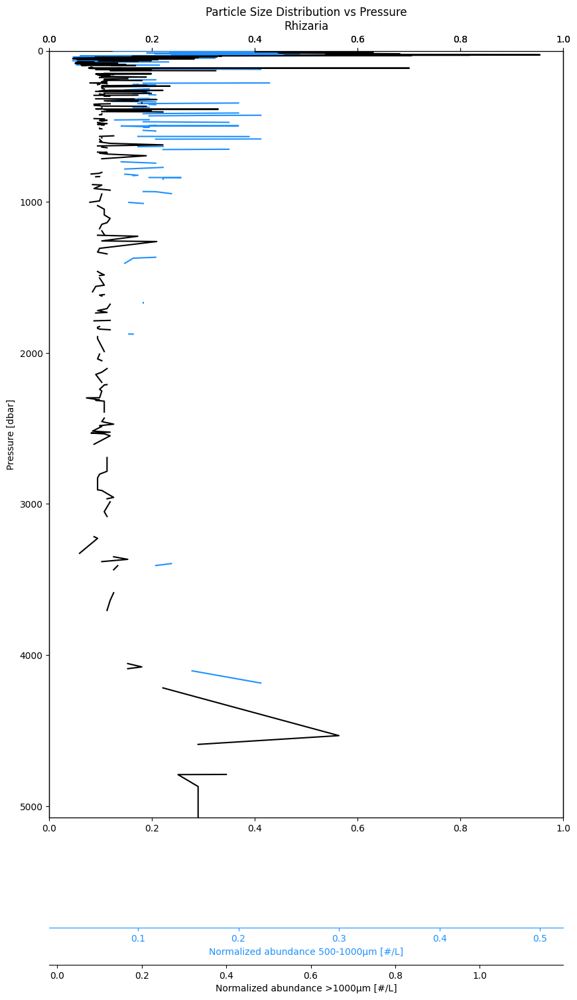

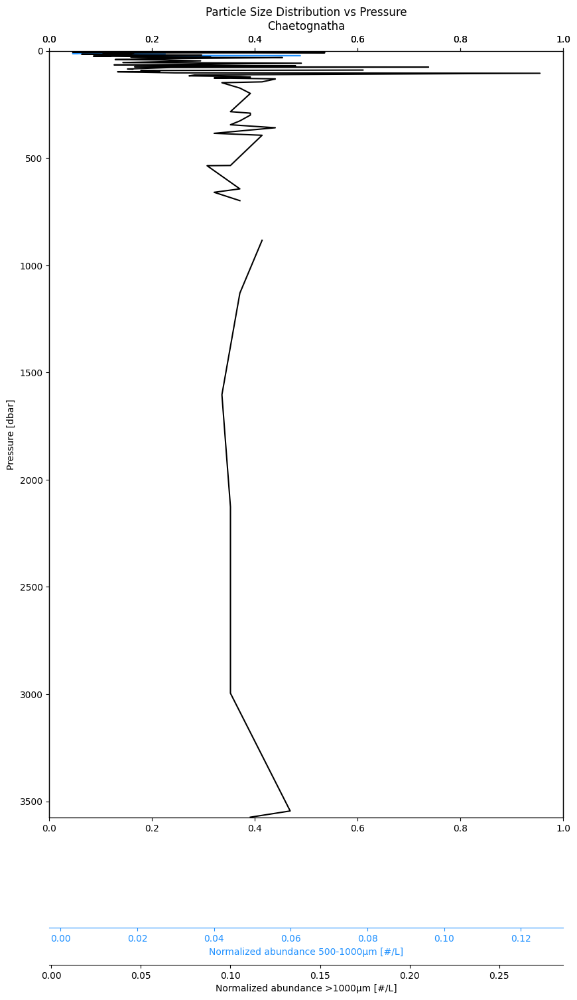

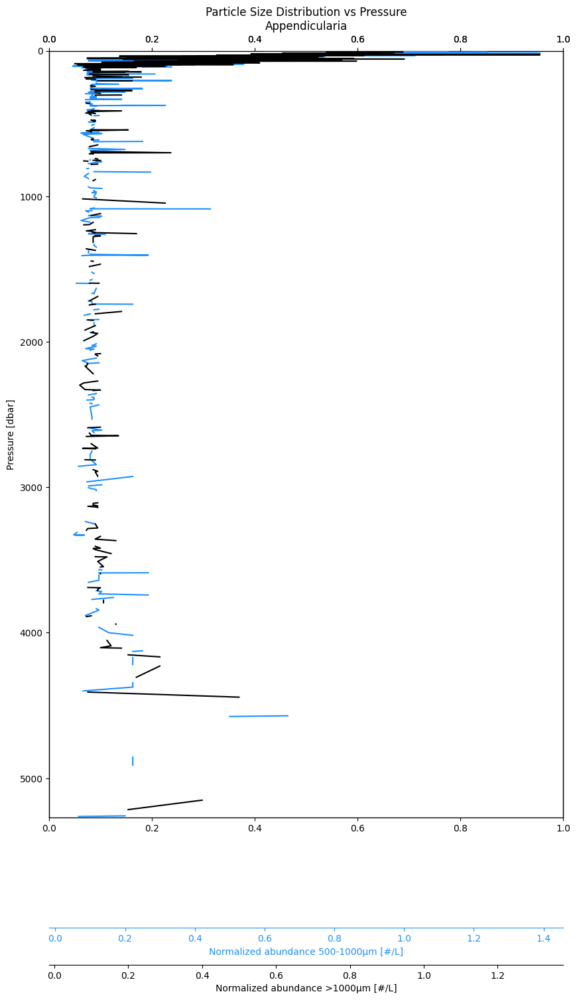

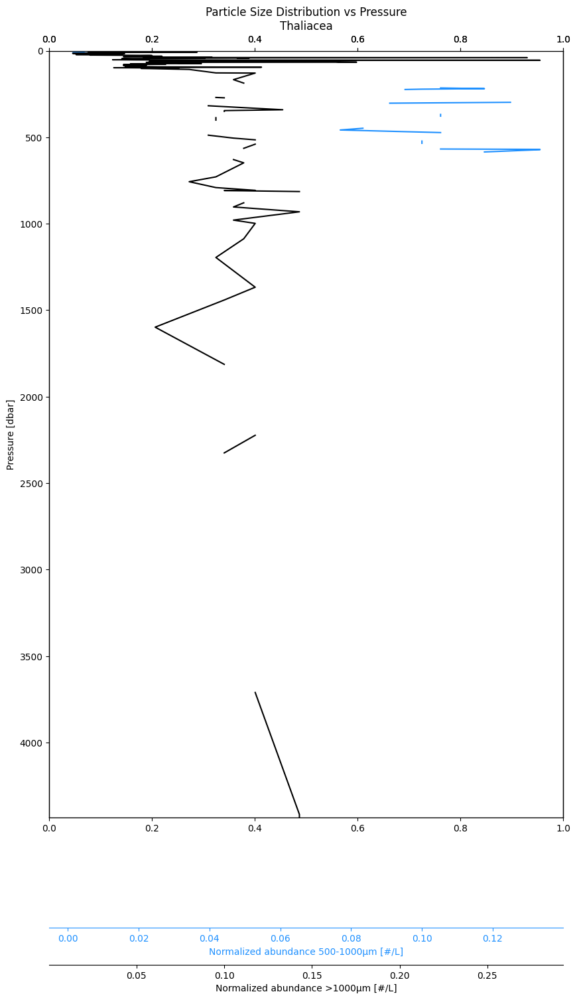

In [436]:
main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
grouped_dfs = {group: df[df["object_annotation_hierarchy"].str.contains(group, na=False)] for group in main_groups}

# Define your ESD bins and pressure bin size
#esd_bins = np.array([0, 125, 250, 500, 1000, 100000])
#pressure_bin_size = 1  # or whatever interval you prefer

# Create a dictionary to hold the binned DataFrames
binned_grouped_dfs = {}

for group, group_df in grouped_dfs.items():
    # Only process if the group DataFrame is not empty
    if not group_df.empty:
        histogram_, pivoted_df = bin_particles_by_pressure_and_size(
            group_df,
            all_images_df,
            pressure_bin_size=pressure_bin_size,
            esd_bins=esd_bins
        )
        binned_grouped_dfs[group] = pivoted_df

for group, pivoted_df in binned_grouped_dfs.items():
    plot_particle_size_distribution_vs_pressure(
        pivoted_df, 
        station_id=f'{group}', 
        plot_path=plot_path,
        pressure_bin_size=pressure_bin_size
    )

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


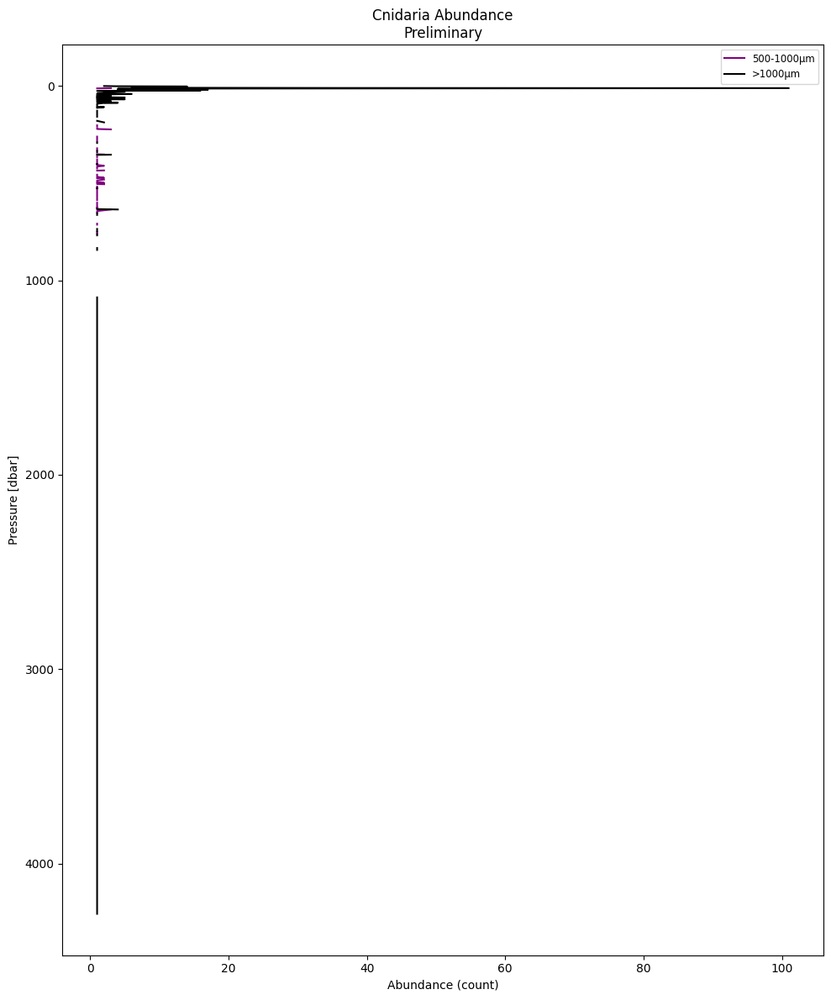

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


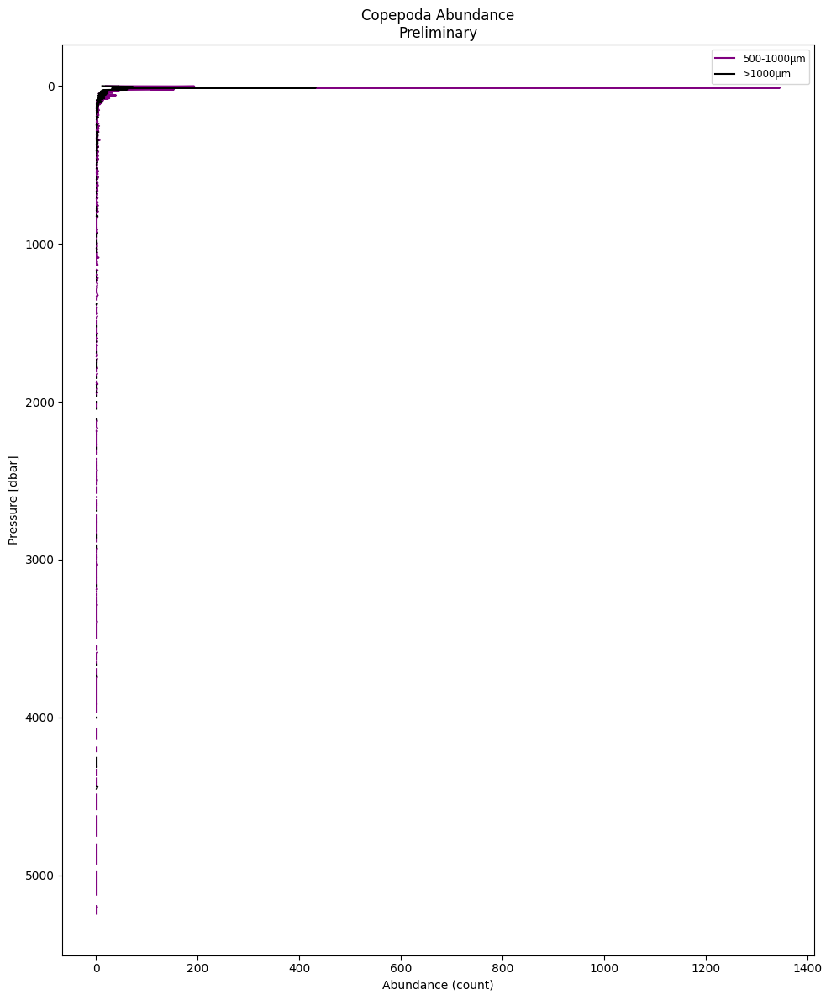

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


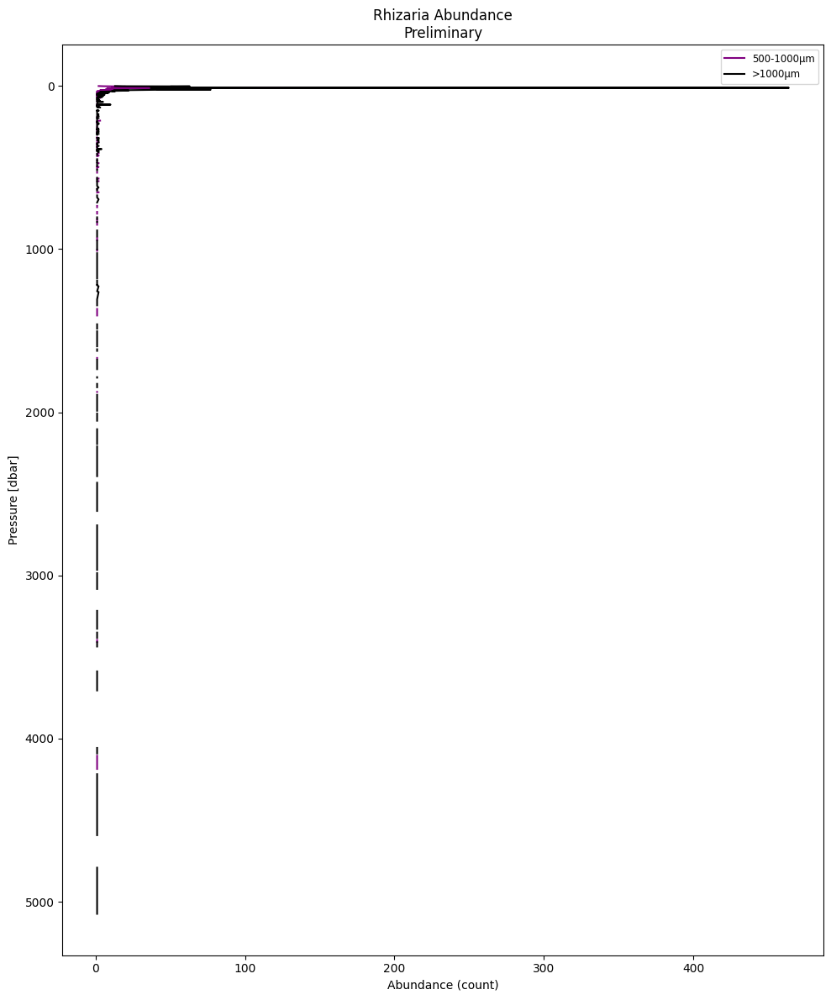

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


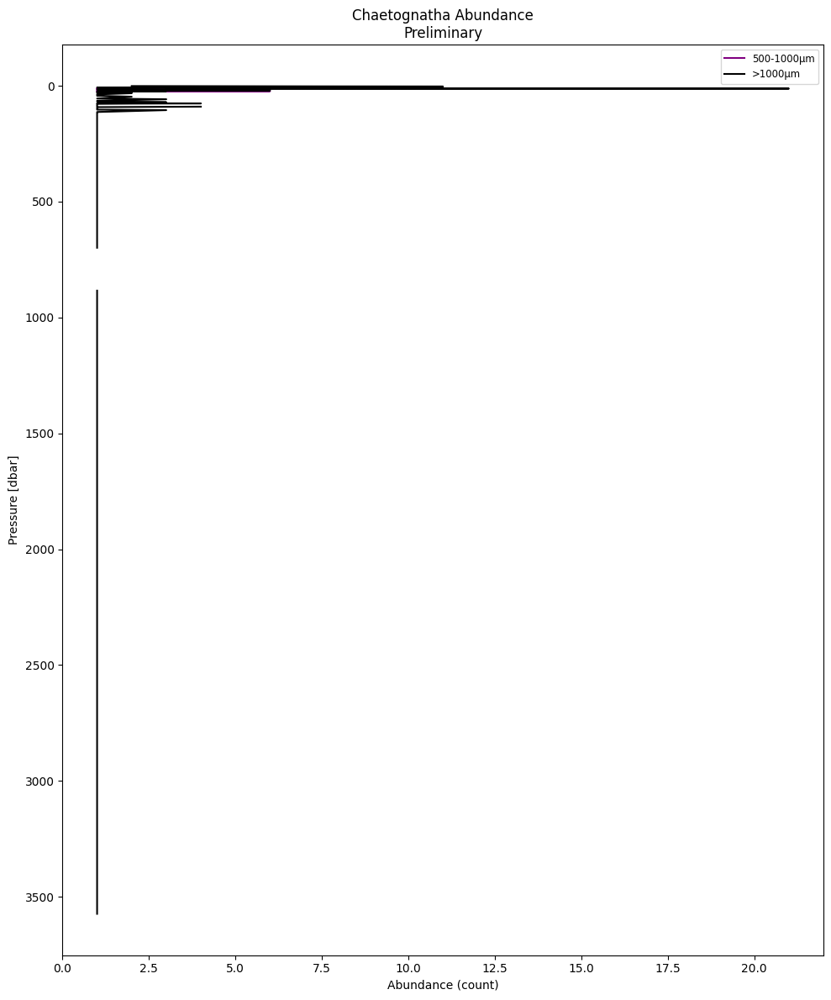

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


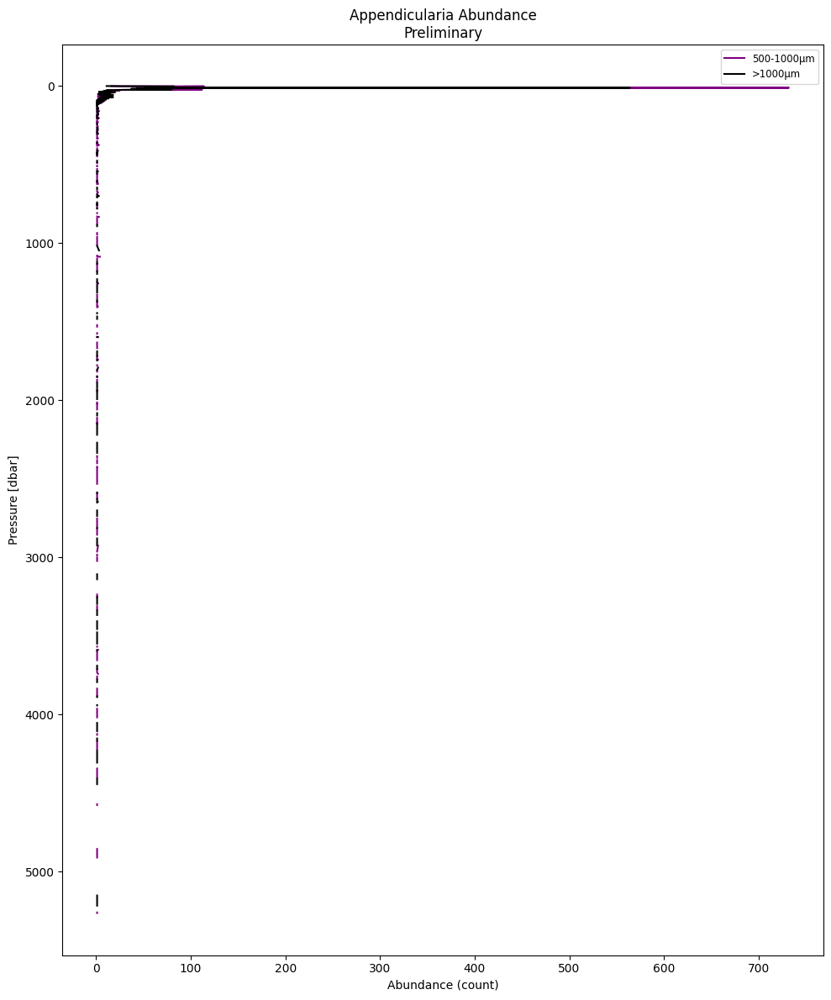

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


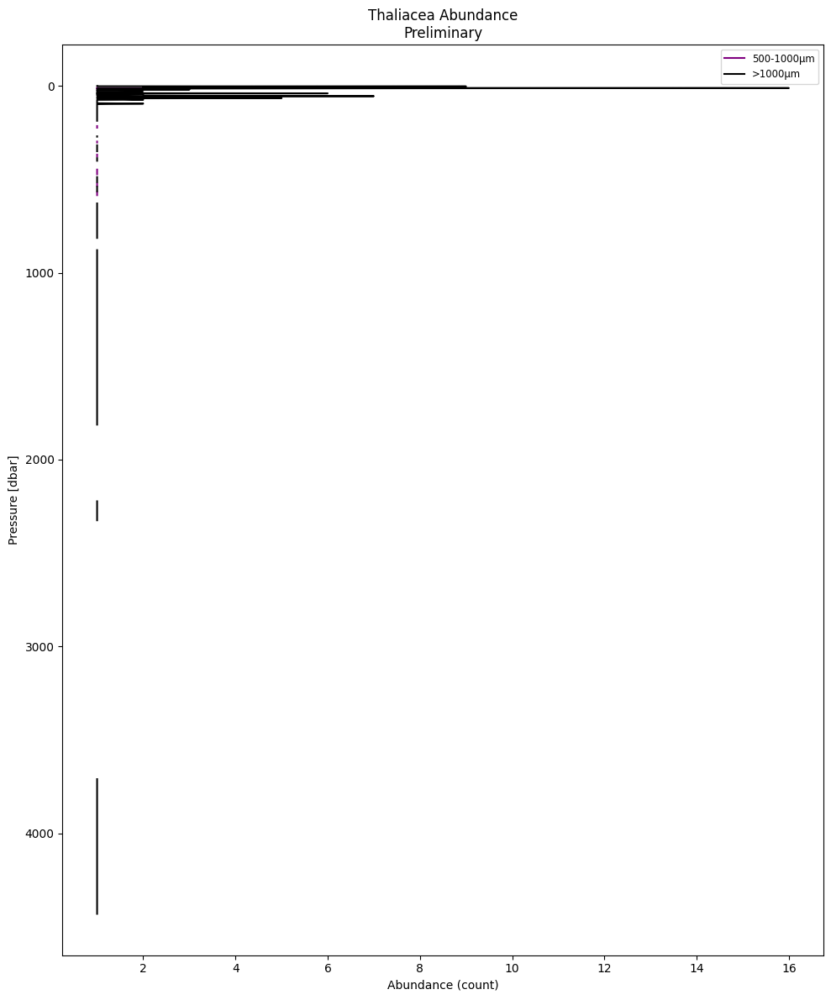

In [437]:
for group, group_df in grouped_dfs.items():
    if not group_df.empty:
        histogram, pivoted_abundance = count_particles_by_pressure_and_size(
            group_df,
            all_images_df,
            pressure_bin_size=1,
            esd_bins=esd_bins
        )
        plot_abundance_vs_pressure(
            pivoted_abundance,
            taxo_group=group,
            plot_path=plot_path,
            pressure_bin_size=1,
            preliminary=True,
            pressure_min=0
        )

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


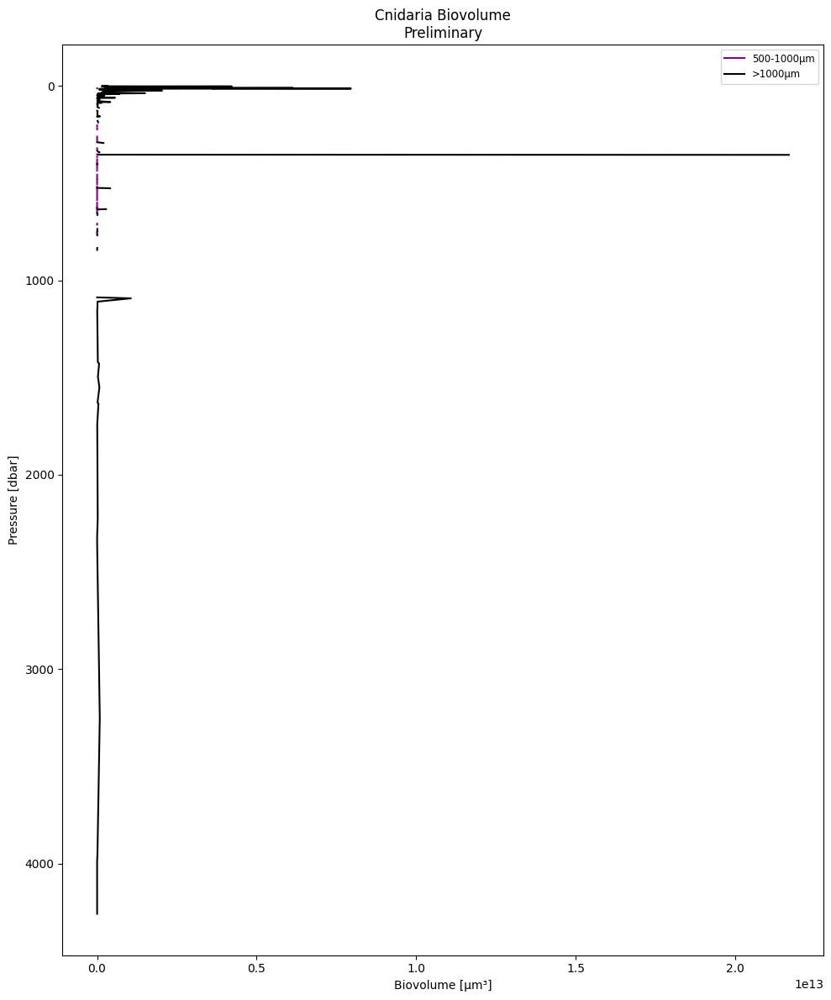

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


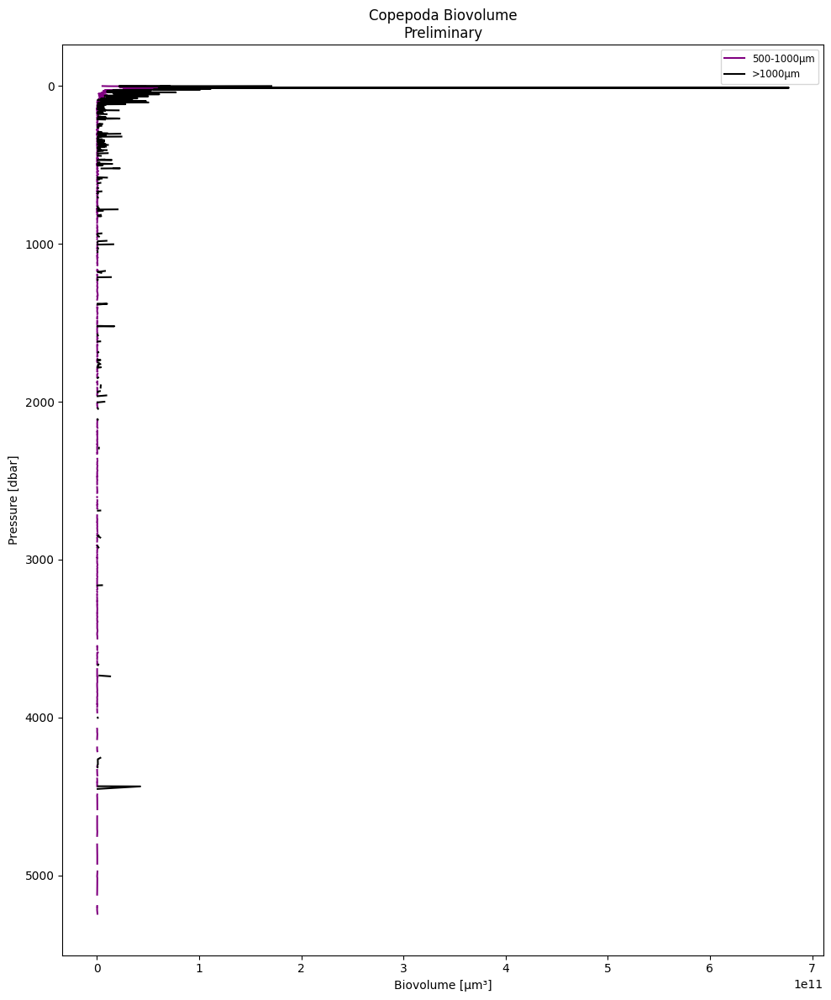

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


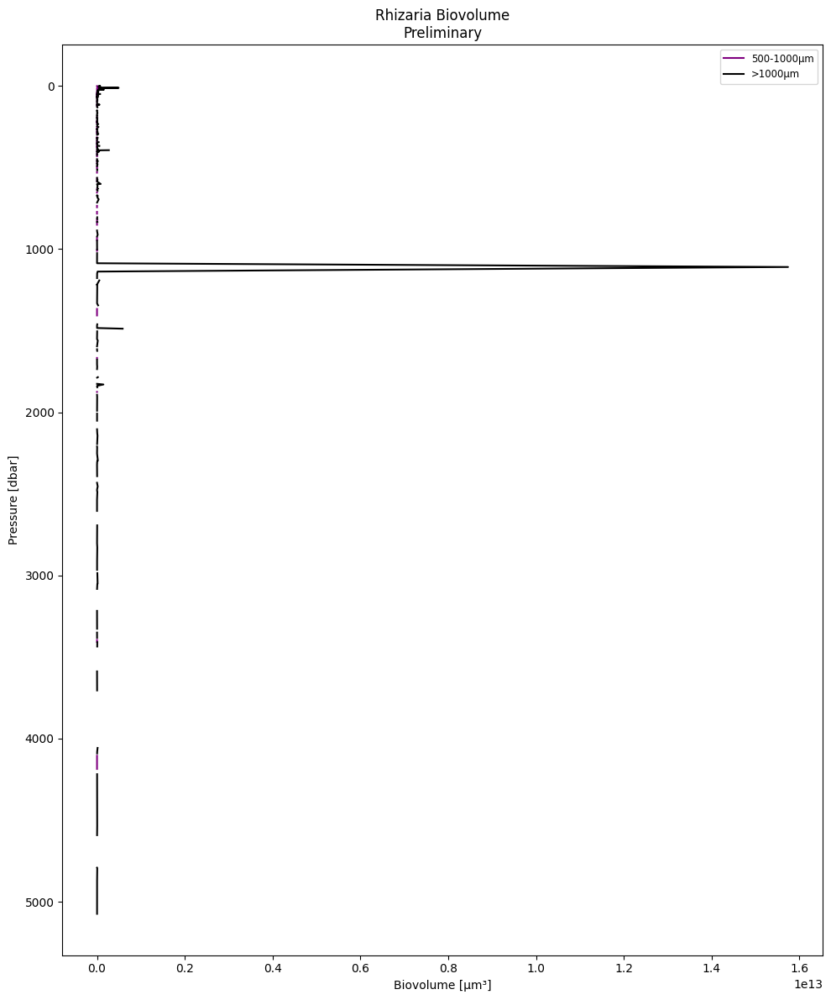

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


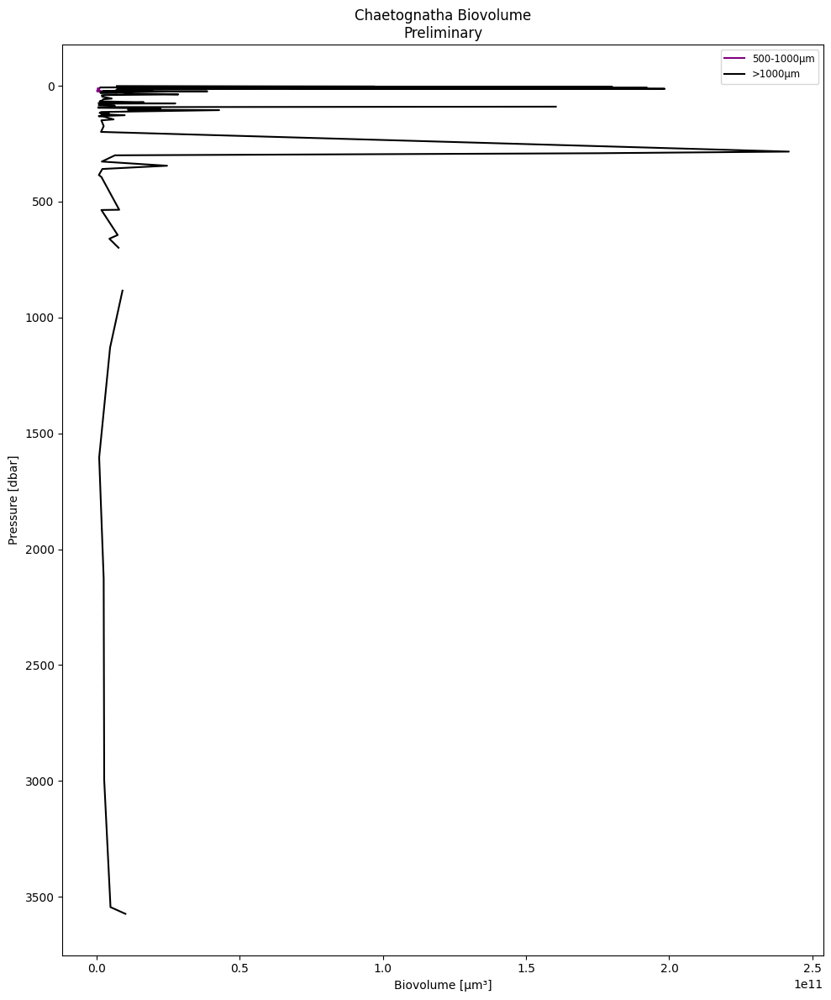

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


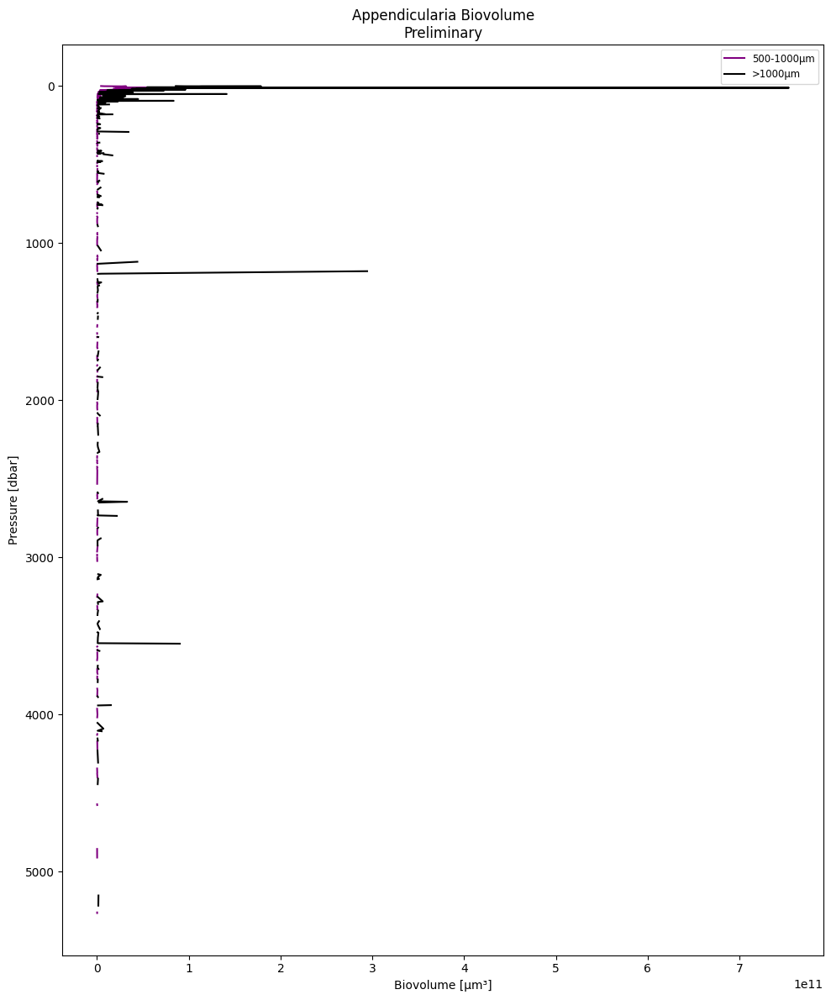

Found 91632 matching images for profiles: ['M181-175-1_CTD-050' 'M181-112-1_CTD-037' 'M181-227-1_CTD-060'
 'M181-285-1_CTD-075' 'M181-297-1_CTD-081']


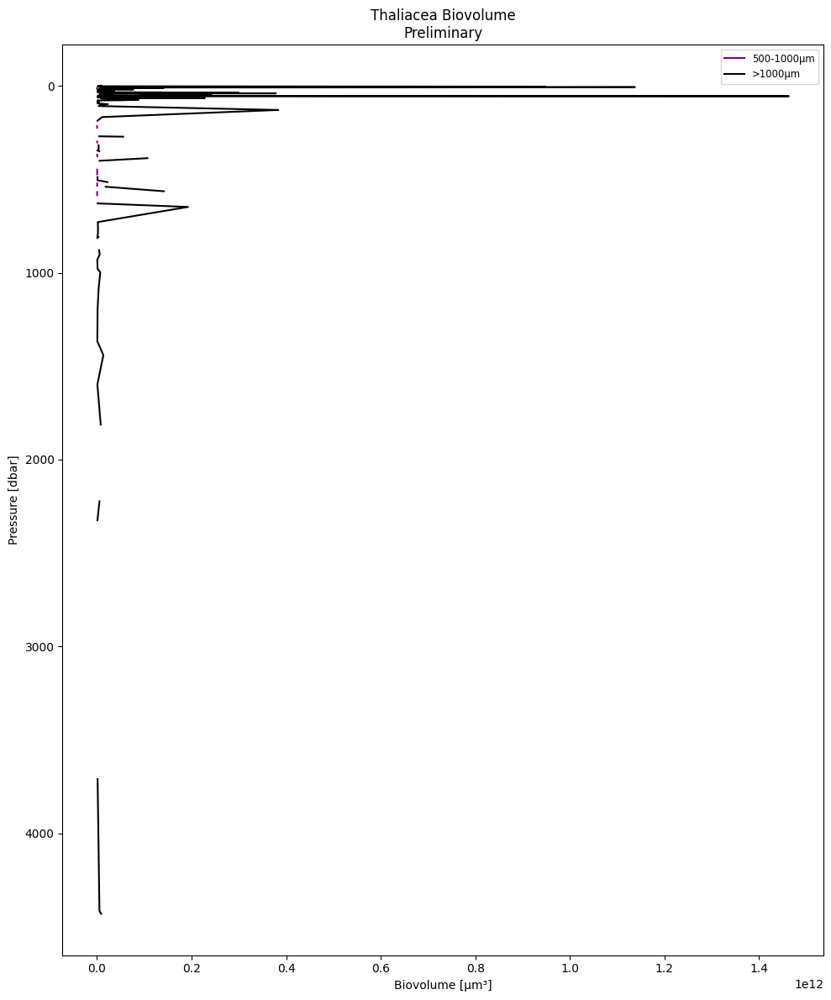

In [438]:
for group, group_df in grouped_dfs.items():
    if not group_df.empty:
        group_df = calculate_biovol(group_df)
        _, pivoted_biovolume = sum_biovolume_by_pressure_and_size(
            group_df,
            all_images_df,
            pressure_bin_size=pressure_bin_size,
            esd_bins=esd_bins
        )
        plot_biovolume_vs_pressure(
            pivoted_biovolume,
            taxo_group=group,
            plot_path=plot_path,
            preliminary=True,
        )

Found 20521 matching images for profiles: ['M181-175-1_CTD-050']
Found 24345 matching images for profiles: ['M181-112-1_CTD-037']
Found 13004 matching images for profiles: ['M181-227-1_CTD-060']
Found 16641 matching images for profiles: ['M181-285-1_CTD-075']
Found 17121 matching images for profiles: ['M181-297-1_CTD-081']
Found 20521 matching images for profiles: ['M181-175-1_CTD-050']
Found 24345 matching images for profiles: ['M181-112-1_CTD-037']
Found 13004 matching images for profiles: ['M181-227-1_CTD-060']
Found 16641 matching images for profiles: ['M181-285-1_CTD-075']
Found 17121 matching images for profiles: ['M181-297-1_CTD-081']
Found 20521 matching images for profiles: ['M181-175-1_CTD-050']
Found 24345 matching images for profiles: ['M181-112-1_CTD-037']
Found 13004 matching images for profiles: ['M181-227-1_CTD-060']
Found 16641 matching images for profiles: ['M181-285-1_CTD-075']
Found 17121 matching images for profiles: ['M181-297-1_CTD-081']
Found 20521 matching imag

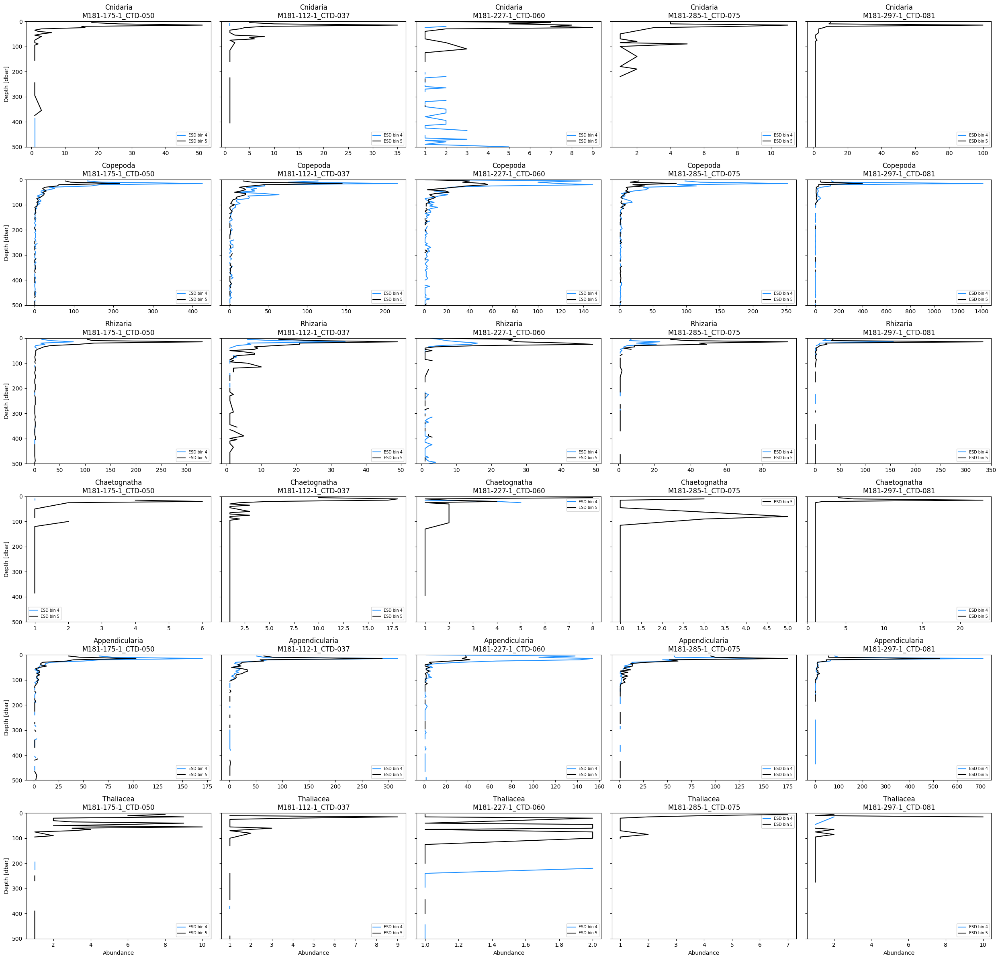

In [439]:
profiles = list(df['sample_id'].unique())
n_profiles = len(profiles)
n_groups = len(main_groups)

# Define your ESD bins and depth bin size
esd_bins = np.array([0, 125, 250, 500, 1000, 100000])
depth_bin_size = 5  # or whatever interval you prefer

fig, axes = plt.subplots(n_groups, n_profiles, figsize=(5*n_profiles, 4*n_groups), sharey=True)

for i, group in enumerate(main_groups):
    for j, profile_name in enumerate(profiles):
        profile_df = df[df['sample_id'] == profile_name]
        group_df = profile_df[profile_df["object_annotation_hierarchy"].str.contains(group, na=False)].copy()
        if not group_df.empty:
            _, pivoted_abundance = count_particles_by_pressure_and_size(
                group_df,
                all_images_df,
                pressure_bin_size=depth_bin_size,
                esd_bins=esd_bins,
            )

            # images per depth bin
            group_df['depth_bin'] = pd.cut(
                group_df['object_pressure'], 
                bins=np.arange(group_df['object_pressure'].min(), 
                               group_df['object_pressure'].max() + depth_bin_size, 
                               depth_bin_size), 
                labels=False
            )
            images_per_bin = (
                group_df.groupby('depth_bin')['object_time']
                .nunique()
                .reindex(pivoted_abundance['pressure_bin'], fill_value=0)
            )

            ax = axes[i, j] if n_groups > 1 and n_profiles > 1 else axes[max(i, j)]
            for k, color in zip([1,2,3,4,5], ['red', 'purple', 'lime', "dodgerblue", 'black']):
                if k in pivoted_abundance.columns:
                    ax.plot(
                        pivoted_abundance[k],
                        pivoted_abundance['pressure_bin'] * depth_bin_size,
                        color=color,
                        label=f'ESD bin {k}'
                    )

            ax.invert_yaxis()
            ax.set_title(f"{group}\n{profile_name[:18]}")
            ax.set_ylim(top=0, bottom=500)
            if j == 0:
                ax.set_ylabel('Depth [dbar]')
            if i == n_groups - 1:
                ax.set_xlabel('Abundance')
            ax.legend(fontsize='x-small')

plt.tight_layout()
plt.show()

Found 20521 matching images for profiles: ['M181-175-1_CTD-050']
Found 24345 matching images for profiles: ['M181-112-1_CTD-037']
Found 13004 matching images for profiles: ['M181-227-1_CTD-060']
Found 16641 matching images for profiles: ['M181-285-1_CTD-075']
Found 17121 matching images for profiles: ['M181-297-1_CTD-081']
Found 20521 matching images for profiles: ['M181-175-1_CTD-050']
Found 24345 matching images for profiles: ['M181-112-1_CTD-037']
Found 13004 matching images for profiles: ['M181-227-1_CTD-060']
Found 16641 matching images for profiles: ['M181-285-1_CTD-075']
Found 17121 matching images for profiles: ['M181-297-1_CTD-081']
Found 20521 matching images for profiles: ['M181-175-1_CTD-050']
Found 24345 matching images for profiles: ['M181-112-1_CTD-037']
Found 13004 matching images for profiles: ['M181-227-1_CTD-060']
Found 16641 matching images for profiles: ['M181-285-1_CTD-075']
Found 17121 matching images for profiles: ['M181-297-1_CTD-081']
Found 20521 matching imag

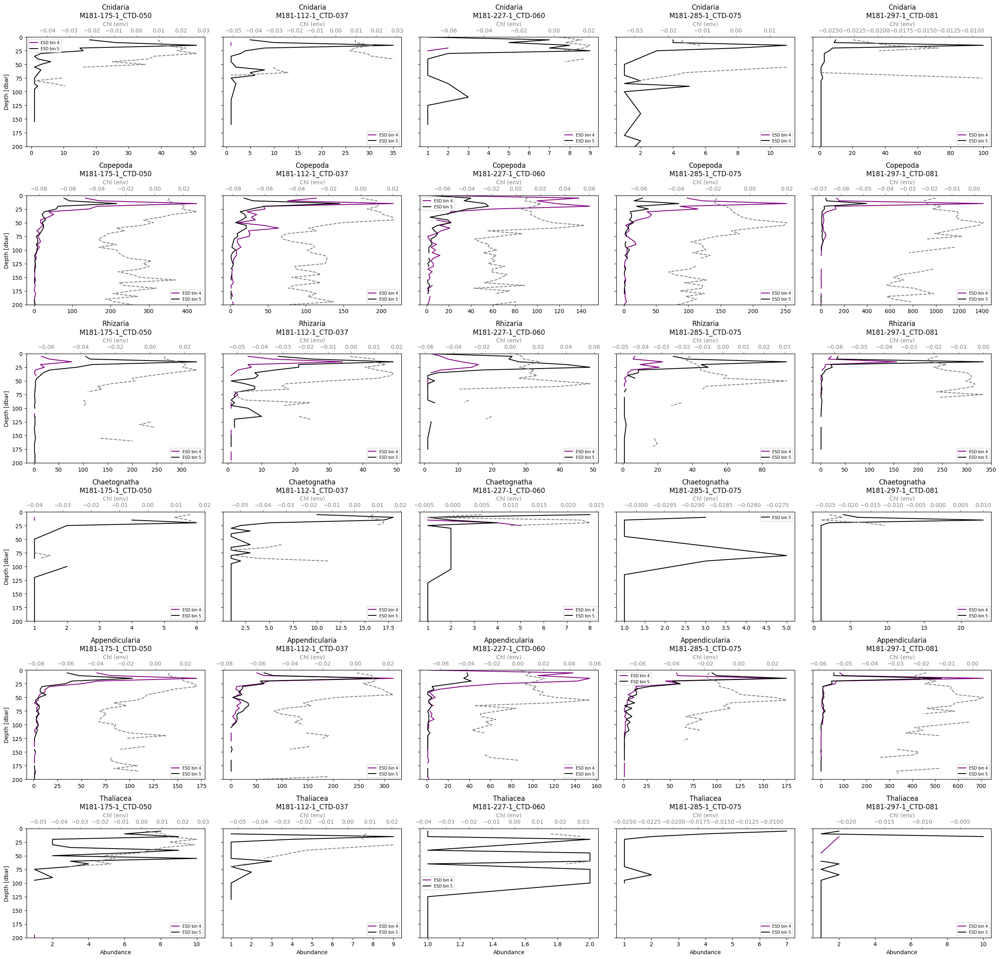

In [440]:
profiles = list(df['sample_id'].unique())
n_profiles = len(profiles)
n_groups = len(main_groups)

# Define your ESD bins and depth bin size
esd_bins = np.array([0, 125, 250, 500, 1000, 100000])
depth_bin_size = 5  # or whatever interval you prefer

#x_var = 'object_interpolated_o'       # Oxygen
x_var = 'object_interpolated_chl'    # Chlorophyll
# x_var = 'object_interpolated_s'      # Salinity
# x_var = 'object_interpolated_t'      # Temperature

fig, axes = plt.subplots(n_groups, n_profiles, figsize=(5*n_profiles, 4*n_groups), sharey=True)

for i, group in enumerate(main_groups):
    for j, profile_name in enumerate(profiles):
        profile_df = df[df['sample_id'] == profile_name]
        group_df = profile_df[profile_df["object_annotation_hierarchy"].str.contains(group, na=False)].copy()
        if not group_df.empty:
            # Abundance calculation
            _, pivoted_abundance = count_particles_by_pressure_and_size(
                group_df,
                all_images_df,
                pressure_bin_size=depth_bin_size,
                esd_bins=esd_bins,
            )

            # Calculate mean environmental variable per depth bin
            group_df['depth_bin'] = pd.cut(
                group_df['object_pressure'], 
                bins=np.arange(group_df['object_pressure'].min(), 
                               group_df['object_pressure'].max() + depth_bin_size, 
                               depth_bin_size), 
                labels=False
            )
            env_per_bin = group_df.groupby('depth_bin')[x_var].mean().reindex(pivoted_abundance['pressure_bin'], fill_value=np.nan)

            ax = axes[i, j] if n_groups > 1 and n_profiles > 1 else axes[max(i, j)]

            # Plot abundance vs depth (left x-axis)
            for k, color in zip([1, 2, 3, 4, 5], ['red', 'blue', 'lime', "purple", 'black']):
                if k in pivoted_abundance.columns:
                    ax.plot(
                        pivoted_abundance[k],
                        pivoted_abundance['pressure_bin'] * depth_bin_size,
                        color=color,
                        label=f'ESD bin {k}'
                    )

            # Plot environmental variable vs depth (right x-axis)
            ax2 = ax.twiny()
            ax2.plot(
                env_per_bin.values,
                env_per_bin.index * depth_bin_size,
                color='gray',
                linestyle='--',
                label=x_var
            )
            ax2.set_xlabel(f"{x_var.replace('object_interpolated_', '').capitalize()} (env)", color='gray')
            ax2.tick_params(axis='x', colors='gray')

            # Format axes
            ax.invert_yaxis()
            ax.set_title(f"{group}\n{profile_name[:18]}")
            ax.set_ylim(top=0, bottom=200)
            if j == 0:
                ax.set_ylabel('Depth [dbar]')
            if i == n_groups - 1:
                ax.set_xlabel('Abundance')
            ax.legend(fontsize='x-small')

plt.tight_layout()
plt.show()

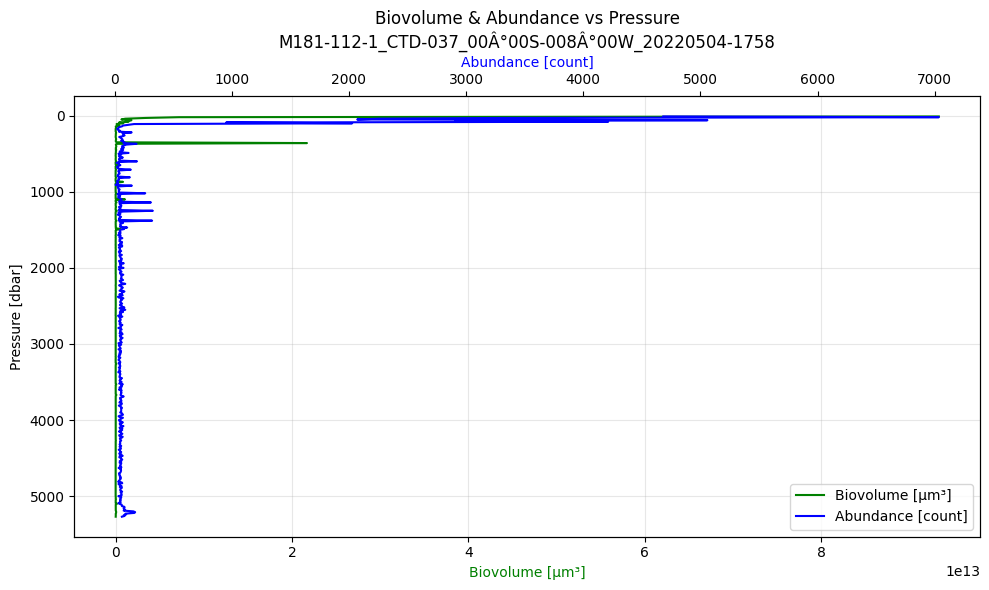

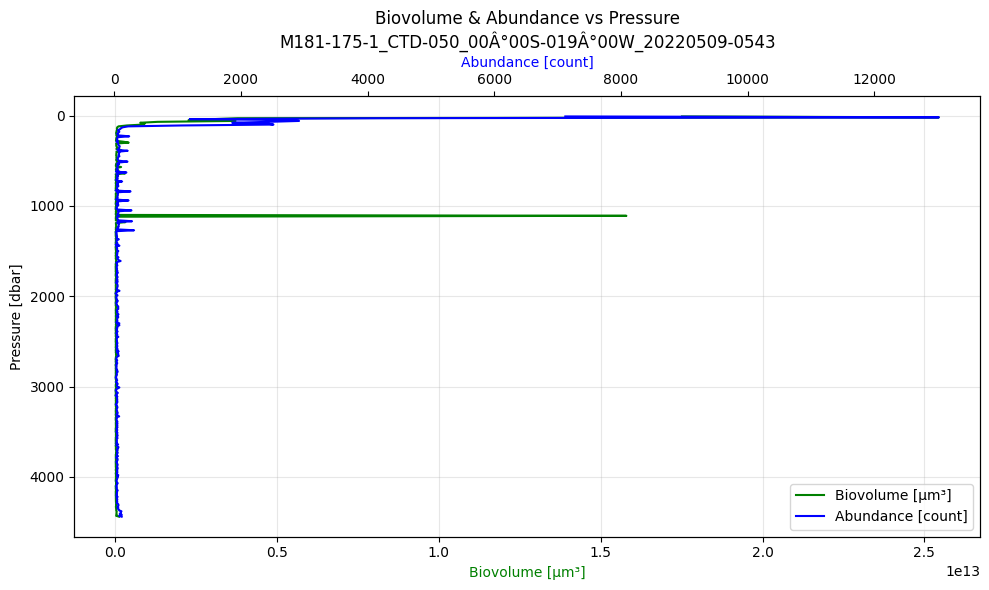

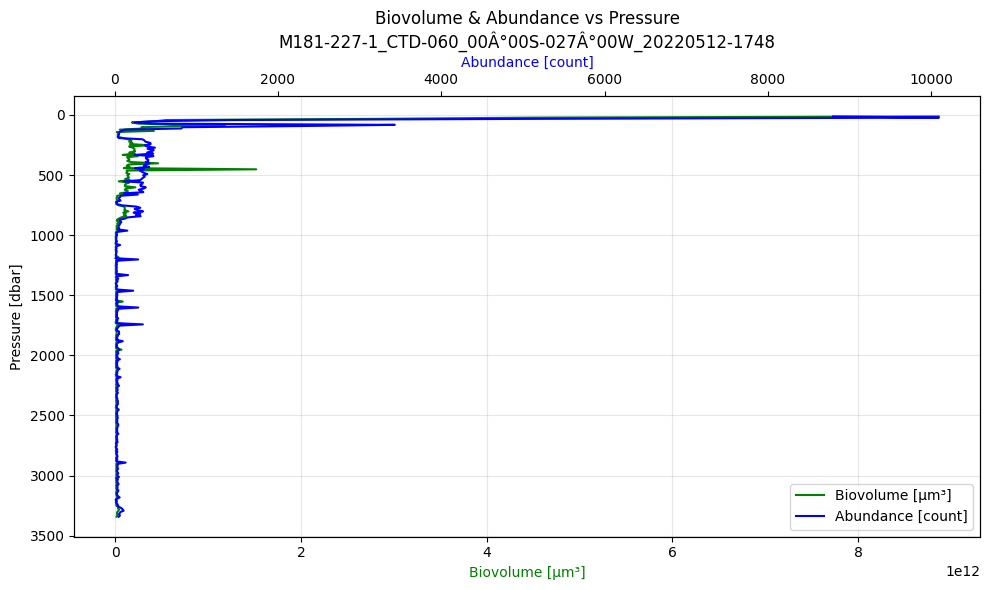

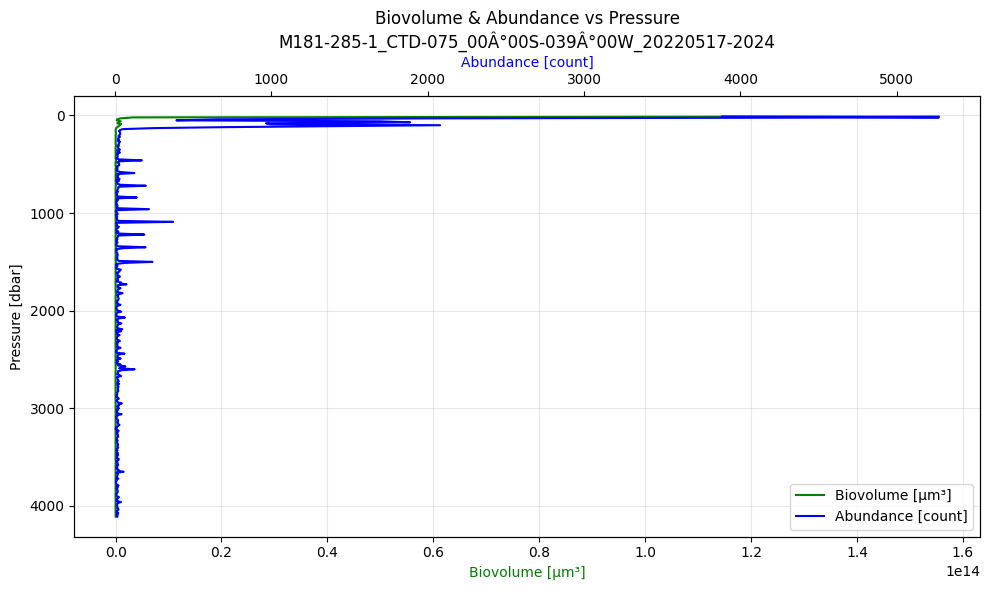

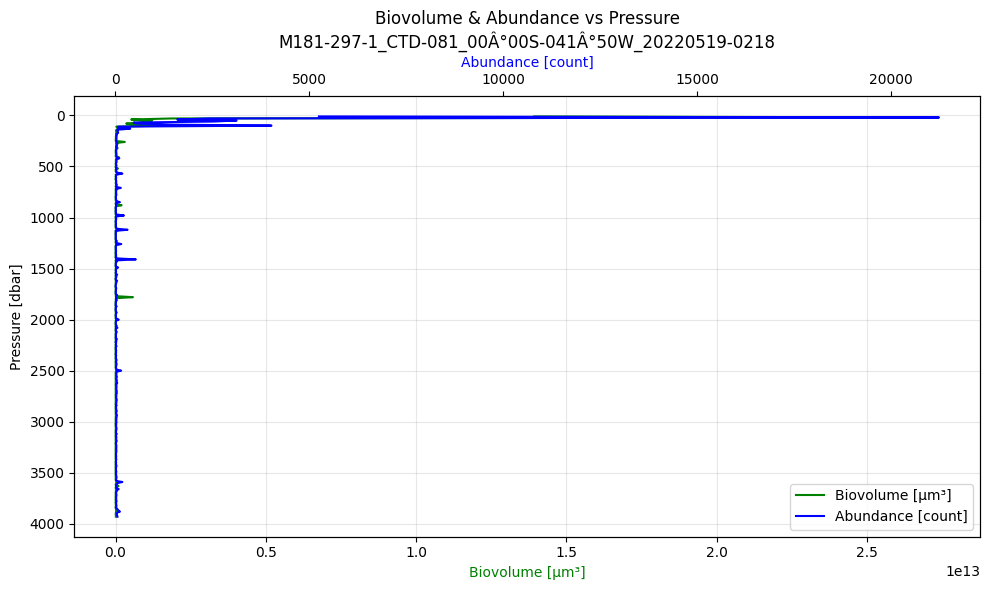

In [18]:
def plot_biovolume_and_abundance_vs_pressure(df_five_profiles, plot_path):
    """
    Plot total biovolume (y1) and abundance (y2) vs pressure (y) for each profile (no size classes).
    Pressure is on the y-axis, with 0 at the top and max at the bottom.
    """
    profiles = sorted(df_five_profiles['sample_id'].unique())
    for profile in profiles:
        profile_df = df_five_profiles[df_five_profiles['sample_id'] == profile].copy()
        pressure = profile_df['object_pressure']
        bins = np.arange(pressure.min(), pressure.max() + 10, 10)
        profile_df['pressure_bin'] = np.digitize(pressure, bins)
        grouped = profile_df.groupby('pressure_bin')
        pressure_centers = [bins[i-1] for i in grouped.groups.keys()]
        abundance = grouped.size().values
        if 'volume_um3' not in profile_df.columns:
            profile_df['volume_um3'] = (4/3) * np.pi * (profile_df['object_esd']/2)**3
        biovolume = grouped['volume_um3'].sum().values

        fig, ax1 = plt.subplots(figsize=(10, 6))
        ax2 = ax1.twiny()
        # Plot with pressure on y-axis
        l1, = ax1.plot(biovolume, pressure_centers, 'g-', label='Biovolume [μm³]')
        l2, = ax2.plot(abundance, pressure_centers, 'b-', label='Abundance [count]')
        ax1.set_ylabel('Pressure [dbar]')
        ax1.set_xlabel('Biovolume [μm³]', color='g')
        ax2.set_xlabel('Abundance [count]', color='b')
        ax1.invert_yaxis()  # 0 at top, max at bottom
        ax1.set_title(f'Biovolume & Abundance vs Pressure\n{profile}')
        fig.tight_layout()
        ax1.grid(True, alpha=0.3)
        # Only show one legend, with both handles, in the lower right
        lines = [l1, l2]
        labels = [l.get_label() for l in lines]
        ax1.legend(lines, labels, loc='lower right')
        safe_profile = profile.replace('/', '_').replace('°', 'deg').replace('-', '_')
        plt.savefig(os.path.join(plot_path, f'biovolume_abundance_vs_pressure_{safe_profile}.png'), dpi=300)
        plt.show()
        plt.close(fig)

# Call the function as before
plot_biovolume_and_abundance_vs_pressure(df_five_profiles, plot_path)

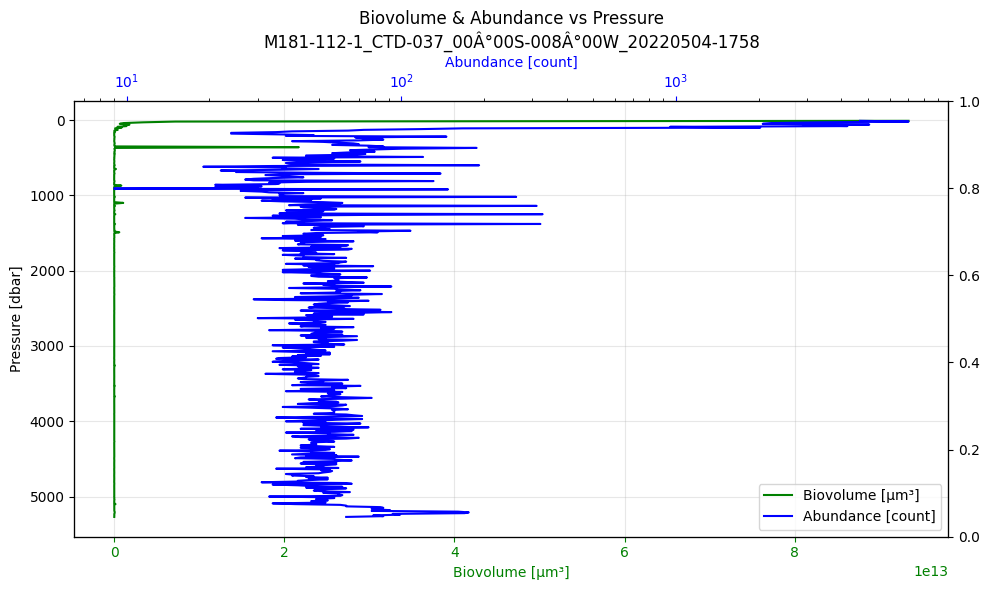

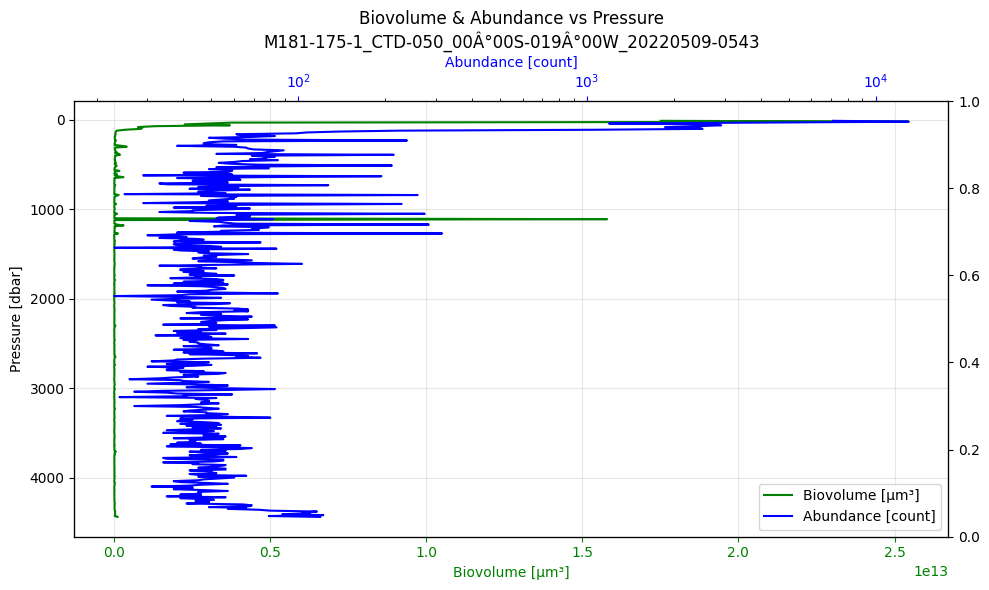

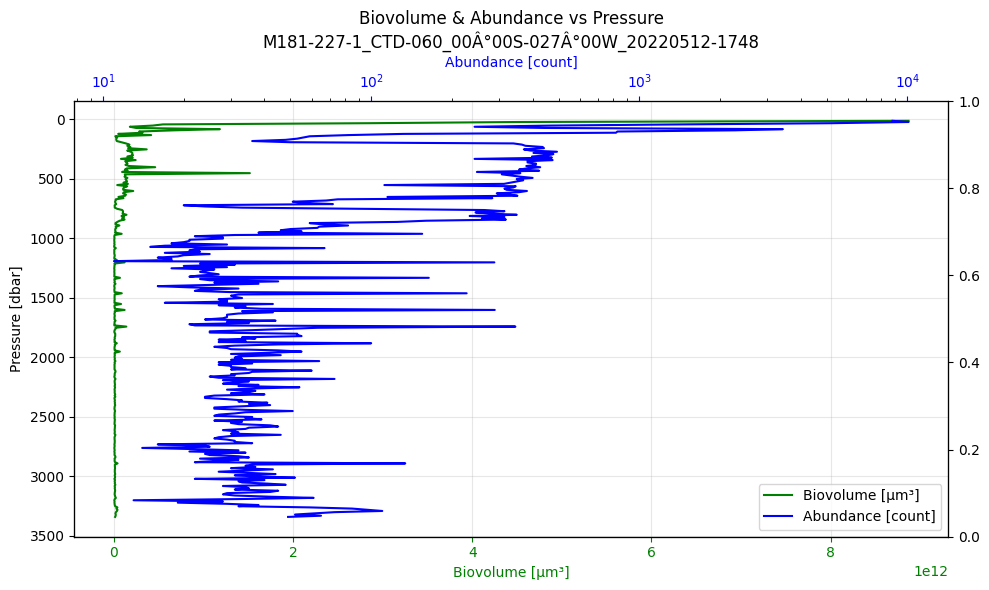

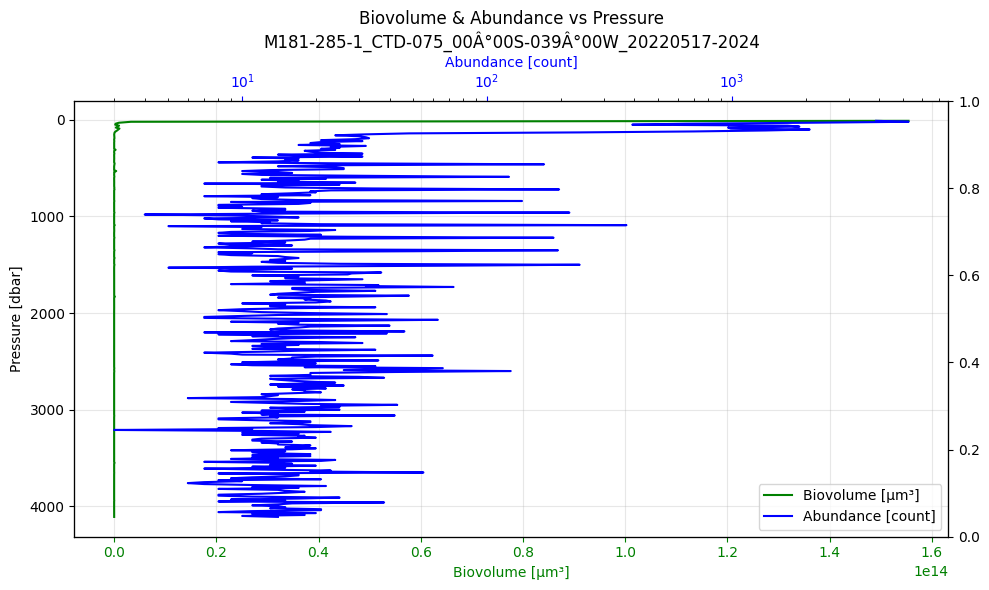

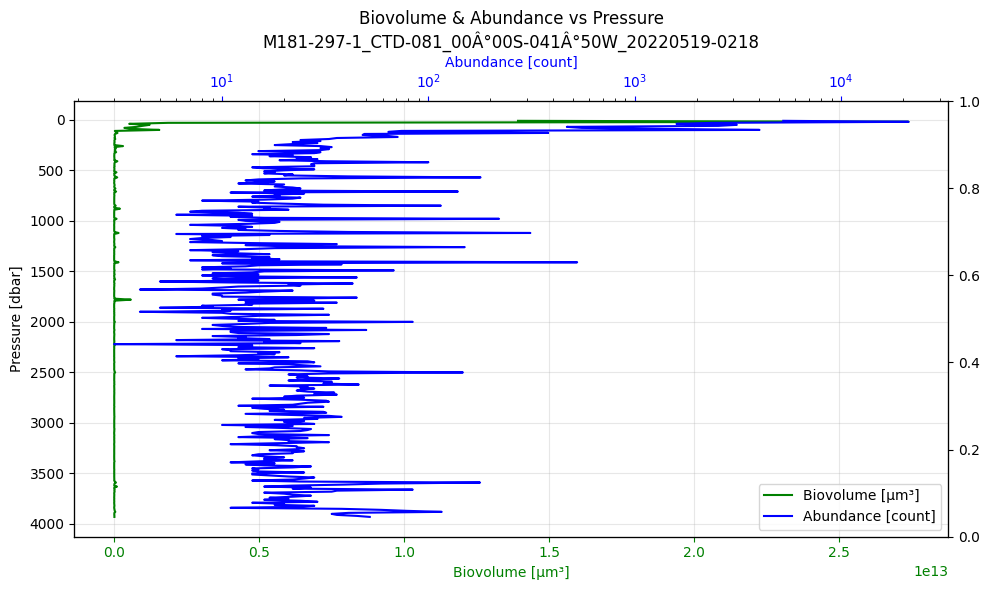

In [19]:
def plot_biovolume_and_abundance_vs_pressure(df_five_profiles, plot_path):
    """
    Plot total biovolume (y1) and abundance (y2) vs pressure (y) for each profile (no size classes).
    Pressure is on the y-axis, with 0 at the top and max at the bottom.
    """
    profiles = sorted(df_five_profiles['sample_id'].unique())
    for profile in profiles:
        profile_df = df_five_profiles[df_five_profiles['sample_id'] == profile].copy()
        pressure = profile_df['object_pressure']
        bins = np.arange(pressure.min(), pressure.max() + 10, 10)
        profile_df['pressure_bin'] = np.digitize(pressure, bins)
        grouped = profile_df.groupby('pressure_bin')
        pressure_centers = [bins[i-1] for i in grouped.groups.keys()]
        abundance = grouped.size().values
        if 'volume_um3' not in profile_df.columns:
            profile_df['volume_um3'] = (4/3) * np.pi * (profile_df['object_esd']/2)**3
        biovolume = grouped['volume_um3'].sum().values

        fig, ax1 = plt.subplots(figsize=(10, 6))
        ax2 = ax1.twiny()
        ax3 = ax1.twinx()  # Secondary y-axis for abundance

        # Plot biovolume (left x-axis, green)
        l1, = ax1.plot(biovolume, pressure_centers, 'g-', label='Biovolume [μm³]')
        ax1.set_xlabel('Biovolume [μm³]', color='g')
        ax1.tick_params(axis='x', colors='g')

        # Plot abundance (top x-axis, blue, log scale)
        l2, = ax2.plot(abundance, pressure_centers, 'b-', label='Abundance [count]')
        ax2.set_xlabel('Abundance [count]', color='b')
        ax2.tick_params(axis='x', colors='b')
        ax2.set_xscale('log')

        # Optionally, plot abundance on secondary y-axis (right)
        # ax3.plot(abundance, pressure_centers, 'b--', alpha=0.5)
        # ax3.set_ylabel('Pressure [dbar] (for abundance)', color='b')
        # ax3.invert_yaxis()

        ax1.set_ylabel('Pressure [dbar]')
        ax1.invert_yaxis()  # 0 at top, max at bottom
        ax1.set_title(f'Biovolume & Abundance vs Pressure\n{profile}')
        fig.tight_layout()
        ax1.grid(True, alpha=0.3)

        # Only show one legend, with both handles, in the lower right
        lines = [l1, l2]
        labels = [l.get_label() for l in lines]
        ax1.legend(lines, labels, loc='lower right')

        safe_profile = profile.replace('/', '_').replace('°', 'deg').replace('-', '_')
        plt.savefig(os.path.join(plot_path, f'biovolume_abundance_vs_pressure_{safe_profile}.png'), dpi=300)
        plt.show()
        plt.close(fig)

# Call the function as before
plot_biovolume_and_abundance_vs_pressure(df_five_profiles, plot_path)

In [ ]:
def plot_biovolume_vs_esd_by_depth_loglog(df, all_images_df, taxonomic_group, plot_path, pressure_ranges=None):
    """
    Plot normalized biovolume vs ESD using log-log axes for a given taxonomic group.
    """
    group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
    if group_df.empty:
        print(f"No data found for {taxonomic_group}")
        return

    if 'volume_um3' not in group_df.columns:
        group_df = group_df.copy()
        group_df['volume_um3'] = (4/3) * np.pi * (group_df['object_esd']/2)**3

    if pressure_ranges is None:
        pressure_ranges = [(0, 200), (200, 1000), (1000, group_df['object_pressure'].max())]

    esd_min = group_df['object_esd'].min()
    esd_max = group_df['object_esd'].max()
    esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=20)

    results = []
    for pressure_min, pressure_max in pressure_ranges:
        depth_data = group_df[
            (group_df['object_pressure'] >= pressure_min) &
            (group_df['object_pressure'] < pressure_max)
        ]
        if len(depth_data) == 0:
            continue
        depth_images = all_images_df[
            (all_images_df['pressure'] >= pressure_min) &
            (all_images_df['pressure'] < pressure_max)
        ]
        sampling_volume_L = len(depth_images) * VOLUME_PER_IMAGE_LITERS
        if sampling_volume_L == 0:
            continue
        esd_bin_indices = np.digitize(depth_data['object_esd'], esd_bins_log)
        bin_centers = []
        biovolumes_normalized = []
        for bin_idx in range(1, len(esd_bins_log)):
            particles_in_bin = depth_data[esd_bin_indices == bin_idx]
            if len(particles_in_bin) > 0:
                bin_center_um = np.sqrt(esd_bins_log[bin_idx-1] * esd_bins_log[bin_idx])
                bin_center_mm = bin_center_um / 1000
                total_biovolume = particles_in_bin['volume_um3'].sum()
                bin_centers.append(bin_center_mm)
                biovolumes_normalized.append(total_biovolume / sampling_volume_L)
        results.append({
            'pressure_range': (pressure_min, pressure_max),
            'pressure_label': f'{pressure_min}-{pressure_max} dbar',
            'bin_centers_mm': bin_centers,
            'biovolumes_normalized': biovolumes_normalized,
            'sampling_volume_L': sampling_volume_L
        })

    fig, ax = plt.subplots(figsize=(12, 8))
    colors = ['blue', 'red', 'green', 'orange', 'purple']
    for i, result in enumerate(results):
        if len(result['bin_centers_mm']) > 0:
            non_zero_mask = np.array(result['biovolumes_normalized']) > 0
            if np.any(non_zero_mask):
                bin_centers_filtered = np.array(result['bin_centers_mm'])[non_zero_mask]
                biovolumes_filtered = np.array(result['biovolumes_normalized'])[non_zero_mask]
                ax.loglog(bin_centers_filtered, biovolumes_filtered,
                          'o-', color=colors[i % len(colors)],
                          label=result['pressure_label'],
                          linewidth=2, markersize=6, alpha=0.8)
    ax.set_xlabel('ESD [mm]')
    ax.set_ylabel('Normalized Biovolume [μm³ L⁻¹]')
    ax.set_title(f'{taxonomic_group}: Normalized Biovolume vs ESD by Depth (log-log)')
    ax.legend(fontsize='small')
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, f'normalized_biovolume_vs_esd_{taxonomic_group}_by_depth_loglog.png'),
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()



    plot_biovolume_vs_esd_by_depth_loglog(
    df, all_images_df,
    taxonomic_g,
    plot_path=plot_path,
    pressure_ranges=[(0, 200), (200, 1000), (1000, 2000)]
)

In [441]:
# base_folder = '/home/fanny/M181_output'

# all_files = []

# # Iterate through profile folders
# for profile in os.listdir(base_folder):
#     profile_path = os.path.join(base_folder, profile)
#     if os.path.isdir(profile_path):
#         data_folder = os.path.join(profile_path, "Data")
#         if os.path.isdir(data_folder):
#             for filename in os.listdir(data_folder):
#                 file_path = os.path.join(data_folder, filename)
#                 if os.path.isfile(file_path):
#                     all_files.append({
#                         "profile_name": profile,
#                         "filename": filename,
#                         "full_path": file_path
#                     })

# # Convert to DataFrame
# df = pd.DataFrame(all_files)

# split_df = df['filename'].apply(lambda f: os.path.splitext(f)[0]).str.split('_', expand=True)

# # Assign headers
# split_df.columns = ["date-time", "pressure", "temperature"]

# # Clean and convert numeric values
# split_df['pressure'] = split_df['pressure'].str.replace('bar', '', regex=False).astype(float)
# split_df['pressure'] = split_df['pressure']*10
# split_df['temperature'] = split_df['temperature'].str.replace('C', '', regex=False).astype(float)

# # Merge split columns back into df
# all_images_df = pd.concat([df, split_df], axis=1)

# print(df.head())


In [442]:
df_profx = all_images_df[all_images_df['profile_name'] == 'M181-276-1_CTD-072_00°00S-037°00W_20220516-2214']
print(len(df_profx))

19499


In [443]:
df_profx

,profile_name,filename,full_path,date-time,pressure,temperature,sample_id
0,M181-276-1_CTD-072_00°00S-037°00W_20220516-2214,20220516-23151765_211.027bar_03.57C.csv,/home/fanny/M181_output/M181-276-1_CTD-072_00°...,20220516-23151765,2110.27,3.57,M181-276-1_CTD-072
1,M181-276-1_CTD-072_00°00S-037°00W_20220516-2214,20220516-23321298_315.961bar_02.55C.csv,/home/fanny/M181_output/M181-276-1_CTD-072_00°...,20220516-23321298,3159.61,2.55,M181-276-1_CTD-072
2,M181-276-1_CTD-072_00°00S-037°00W_20220516-2214,20220516-22382425_001.994bar_28.60C.csv,/home/fanny/M181_output/M181-276-1_CTD-072_00°...,20220516-22382425,19.94,28.60,M181-276-1_CTD-072
3,M181-276-1_CTD-072_00°00S-037°00W_20220516-2214,20220516-22414201_007.762bar_27.47C.csv,/home/fanny/M181_output/M181-276-1_CTD-072_00°...,20220516-22414201,77.62,27.47,M181-276-1_CTD-072
4,M181-276-1_CTD-072_00°00S-037°00W_20220516-2214,20220516-23562208_452.328bar_00.95C.csv,/home/fanny/M181_output/M181-276-1_CTD-072_00°...,20220516-23562208,4523.28,0.95,M181-276-1_CTD-072
...,...,...,...,...,...,...,...
19494,M181-276-1_CTD-072_00°00S-037°00W_20220516-2214,20220516-23555133_455.363bar_00.96C.csv,/home/fanny/M181_output/M181-276-1_CTD-072_00°...,20220516-23555133,4553.63,0.96,M181-276-1_CTD-072
19495,M181-276-1_CTD-072_00°00S-037°00W_20220516-2214,20220516-22495505_054.728bar_07.75C.csv,/home/fanny/M181_output/M181-276-1_CTD-072_00°...,20220516-22495505,547.28,7.75,M181-276-1_CTD-072
19496,M181-276-1_CTD-072_00°00S-037°00W_20220516-2214,20220516-22551057_087.090bar_05.39C.csv,/home/fanny/M181_output/M181-276-1_CTD-072_00°...,20220516-22551057,870.90,5.39,M181-276-1_CTD-072
19497,M181-276-1_CTD-072_00°00S-037°00W_20220516-2214,20220516-23033286_138.636bar_04.70C.csv,/home/fanny/M181_output/M181-276-1_CTD-072_00°...,20220516-23033286,1386.36,4.70,M181-276-1_CTD-072


In [444]:
# def count_images_per_depth_bin(df, bin_size=5):
    
#     df = df.copy()
    
#     # Define pressure bins based on min and max pressure values
#     min_pressure = df['pressure'].min()
#     max_pressure = df['pressure'].max()
#     pressure_bins = np.arange(min_pressure, max_pressure + bin_size, bin_size)
    
#     # Assign pressure bins (indices start at 1)
#     df['pressure_bin'] = np.digitize(df['pressure'], pressure_bins)
    
#     # Count images per pressure bin
#     counts = df.groupby('pressure_bin').size().reset_index(name='image_count')

    
#     # Add bin range info for clarity
#     counts['pressure_bin_start'] = pressure_bins[counts['pressure_bin'] - 1]
#     counts['pressure_bin_end'] = pressure_bins[counts['pressure_bin']]
    
#     return counts


# #counts_df = count_images_per_depth_bin(df_profx, bin_size=5)
# #print(counts_df)



# def calculate_sample_volume(df, bin_size=5):
    
#     # Count images per pressure bin
#     counts = count_images_per_depth_bin(df, bin_size)
    
#     # Calculate sample volume in liters
#     counts['sample_volume_liters'] = counts['image_count'] * VOLUME_PER_IMAGE_LITERS
    
#     return counts

# sample_volume_df = calculate_sample_volume(df_profx, bin_size=5)
# print(sample_volume_df)
# print('Ich habe mein Job gemacht! BeepBoop Ich bin ein Roboter und ich liebe es, Daten zu analysieren!') 



# def normalize_images(all_images_df, bin_size=5):
#     """
#     Count images per pressure bin and normalize by sampling volume.
    
#     Parameters:
#     - df: DataFrame with at least ['pressure'] and a unique image ID column.
#     - bin_size: Size of pressure bins.
#     - volume_per_image: Volume sampled per image (in liters).
    
#     Returns:
#     - counts: DataFrame with pressure bins, raw image counts, and normalized counts (images/L).
#     """
#     # yall should listen to epic the musical, its peak
#     # jk lmao lol 

#     # Define bins based on pressure range
#     min_pressure = all_images_df['pressure'].min()
#     max_pressure = all_images_df['pressure'].max()
#     pressure_bins = np.arange(min_pressure, max_pressure + bin_size, bin_size)

#     # Assign each pressure value to a bin
#     all_images_df = all_images_df.copy()
#     all_images_df['pressure_bin'] = np.digitize(all_images_df['pressure'], pressure_bins)
    
#     # Calculate the number of images per bin (raw count)
#     image_counts = all_images_df.groupby('pressure_bin').size().reset_index(name='image_count')
    
#     # Calculate the sample volume per bin (images * volume_per_image)
#     image_counts['sample_volume_L'] = image_counts['image_count'] * VOLUME_PER_IMAGE_LITERS
    
#     # Normalize counts (images per liter)
#     image_counts['images_per_L'] = crop_counts['image_count'] / image_counts['sample_volume_L']
    
#     # Add bin range info
#     image_counts['bin_start'] = pressure_bins[image_counts['pressure_bin'] - 1]
#     image_counts['bin_end'] = pressure_bins[image_counts['pressure_bin']]
    
#     return image_counts

# normalized_df = normalize_images(df_profx, bin_size=5)

Found 24345 matching images for profiles: ['M181-112-1_CTD-037']
Found 24345 matching images for profiles: ['M181-112-1_CTD-037']
Found 24345 matching images for profiles: ['M181-112-1_CTD-037']


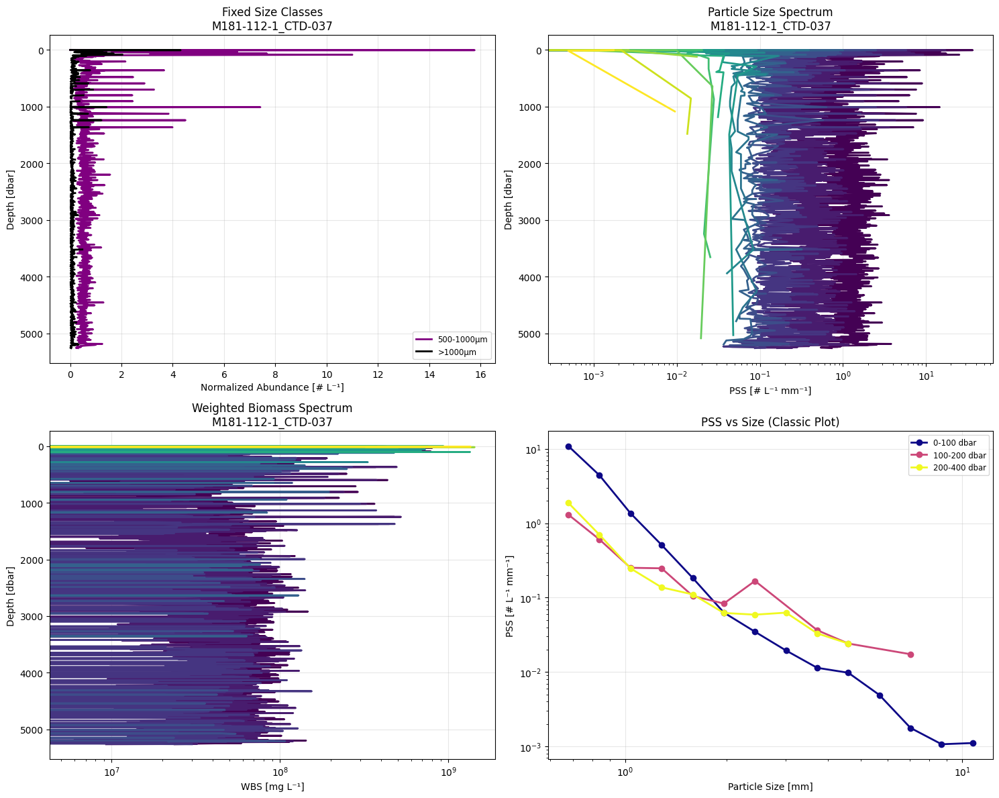

In [445]:
calculate_particle_size_spectrum(M1811121CTD037_df, all_images_df)

# Calculate PSS and create comprehensive comparison plot
hist_fixed, pivot_fixed, pss_wbs_df = plot_pss_wbs_comparison(
    M1811121CTD037_df, 
    all_images_df, 
    plot_path, 
    station_id="M181-112-1_CTD-037", 
    depth_bin_size=5
)

In [446]:
pressure_ranges = [(0, 200), (200, 1000), (1000, 2000)]

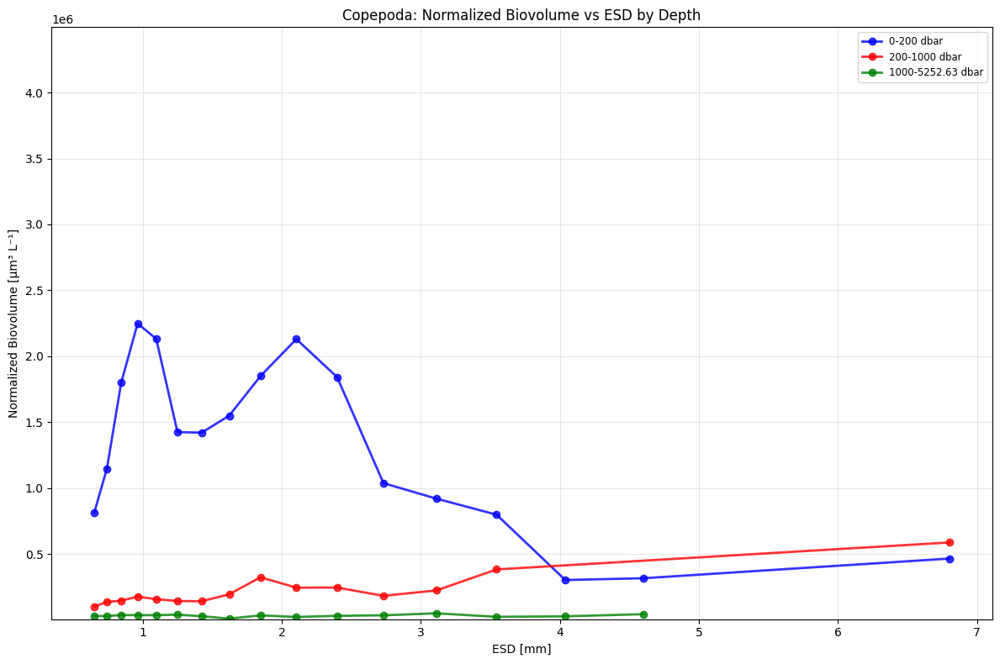

In [447]:
def plot_biovolume_vs_esd_by_depth(df, all_images_df, taxonomic_group, plot_path, pressure_ranges=None):
    """
    Plot normalized biovolume vs ESD.
    """
    # Filter data for taxonomic group
    group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
    
    if group_df.empty:
        print(f"No data found for {taxonomic_group}")
        return
    
    # Calculate biovolume if not present
    if 'volume_um3' not in group_df.columns:
        group_df = group_df.copy()
        group_df['volume_um3'] = (4/3) * np.pi * (group_df['object_esd']/2)**3
    
    # Default pressure ranges
    if pressure_ranges is None:
        pressure_ranges = [(0, 200), (200, 1000), (1000, group_df['object_pressure'].max())]
    
    # Use logarithmic ESD bins
    esd_min = group_df['object_esd'].min()
    esd_max = group_df['object_esd'].max()
    esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=20)
    
    results = []
    
    for pressure_min, pressure_max in pressure_ranges:
        # Filter data for this pressure range
        depth_data = group_df[
            (group_df['object_pressure'] >= pressure_min) & 
            (group_df['object_pressure'] < pressure_max)
        ]
        
        if len(depth_data) == 0:
            continue
            
        # Calculate sampling volume for this depth range
        depth_images = all_images_df[
            (all_images_df['pressure'] >= pressure_min) & 
            (all_images_df['pressure'] < pressure_max)
        ]
        sampling_volume_L = len(depth_images) * VOLUME_PER_IMAGE_LITERS
        
        if sampling_volume_L == 0:
            continue
        
        # Bin particles by ESD
        esd_bin_indices = np.digitize(depth_data['object_esd'], esd_bins_log)
        
        # Calculate biovolume per ESD bin
        bin_centers = []
        biovolumes_normalized = []
        
        for bin_idx in range(1, len(esd_bins_log)):
            # Get particles in this bin
            particles_in_bin = depth_data[esd_bin_indices == bin_idx]
            
            if len(particles_in_bin) > 0:
                # Calculate geometric mean for bin center
                bin_center_um = np.sqrt(esd_bins_log[bin_idx-1] * esd_bins_log[bin_idx])
                bin_center_mm = bin_center_um / 1000
                
                # Sum total biovolume in this bin
                total_biovolume = particles_in_bin['volume_um3'].sum()
                
                bin_centers.append(bin_center_mm)
                biovolumes_normalized.append(total_biovolume / sampling_volume_L)
        
        results.append({
            'pressure_range': (pressure_min, pressure_max),
            'pressure_label': f'{pressure_min}-{pressure_max} dbar',
            'bin_centers_mm': bin_centers,
            'biovolumes_normalized': biovolumes_normalized,
            'sampling_volume_L': sampling_volume_L
        })
    
    # Plot results
    fig, ax = plt.subplots(figsize=(12, 8))
    colors = ['blue', 'red', 'green', 'orange', 'purple']
    
    all_biovolumes = []  # Collect all biovolume values for scaling
    
    for i, result in enumerate(results):
        if len(result['bin_centers_mm']) > 0:
            # Filter out zero values for plotting
            non_zero_mask = np.array(result['biovolumes_normalized']) > 0
            if np.any(non_zero_mask):
                bin_centers_filtered = np.array(result['bin_centers_mm'])[non_zero_mask]
                biovolumes_filtered = np.array(result['biovolumes_normalized'])[non_zero_mask]
                
                #ax.semilogx(bin_centers_filtered, biovolumes_filtered,
                ax.plot(bin_centers_filtered, biovolumes_filtered,
                           'o-', color=colors[i % len(colors)], 
                           label=result['pressure_label'],
                           linewidth=2, markersize=6, alpha=0.8)
                
                all_biovolumes.extend(biovolumes_filtered)
    
    # Set y-axis limits based on actual data range
    if all_biovolumes:
        min_biovol = min(all_biovolumes)
        max_biovol = max(all_biovolumes)
        ax.set_ylim(min_biovol * 0.5, max_biovol * 2)
    
    ax.set_xlabel('ESD [mm]')
    ax.set_ylabel('Normalized Biovolume [μm³ L⁻¹]')
    ax.set_title(f'{taxonomic_group}: Normalized Biovolume vs ESD by Depth')
    ax.legend(fontsize='small')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, f'normalized_biovolume_vs_esd_{taxonomic_group}_by_depth.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

plot_biovolume_vs_esd_by_depth(
    df,
    all_images_df,
    taxonomic_group='Copepoda',
    plot_path=plot_path
)

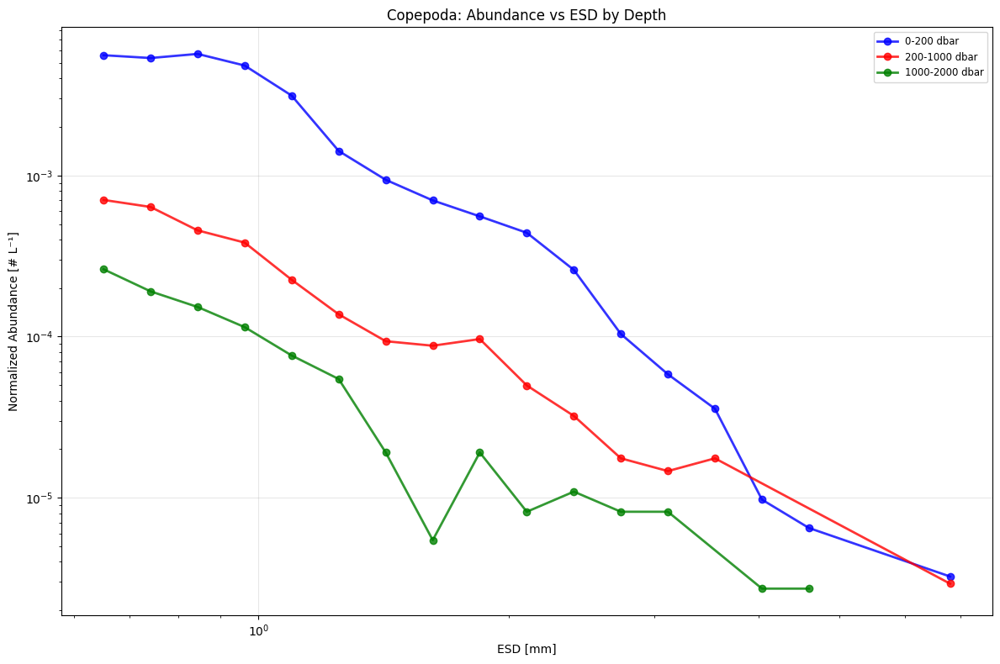

In [448]:
def plot_abundance_vs_esd_by_depth(df, all_images_df, taxonomic_group, plot_path, pressure_ranges=None):
    """
    Clean implementation using the dedicated size spectrum binning function.
    """
    # Filter data for taxonomic group
    group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
    
    if group_df.empty:
        print(f"No data found for {taxonomic_group}")
        return
    
    # Default pressure ranges
    if pressure_ranges is None:
        pressure_ranges = [(0, 200), (200, 1000), (1000, group_df['object_pressure'].max())]
    
    # Use the dedicated binning function
    binned_results = bin_particles_for_size_spectrum(group_df, all_images_df, pressure_ranges)
    
    # Plot results
    fig, ax = plt.subplots(figsize=(12, 8))
    colors = ['blue', 'red', 'green', 'orange', 'purple']
    
    for i, result in enumerate(binned_results):
        ax.loglog(result['bin_centers_mm'], result['abundances_normalized'], 
                 'o-', color=colors[i % len(colors)], 
                 label=result['pressure_label'],
                 linewidth=2, markersize=6, alpha=0.8)
    
    
    ax.set_xlabel('ESD [mm]')
    ax.set_ylabel('Normalized Abundance [# L⁻¹]')
    ax.set_title(f'{taxonomic_group}: Abundance vs ESD by Depth')
    ax.legend(fontsize='small')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, f'abundance_vs_esd_{taxonomic_group}_by_depth_clean.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


plot_abundance_vs_esd_by_depth(
    df, 
    all_images_df, 
    taxonomic_group='Copepoda', 
    plot_path=plot_path, 
    pressure_ranges=pressure_ranges)

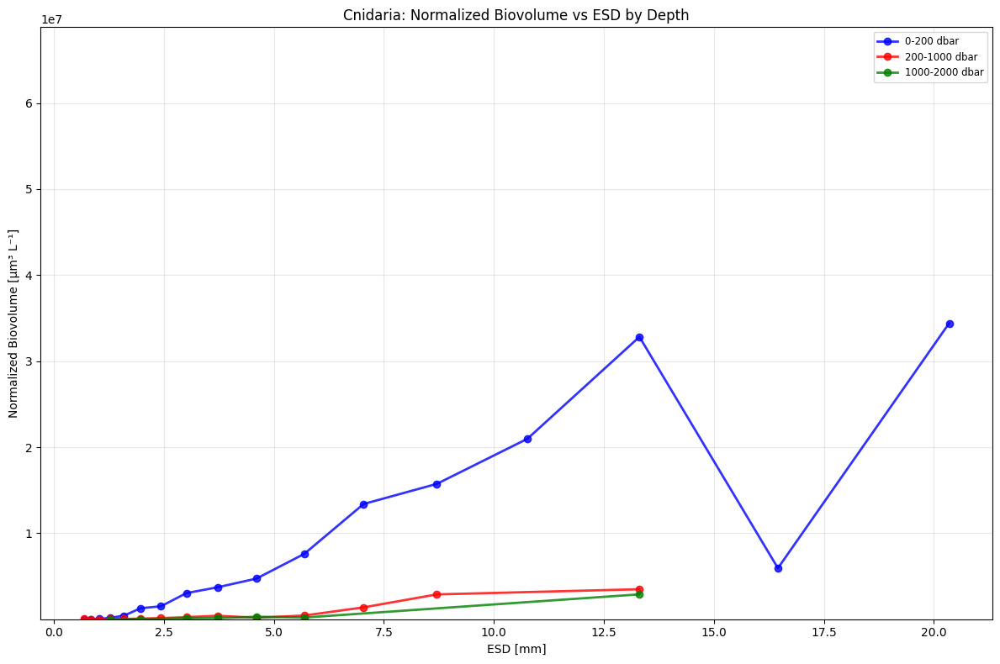

Created biovolume plot for Cnidaria


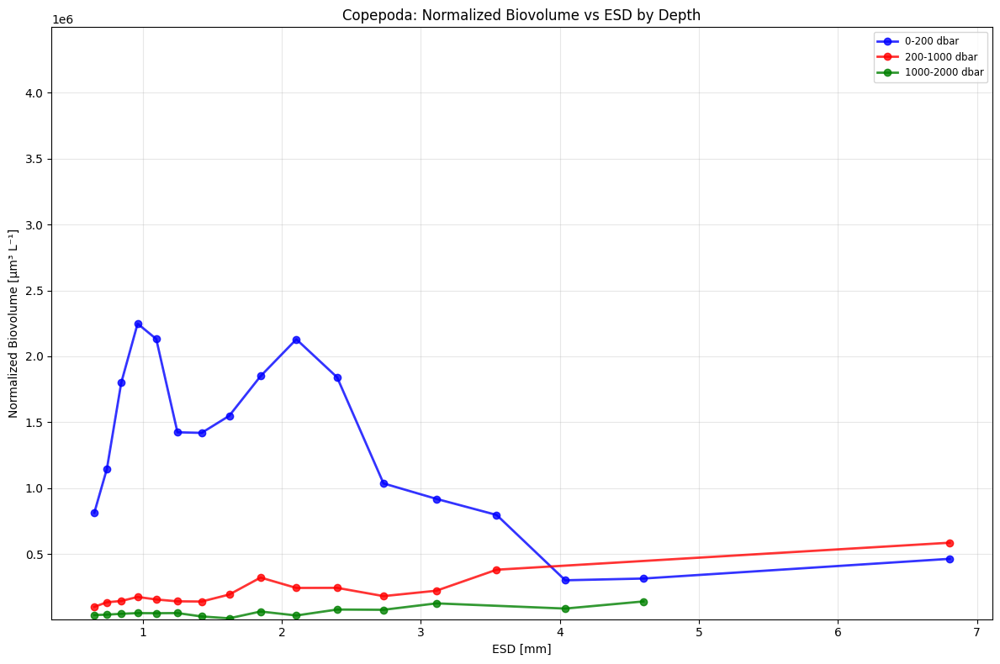

Created biovolume plot for Copepoda


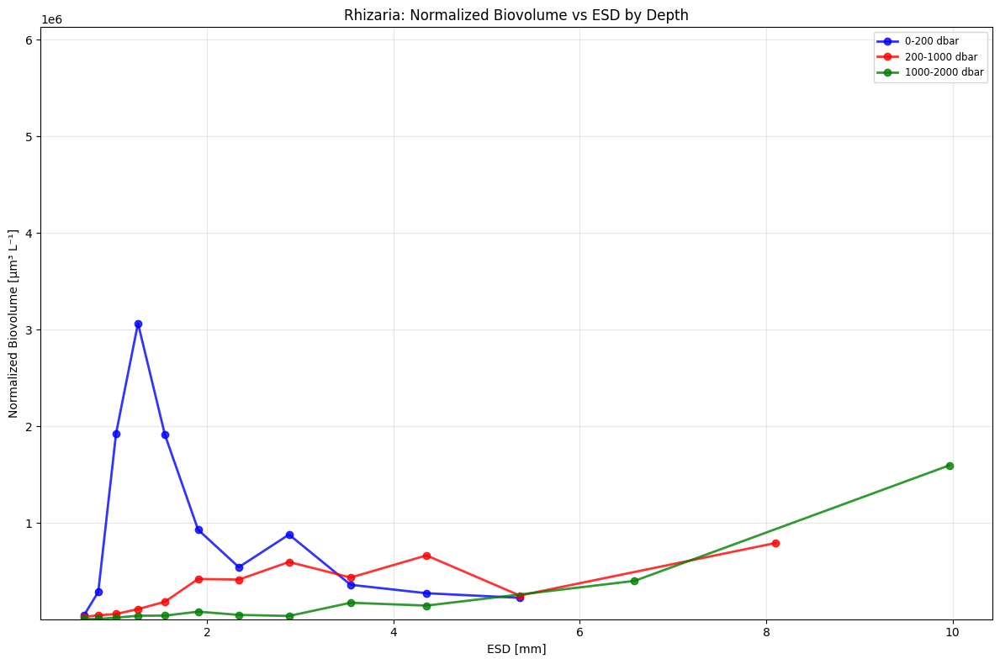

Created biovolume plot for Rhizaria


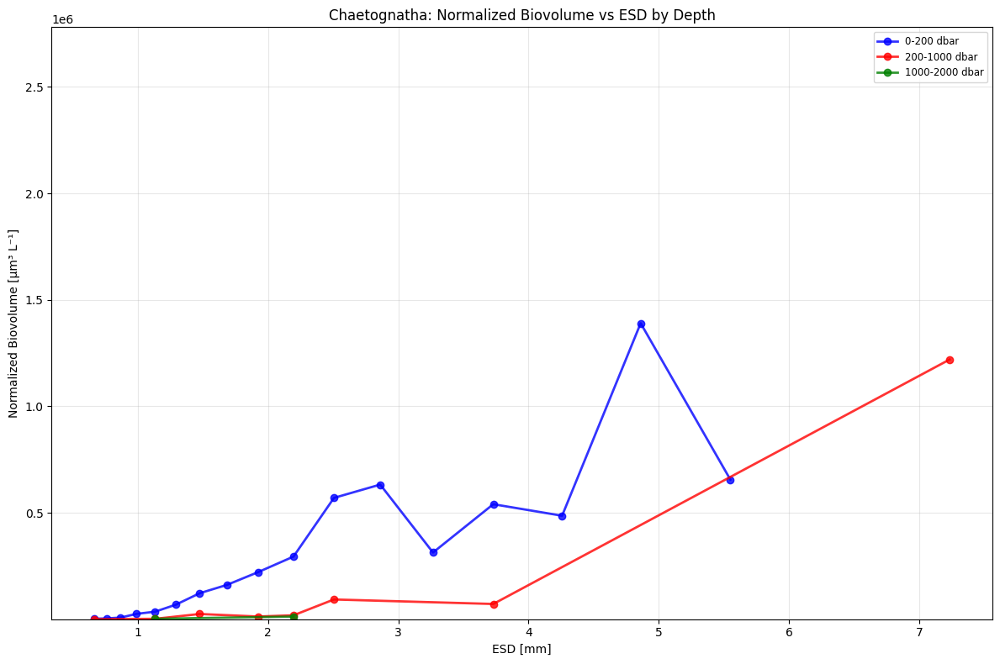

Created biovolume plot for Chaetognatha


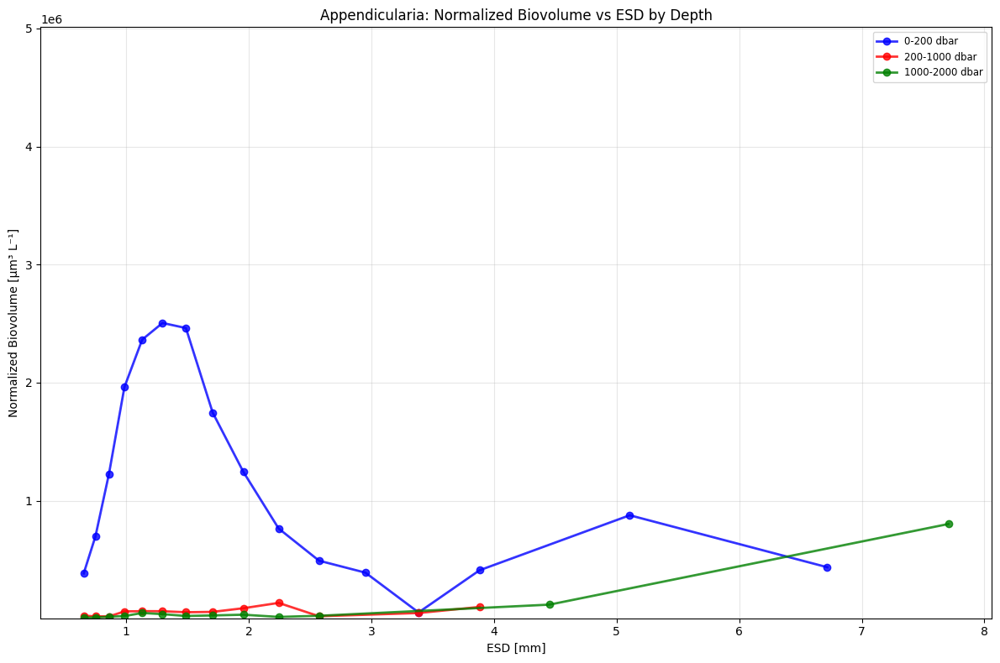

Created biovolume plot for Appendicularia


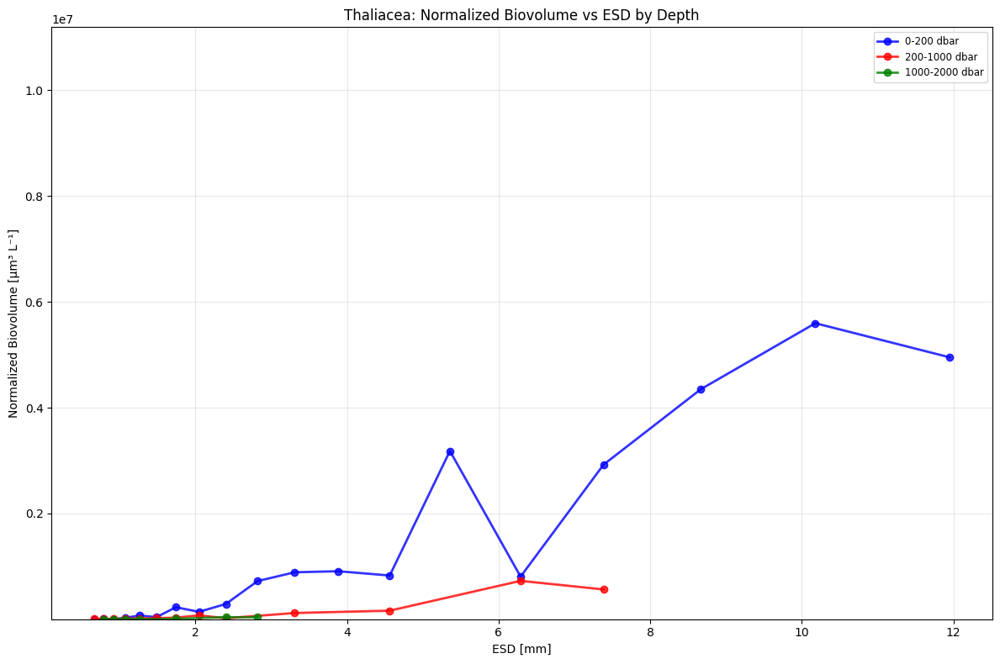

Created biovolume plot for Thaliacea


In [449]:
# Set up variables
main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
profiles = list(df['sample_id'].unique())
pressure_ranges = [(0, 200), (200, 1000), (1000, 2000)]

# Loop through each group and apply the plotting function
for i, group in enumerate(main_groups):
    # Filter data for this taxonomic group across all profiles
    group_df = df[df["object_annotation_hierarchy"].str.contains(group, na=False)]
    
    if not group_df.empty:
        # Apply the existing plotting function
        plot_biovolume_vs_esd_by_depth(
            df,  # Use full df since the function filters internally
            all_images_df,
            taxonomic_group=group,
            plot_path=plot_path,
            pressure_ranges=pressure_ranges
        )
        print(f"Created biovolume plot for {group}")
    else:
        print(f"No data found for {group}")

Created biovolume plot for Cnidaria
Created biovolume plot for Copepoda
Created biovolume plot for Rhizaria
Created biovolume plot for Chaetognatha
Created biovolume plot for Appendicularia
Created biovolume plot for Thaliacea


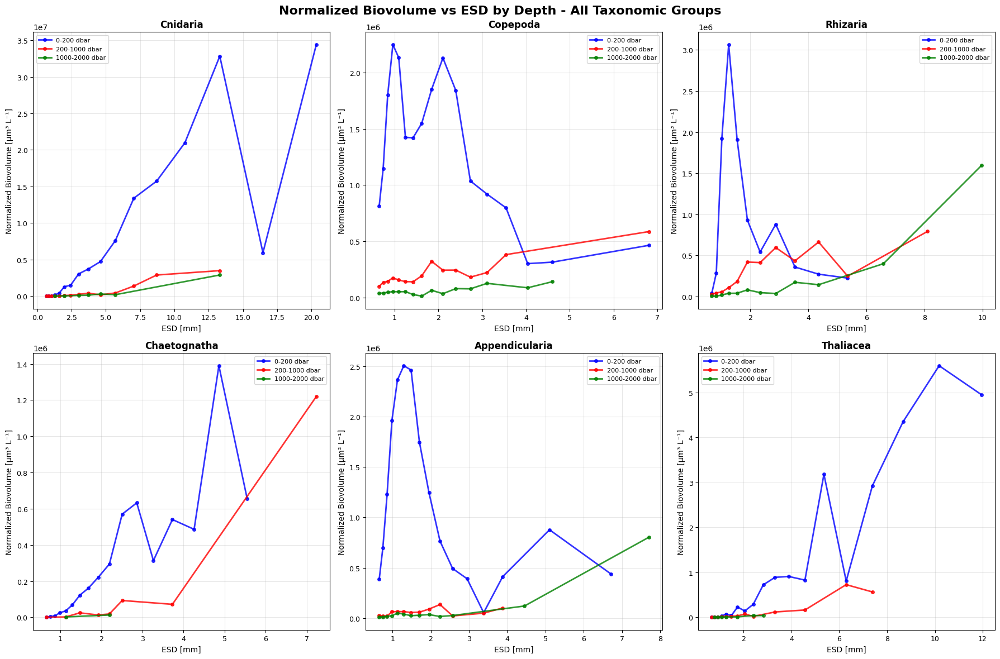

In [450]:
# Set up variables
main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
profiles = list(df['sample_id'].unique())
pressure_ranges = [(0, 200), (200, 1000), (1000, 2000)]

# Set up the subplot grid (2 rows, 3 columns) 
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()
colors = ['blue', 'red', 'green', 'orange', 'purple']

# Loop through each group and plot in its own subplot
for i, group in enumerate(main_groups):
    ax = axes[i]
    
    # Filter data for this taxonomic group across all profiles
    group_df = df[df["object_annotation_hierarchy"].str.contains(group, na=False)]
    
    if not group_df.empty:
        # Calculate biovolume if not present
        if 'volume_um3' not in group_df.columns:
            group_df = group_df.copy()
            group_df['volume_um3'] = (4/3) * np.pi * (group_df['object_esd']/2)**3
        
        # Use logarithmic ESD bins
        esd_min = group_df['object_esd'].min()
        esd_max = group_df['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=20)
        
        # Loop through pressure ranges for this group
        for j, (pressure_min, pressure_max) in enumerate(pressure_ranges):
            # Filter data for this pressure range
            depth_data = group_df[
                (group_df['object_pressure'] >= pressure_min) & 
                (group_df['object_pressure'] < pressure_max)
            ]
            
            if len(depth_data) == 0:
                continue
                
            # Calculate sampling volume for this depth range
            depth_images = all_images_df[
                (all_images_df['pressure'] >= pressure_min) & 
                (all_images_df['pressure'] < pressure_max)
            ]
            sampling_volume_L = len(depth_images) * VOLUME_PER_IMAGE_LITERS
            
            if sampling_volume_L == 0:
                continue
            
            # Bin particles by ESD
            esd_bin_indices = np.digitize(depth_data['object_esd'], esd_bins_log)
            
            # Calculate biovolume per ESD bin
            bin_centers = []
            biovolumes_normalized = []
            
            for bin_idx in range(1, len(esd_bins_log)):
                particles_in_bin = depth_data[esd_bin_indices == bin_idx]
                
                if len(particles_in_bin) > 0:
                    bin_center_um = np.sqrt(esd_bins_log[bin_idx-1] * esd_bins_log[bin_idx])
                    bin_center_mm = bin_center_um / 1000
                    total_biovolume = particles_in_bin['volume_um3'].sum()
                    
                    bin_centers.append(bin_center_mm)
                    biovolumes_normalized.append(total_biovolume / sampling_volume_L)
            
            # Plot this pressure range
            if len(bin_centers) > 0:
                non_zero_mask = np.array(biovolumes_normalized) > 0
                if np.any(non_zero_mask):
                    bin_centers_filtered = np.array(bin_centers)[non_zero_mask]
                    biovolumes_filtered = np.array(biovolumes_normalized)[non_zero_mask]
                    
                    pressure_label = f'{pressure_min}-{pressure_max} dbar'
                    ax.plot(bin_centers_filtered, biovolumes_filtered, 
                           'o-', color=colors[j % len(colors)], 
                           label=pressure_label,
                           linewidth=2, markersize=4, alpha=0.8)
        
        # Format this subplot
        ax.set_xlabel('ESD [mm]', fontsize=10)
        ax.set_ylabel('Normalized Biovolume [μm³ L⁻¹]', fontsize=10)
        ax.set_title(f'{group}', fontsize=12, fontweight='bold')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
        ax.tick_params(labelsize=9)
        
        print(f"Created biovolume plot for {group}")
    else:
        ax.text(0.5, 0.5, f'No data\nfor {group}', 
               transform=ax.transAxes, ha='center', va='center', fontsize=12)
        ax.set_title(f'{group}')
        print(f"No data found for {group}")

# Hide any unused subplots
for idx in range(len(main_groups), len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('Normalized Biovolume vs ESD by Depth - All Taxonomic Groups', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(plot_path, 'biovolume_vs_esd_all_groups_multipanel.png'), 
            dpi=300, bbox_inches='tight')
plt.show()
plt.close()

Created abundance plot for Cnidaria
Created abundance plot for Copepoda
Created abundance plot for Rhizaria
Created abundance plot for Chaetognatha
Created abundance plot for Appendicularia
Created abundance plot for Thaliacea
Created abundance plot for Calanoida
Created abundance plot for Oithona
Created abundance plot for Eumalacostraca
Created abundance plot for Asteroidea larvae
Created abundance plot for Bacillariophyceae
Created abundance plot for Trichodesmium
Created abundance plot for Noctiluca
Created abundance plot for Ctenophora


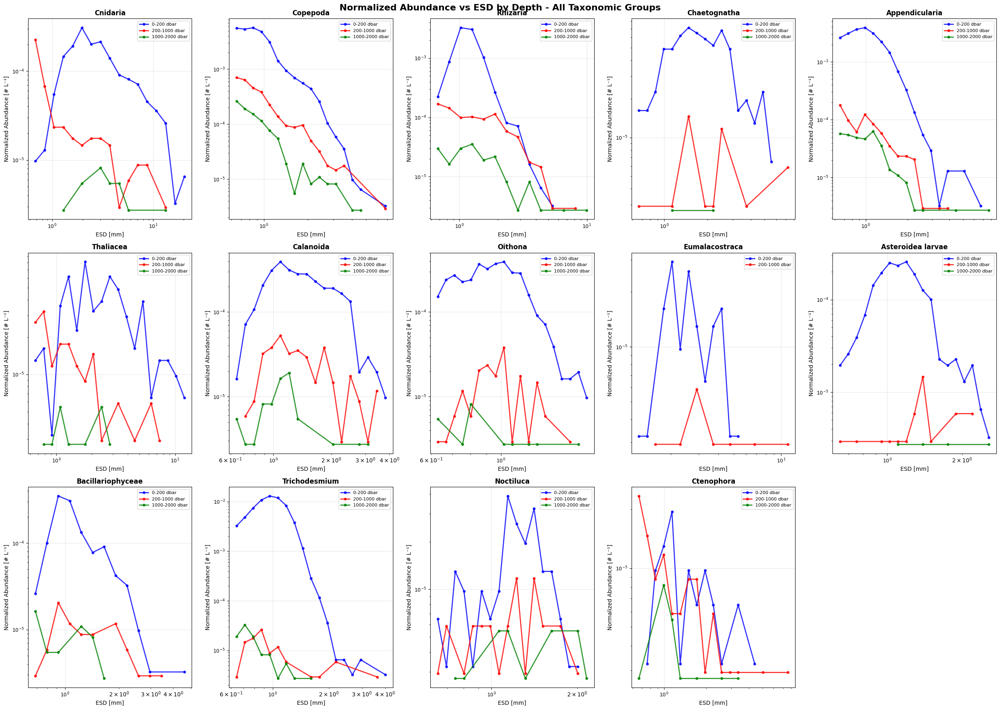

In [451]:
# Set up variables
#main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea", "Calanoida", "Oithona", "Eumalacostraca", "Asteroidea larvae", 
                   "Bacillariophyceae", "Trichodesmium", "Noctiluca", "Ctenophora"]

profiles = list(df['sample_id'].unique())
pressure_ranges = [(0, 200), (200, 1000), (1000, 2000)]

# Set up the subplot grid (2 rows, 3 columns) 
#fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig, axes = plt.subplots(3, 5, figsize=(25, 18))
axes = axes.flatten()
colors = ['blue', 'red', 'green', 'orange', 'purple']

# Loop through each group and plot in its own subplot
for i, group in enumerate(main_groups):
    ax = axes[i]
    
    # Filter data for this taxonomic group across all profiles
    group_df = df[df["object_annotation_hierarchy"].str.contains(group, na=False)]
    
    if not group_df.empty:
        # Use logarithmic ESD bins
        esd_min = group_df['object_esd'].min()
        esd_max = group_df['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=20)
        
        # Loop through pressure ranges for this group
        for j, (pressure_min, pressure_max) in enumerate(pressure_ranges):
            # Filter data for this pressure range
            depth_data = group_df[
                (group_df['object_pressure'] >= pressure_min) & 
                (group_df['object_pressure'] < pressure_max)
            ]
            
            if len(depth_data) == 0:
                continue
                
            # Calculate sampling volume for this depth range
            depth_images = all_images_df[
                (all_images_df['pressure'] >= pressure_min) & 
                (all_images_df['pressure'] < pressure_max)
            ]
            sampling_volume_L = len(depth_images) * VOLUME_PER_IMAGE_LITERS
            
            if sampling_volume_L == 0:
                continue
            
            # Bin particles by ESD
            esd_bin_indices = np.digitize(depth_data['object_esd'], esd_bins_log)
            
            # Calculate ABUNDANCE per ESD bin (CHANGED FROM BIOVOLUME)
            bin_centers = []
            abundances_normalized = []
            
            for bin_idx in range(1, len(esd_bins_log)):
                particles_in_bin = depth_data[esd_bin_indices == bin_idx]
                
                if len(particles_in_bin) > 0:
                    bin_center_um = np.sqrt(esd_bins_log[bin_idx-1] * esd_bins_log[bin_idx])
                    bin_center_mm = bin_center_um / 1000
                    # COUNT particles instead of summing biovolume
                    particle_count = len(particles_in_bin)
                    
                    bin_centers.append(bin_center_mm)
                    abundances_normalized.append(particle_count / sampling_volume_L)
            
            # Plot this pressure range
            if len(bin_centers) > 0:
                non_zero_mask = np.array(abundances_normalized) > 0
                if np.any(non_zero_mask):
                    bin_centers_filtered = np.array(bin_centers)[non_zero_mask]
                    abundances_filtered = np.array(abundances_normalized)[non_zero_mask]
                    
                    pressure_label = f'{pressure_min}-{pressure_max} dbar'
                    ax.loglog(bin_centers_filtered, abundances_filtered,  # CHANGED TO LOGLOG
                             'o-', color=colors[j % len(colors)], 
                             label=pressure_label,
                             linewidth=2, markersize=4, alpha=0.8)
        
        # Format this subplot (UPDATED LABELS)
        ax.set_xlabel('ESD [mm]', fontsize=10)
        ax.set_ylabel('Normalized Abundance [# L⁻¹]', fontsize=10)  # CHANGED LABEL
        ax.set_title(f'{group}', fontsize=12, fontweight='bold')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
        ax.tick_params(labelsize=9)
        
        print(f"Created abundance plot for {group}")
    else:
        ax.text(0.5, 0.5, f'No data\nfor {group}', 
               transform=ax.transAxes, ha='center', va='center', fontsize=12)
        ax.set_title(f'{group}')
        print(f"No data found for {group}")

# Hide any unused subplots
for idx in range(len(main_groups), len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('Normalized Abundance vs ESD by Depth - All Taxonomic Groups',  # CHANGED TITLE
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(plot_path, 'abundance_vs_esd_all_groups_multipanel.png'),  # CHANGED FILENAME
            dpi=300, bbox_inches='tight')
plt.show()
plt.close()

Plotted M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543 with 19 data points
Plotted M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758 with 16 data points
Plotted M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748 with 19 data points
Plotted M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024 with 15 data points
Plotted M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218 with 18 data points


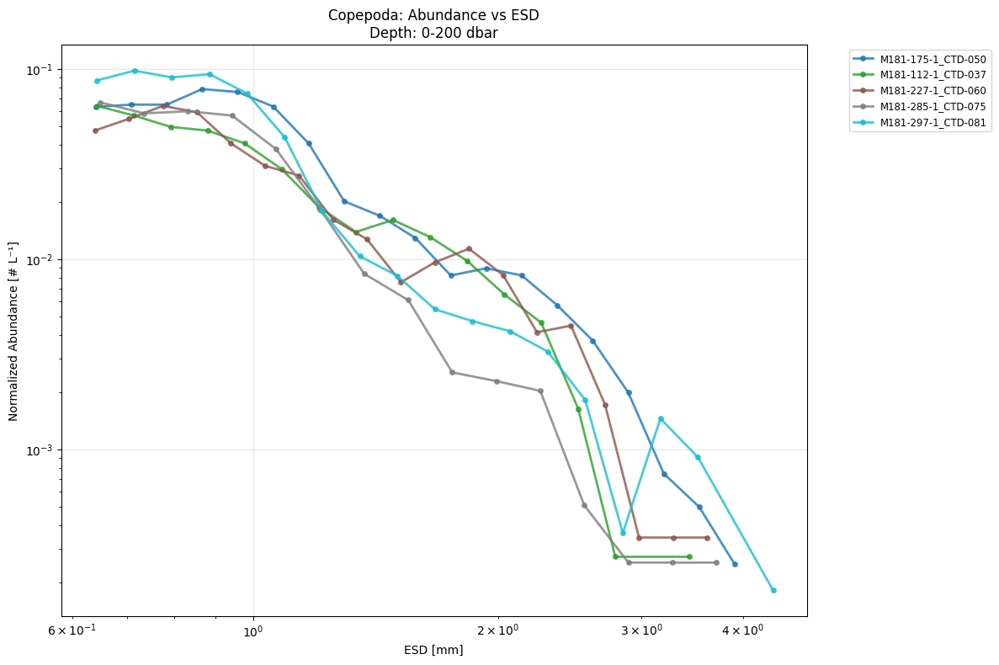

In [452]:
def plot_abundance_vs_esd_multi_profile(df, all_images_df, taxonomic_group, depth_range, plot_path):
    """
    Plot abundance vs ESD for one taxonomic group and one depth bin, 
    with a different line for each profile.
    """
    # Filter data for taxonomic group
    group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
    
    if group_df.empty:
        print(f"No data found for {taxonomic_group}")
        return
    
    fig, ax = plt.subplots(figsize=(12, 8))
    colors = plt.cm.tab10(np.linspace(0, 1, len(df['sample_id'].unique())))
    
    pressure_min, pressure_max = depth_range
    
    # Loop through each profile
    for i, (profile_id, color) in enumerate(zip(df['sample_id'].unique(), colors)):
        # Filter data for this profile and depth range
        profile_data = group_df[
            (group_df['sample_id'] == profile_id) &
            (group_df['object_pressure'] >= pressure_min) & 
            (group_df['object_pressure'] < pressure_max)
        ]
        
        if len(profile_data) == 0:
            continue
        
        # Extract core ID and find matching images
        core_id = profile_id.split('_')[0] + '_' + profile_id.split('_')[1]  # e.g., 'M181-112-1_CTD-037'
        
        # Find matching image metadata for this specific profile
        profile_images = all_images_df[all_images_df['sample_id'] == core_id]
        
        # Filter images for the depth range
        profile_images_depth = profile_images[
            (profile_images['pressure'] >= pressure_min) & 
            (profile_images['pressure'] < pressure_max)
        ]
        
        sampling_volume_L = len(profile_images_depth) * VOLUME_PER_IMAGE_LITERS
        
        if sampling_volume_L == 0:
            print(f"Warning: No images found for {profile_id} (core: {core_id}) in depth range {pressure_min}-{pressure_max}")
            continue
        
        # Use logarithmic ESD bins
        esd_min = profile_data['object_esd'].min()
        esd_max = profile_data['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=20)
        
        # Bin particles by ESD
        esd_bin_indices = np.digitize(profile_data['object_esd'], esd_bins_log)
        
        bin_centers = []
        abundances_normalized = []
        
        for bin_idx in range(1, len(esd_bins_log)):
            particles_in_bin = profile_data[esd_bin_indices == bin_idx]
            
            if len(particles_in_bin) > 0:
                bin_center_um = np.sqrt(esd_bins_log[bin_idx-1] * esd_bins_log[bin_idx])
                bin_center_mm = bin_center_um / 1000
                particle_count = len(particles_in_bin)
                
                bin_centers.append(bin_center_mm)
                abundances_normalized.append(particle_count / sampling_volume_L)
        
        # Plot this profile
        if len(bin_centers) > 0:
            non_zero_mask = np.array(abundances_normalized) > 0
            if np.any(non_zero_mask):
                bin_centers_filtered = np.array(bin_centers)[non_zero_mask]
                abundances_filtered = np.array(abundances_normalized)[non_zero_mask]
                
                ax.loglog(bin_centers_filtered, abundances_filtered,
                         'o-', color=color, label=profile_id[:18],  # Truncate long profile names
                         linewidth=2, markersize=4, alpha=0.8)
                
                print(f"Plotted {profile_id} with {len(bin_centers_filtered)} data points")
    
    
    ax.set_xlabel('ESD [mm]')
    ax.set_ylabel('Normalized Abundance [# L⁻¹]')
    ax.set_title(f'{taxonomic_group}: Abundance vs ESD\nDepth: {pressure_min}-{pressure_max} dbar')
    ax.legend(fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    filename = f'abundance_vs_esd_{taxonomic_group}_{pressure_min}-{pressure_max}dbar_multiprofile_fixed.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Test the fixed function
plot_abundance_vs_esd_multi_profile(
    df, all_images_df, 
    taxonomic_group='Copepoda', 
    depth_range=(0, 200), 
    plot_path=plot_path
)

Plotted M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758 (CTD-081) with 16 data points
Plotted M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543 (CTD-081) with 19 data points
Plotted M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748 (CTD-081) with 19 data points
Plotted M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024 (CTD-081) with 15 data points
Plotted M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218 (CTD-081) with 18 data points


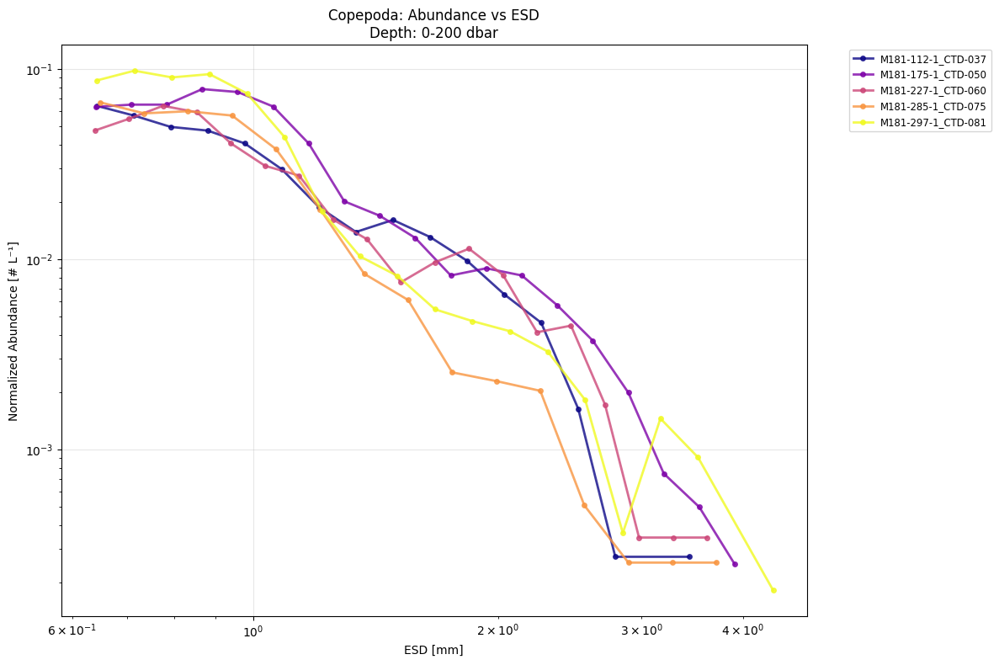

In [453]:
def plot_abundance_vs_esd_multi_profile_fixed(df, all_images_df, taxonomic_group, depth_range, plot_path):
    """
    Plot abundance vs ESD for one taxonomic group and one depth bin, 
    with a different line for each profile. Colors arranged as gradient by CTD number.
    """
    # Filter data for taxonomic group
    group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
    
    if group_df.empty:
        print(f"No data found for {taxonomic_group}")
        return
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    pressure_min, pressure_max = depth_range
    
    # Extract CTD numbers and sort profiles by CTD number for gradient coloring
    profile_ctd_pairs = []
    for profile_id in df['sample_id'].unique():
        # Extract CTD number from profile_id (e.g., 'M181-112-1_CTD-037_...' -> 37)
        try:
            ctd_match = profile_id.split('_CTD-')[1].split('_')[0]  # Gets '037' part
            ctd_number = int(ctd_match)  # Convert to integer for sorting
            profile_ctd_pairs.append((profile_id, ctd_number))
        except (IndexError, ValueError):
            # If CTD number can't be extracted, assign a high number to put it at the end
            profile_ctd_pairs.append((profile_id, 9999))
    
    # Sort by CTD number
    profile_ctd_pairs.sort(key=lambda x: x[1])
    sorted_profiles = [pair[0] for pair in profile_ctd_pairs]
    sorted_ctd_numbers = [pair[1] for pair in profile_ctd_pairs]
    
    # Create gradient colors from lowest to highest CTD number
    #colors = plt.cm.viridis(np.linspace(0, 1, len(sorted_profiles)))
    #colors = plt.cm.Blues(np.linspace(0, 1, len(sorted_profiles)))      # Light to dark blue
    colors = plt.cm.plasma(np.linspace(0, 1, len(sorted_profiles)))     # Purple to yellow
    #colors = plt.cm.magma(np.linspace(0, 1, len(sorted_profiles)))      # Black to white through purple

    
    # Loop through each profile (now sorted by CTD number)
    for i, (profile_id, color) in enumerate(zip(sorted_profiles, colors)):
        # Filter data for this profile and depth range
        profile_data = group_df[
            (group_df['sample_id'] == profile_id) &
            (group_df['object_pressure'] >= pressure_min) & 
            (group_df['object_pressure'] < pressure_max)
        ]
        
        if len(profile_data) == 0:
            continue
        
        # Extract core ID and find matching images
        core_id = profile_id.split('_')[0] + '_' + profile_id.split('_')[1]  # e.g., 'M181-112-1_CTD-037'
        
        # Find matching image metadata for this specific profile
        profile_images = all_images_df[all_images_df['sample_id'] == core_id]
        
        # Filter images for the depth range
        profile_images_depth = profile_images[
            (profile_images['pressure'] >= pressure_min) & 
            (profile_images['pressure'] < pressure_max)
        ]
        
        sampling_volume_L = len(profile_images_depth) * VOLUME_PER_IMAGE_LITERS
        
        if sampling_volume_L == 0:
            print(f"Warning: No images found for {profile_id} (core: {core_id}) in depth range {pressure_min}-{pressure_max}")
            continue
        
        # Use logarithmic ESD bins
        esd_min = profile_data['object_esd'].min()
        esd_max = profile_data['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=20)
        
        # Bin particles by ESD
        esd_bin_indices = np.digitize(profile_data['object_esd'], esd_bins_log)
        
        bin_centers = []
        abundances_normalized = []
        
        for bin_idx in range(1, len(esd_bins_log)):
            particles_in_bin = profile_data[esd_bin_indices == bin_idx]
            
            if len(particles_in_bin) > 0:
                bin_center_um = np.sqrt(esd_bins_log[bin_idx-1] * esd_bins_log[bin_idx])
                bin_center_mm = bin_center_um / 1000
                particle_count = len(particles_in_bin)
                
                bin_centers.append(bin_center_mm)
                abundances_normalized.append(particle_count / sampling_volume_L)
        
        # Plot this profile
        if len(bin_centers) > 0:
            non_zero_mask = np.array(abundances_normalized) > 0
            if np.any(non_zero_mask):
                bin_centers_filtered = np.array(bin_centers)[non_zero_mask]
                abundances_filtered = np.array(abundances_normalized)[non_zero_mask]
                
                # Use the first 18 characters of profile name in the label
                label = profile_id[:18]
                
                ax.loglog(bin_centers_filtered, abundances_filtered,
                         'o-', color=color, label=label,
                         linewidth=2, markersize=4, alpha=0.8)
                
                print(f"Plotted {profile_id} (CTD-{ctd_number:03d}) with {len(bin_centers_filtered)} data points")
    
    
    ax.set_xlabel('ESD [mm]')
    ax.set_ylabel('Normalized Abundance [# L⁻¹]')
    ax.set_title(f'{taxonomic_group}: Abundance vs ESD\nDepth: {pressure_min}-{pressure_max} dbar')
    ax.legend(fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    filename = f'abundance_vs_esd_{taxonomic_group}_{pressure_min}-{pressure_max}dbar_multiprofile_ctd_gradient.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Test the updated function
plot_abundance_vs_esd_multi_profile_fixed(
    df, all_images_df, 
    taxonomic_group='Copepoda', 
    depth_range=(0, 200), 
    plot_path=plot_path
)

Plotted M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758 with 16 data points
Plotted M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543 with 19 data points
Plotted M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748 with 19 data points
Plotted M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024 with 15 data points
Plotted M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218 with 18 data points


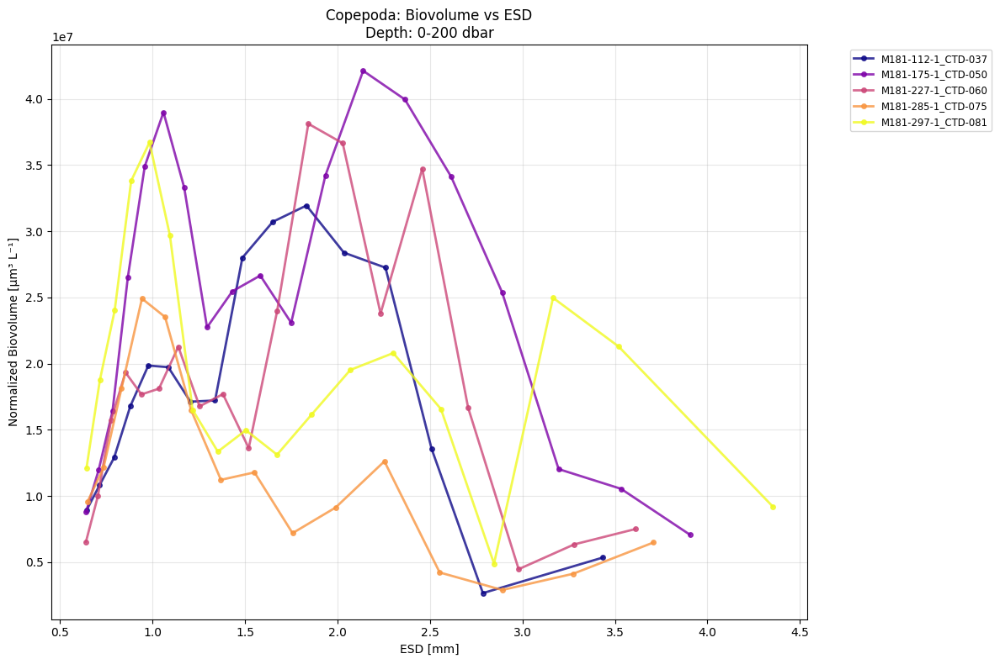

In [454]:
def plot_biovolume_vs_esd_multi_profile(df, all_images_df, taxonomic_group, depth_range, plot_path):
    """
    FIXED: Plot biovolume vs ESD for one taxonomic group and one depth bin, 
    with a different line for each profile. Colors arranged as gradient by CTD number.
    """
    # Filter data for taxonomic group
    group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
    
    if group_df.empty:
        print(f"No data found for {taxonomic_group}")
        return
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    pressure_min, pressure_max = depth_range
    
    # Extract CTD numbers and sort profiles by CTD number for gradient coloring
    profile_ctd_pairs = []
    for profile_id in df['sample_id'].unique():
        # Extract CTD number from profile_id (e.g., 'M181-112-1_CTD-037_...' -> 37)
        try:
            ctd_match = profile_id.split('_CTD-')[1].split('_')[0]  # Gets '037' part
            ctd_number = int(ctd_match)  # Convert to integer for sorting
            profile_ctd_pairs.append((profile_id, ctd_number))
        except (IndexError, ValueError):
            # If CTD number can't be extracted, assign a high number to put it at the end
            profile_ctd_pairs.append((profile_id, 9999))
    
    # Sort by CTD number
    profile_ctd_pairs.sort(key=lambda x: x[1])
    sorted_profiles = [pair[0] for pair in profile_ctd_pairs]
    sorted_ctd_numbers = [pair[1] for pair in profile_ctd_pairs]
    
    # Create gradient colors from lowest to highest CTD number
    colors = plt.cm.plasma(np.linspace(0, 1, len(sorted_profiles)))
    
    # Loop through each profile (now sorted by CTD number)
    for i, (profile_id, color) in enumerate(zip(sorted_profiles, colors)):
        # Filter data for this profile and depth range
        profile_data = group_df[
            (group_df['sample_id'] == profile_id) &
            (group_df['object_pressure'] >= pressure_min) & 
            (group_df['object_pressure'] < pressure_max)
        ]
        
        if len(profile_data) == 0:
            continue
        
        # Extract core ID and find matching images
        core_id = profile_id.split('_')[0] + '_' + profile_id.split('_')[1]  # e.g., 'M181-112-1_CTD-037'
        
        # Find matching image metadata for this specific profile
        profile_images = all_images_df[all_images_df['sample_id'] == core_id]
        
        # Filter images for the depth range
        profile_images_depth = profile_images[
            (profile_images['pressure'] >= pressure_min) & 
            (profile_images['pressure'] < pressure_max)
        ]
        
        sampling_volume_L = len(profile_images_depth) * VOLUME_PER_IMAGE_LITERS
        
        if sampling_volume_L == 0:
            print(f"Warning: No images found for {profile_id} (core: {core_id}) in depth range {pressure_min}-{pressure_max}")
            continue
        
        # Calculate biovolume if not present
        if 'volume_um3' not in profile_data.columns:
            profile_data = profile_data.copy()
            profile_data['volume_um3'] = (4/3) * np.pi * (profile_data['object_esd']/2)**3
        
        # Use logarithmic ESD bins
        esd_min = profile_data['object_esd'].min()
        esd_max = profile_data['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=20)
        
        # Bin particles by ESD
        esd_bin_indices = np.digitize(profile_data['object_esd'], esd_bins_log)
        
        bin_centers = []
        biovolumes_normalized = []
        
        for bin_idx in range(1, len(esd_bins_log)):
            particles_in_bin = profile_data[esd_bin_indices == bin_idx]
            
            if len(particles_in_bin) > 0:
                bin_center_um = np.sqrt(esd_bins_log[bin_idx-1] * esd_bins_log[bin_idx])
                bin_center_mm = bin_center_um / 1000
                # SUM biovolume instead of counting particles
                total_biovolume = particles_in_bin['volume_um3'].sum()
                
                bin_centers.append(bin_center_mm)
                biovolumes_normalized.append(total_biovolume / sampling_volume_L)
        
        # Plot this profile
        if len(bin_centers) > 0:
            non_zero_mask = np.array(biovolumes_normalized) > 0
            if np.any(non_zero_mask):
                bin_centers_filtered = np.array(bin_centers)[non_zero_mask]
                biovolumes_filtered = np.array(biovolumes_normalized)[non_zero_mask]
                
                # Use the first 18 characters of profile name in the label
                label = profile_id[:18]
                
                # LINEAR SCALING
                ax.plot(bin_centers_filtered, biovolumes_filtered,
                        'o-', color=color, label=label,
                        linewidth=2, markersize=4, alpha=0.8)
                
                print(f"Plotted {profile_id} with {len(bin_centers_filtered)} data points")
    
    
    ax.set_xlabel('ESD [mm]')
    ax.set_ylabel('Normalized Biovolume [μm³ L⁻¹]')
    ax.set_title(f'{taxonomic_group}: Biovolume vs ESD\nDepth: {pressure_min}-{pressure_max} dbar')
    ax.legend(fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    filename = f'biovolume_vs_esd_{taxonomic_group}_{pressure_min}-{pressure_max}dbar_multiprofile_ctd_gradient_linear.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Test the updated function
plot_biovolume_vs_esd_multi_profile(
    df, all_images_df, 
    taxonomic_group='Copepoda', 
    depth_range=(0, 200), 
    plot_path=plot_path
)

Plotted Cnidaria with 5 profiles
Plotted Copepoda with 5 profiles
Plotted Rhizaria with 5 profiles
Plotted Chaetognatha with 5 profiles
Plotted Appendicularia with 5 profiles
Plotted Thaliacea with 5 profiles
Plotted Calanoida with 5 profiles
Plotted Oithona with 5 profiles
Plotted Eumalacostraca with 5 profiles
Plotted Asteroidea larvae with 5 profiles
Plotted Bacillariophyceae with 5 profiles
Plotted Trichodesmium with 5 profiles
Plotted Noctiluca with 5 profiles
Plotted Ctenophora with 4 profiles


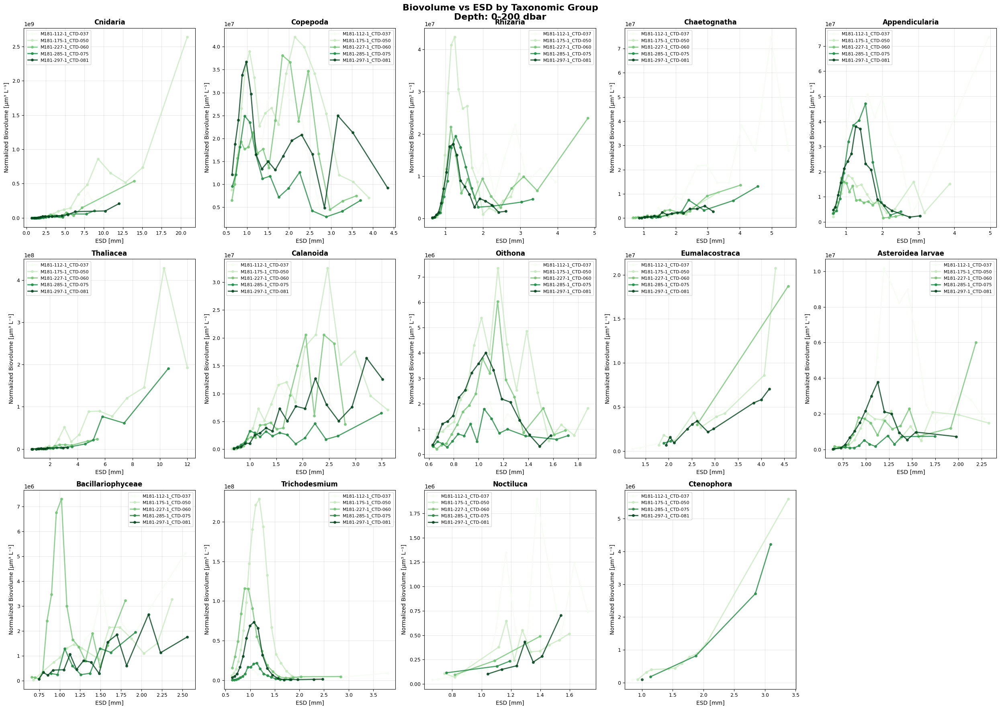

In [455]:
def plot_biovolume_vs_esd_multi_profile_all_groups(df, all_images_df, depth_range, plot_path):
    """
    Plot biovolume vs ESD for ALL taxonomic groups in a multi-panel subplot.
    Each group gets its own subplot with different lines for each profile.
    Colors arranged as gradient by CTD number.
    """
    # Define taxonomic groups
    #main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
    main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea", "Calanoida", "Oithona", "Eumalacostraca", "Asteroidea larvae", 
                   "Bacillariophyceae", "Trichodesmium", "Noctiluca", "Ctenophora"]

    pressure_min, pressure_max = depth_range
    
    # Extract and sort profiles by CTD number for consistent coloring
    profile_ctd_pairs = []
    for profile_id in df['sample_id'].unique():
        try:
            ctd_match = profile_id.split('_CTD-')[1].split('_')[0]
            ctd_number = int(ctd_match)
            profile_ctd_pairs.append((profile_id, ctd_number))
        except (IndexError, ValueError):
            profile_ctd_pairs.append((profile_id, 9999))
    
    profile_ctd_pairs.sort(key=lambda x: x[1])
    sorted_profiles = [pair[0] for pair in profile_ctd_pairs]
    
    # Create gradient colors
    colors = plt.cm.Greens(np.linspace(0, 1, len(sorted_profiles)))
    
    # Set up subplot grid (2 rows, 3 columns for 6 groups)
    #fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig, axes = plt.subplots(3, 5, figsize=(25, 18))
    axes = axes.flatten()
    
    # Loop through each taxonomic group
    for group_idx, taxonomic_group in enumerate(main_groups):
        ax = axes[group_idx]
        
        # Filter data for this taxonomic group
        group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
        
        if group_df.empty:
            ax.text(0.5, 0.5, f'No data for\n{taxonomic_group}', 
                   transform=ax.transAxes, ha='center', va='center', fontsize=12)
            ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
            continue
        
        profiles_plotted = 0
        
        # Loop through each profile for this group
        for i, (profile_id, color) in enumerate(zip(sorted_profiles, colors)):
            # Filter data for this profile and depth range
            profile_data = group_df[
                (group_df['sample_id'] == profile_id) &
                (group_df['object_pressure'] >= pressure_min) & 
                (group_df['object_pressure'] < pressure_max)
            ]
            
            if len(profile_data) == 0:
                continue
            
            # Extract core ID and find matching images
            core_id = profile_id.split('_')[0] + '_' + profile_id.split('_')[1]
            profile_images = all_images_df[all_images_df['sample_id'] == core_id]
            profile_images_depth = profile_images[
                (profile_images['pressure'] >= pressure_min) & 
                (profile_images['pressure'] < pressure_max)
            ]
            
            sampling_volume_L = len(profile_images_depth) * VOLUME_PER_IMAGE_LITERS
            
            if sampling_volume_L == 0:
                continue
            
            # Calculate biovolume if not present
            if 'volume_um3' not in profile_data.columns:
                profile_data = profile_data.copy()
                profile_data['volume_um3'] = (4/3) * np.pi * (profile_data['object_esd']/2)**3
            
            # Use logarithmic ESD bins
            esd_min = profile_data['object_esd'].min()
            esd_max = profile_data['object_esd'].max()
            esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=20)
            
            # Bin particles by ESD
            esd_bin_indices = np.digitize(profile_data['object_esd'], esd_bins_log)
            
            bin_centers = []
            biovolumes_normalized = []
            
            for bin_idx in range(1, len(esd_bins_log)):
                particles_in_bin = profile_data[esd_bin_indices == bin_idx]
                
                if len(particles_in_bin) > 0:
                    bin_center_um = np.sqrt(esd_bins_log[bin_idx-1] * esd_bins_log[bin_idx])
                    bin_center_mm = bin_center_um / 1000
                    # SUM biovolume instead of counting particles
                    total_biovolume = particles_in_bin['volume_um3'].sum()
                    
                    bin_centers.append(bin_center_mm)
                    biovolumes_normalized.append(total_biovolume / sampling_volume_L)
            
            # Plot this profile
            if len(bin_centers) > 0:
                non_zero_mask = np.array(biovolumes_normalized) > 0
                if np.any(non_zero_mask):
                    bin_centers_filtered = np.array(bin_centers)[non_zero_mask]
                    biovolumes_filtered = np.array(biovolumes_normalized)[non_zero_mask]
                    
                    # Use the first 18 characters of profile name in the label
                    label = profile_id[:18]
                    
                    # LINEAR SCALING
                    ax.plot(bin_centers_filtered, biovolumes_filtered,
                            'o-', color=color, label=label,
                            linewidth=2, markersize=4, alpha=0.8)
                    
                    profiles_plotted += 1
        
        # Format this subplot
        ax.set_xlabel('ESD [mm]', fontsize=10)
        ax.set_ylabel('Normalized Biovolume [μm³ L⁻¹]', fontsize=10)
        ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.tick_params(labelsize=9)
        
        # Only show legend if we have data and not too many profiles
        if profiles_plotted > 0 and profiles_plotted <= 8:
            ax.legend(fontsize=8, loc='best')
        elif profiles_plotted > 8:
            # For many profiles, just add a note about the color gradient
            ax.text(0.02, 0.98, f'{profiles_plotted} profiles\n(colored by CTD#)', 
                   transform=ax.transAxes, va='top', ha='left', 
                   fontsize=8, bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
        
        print(f"Plotted {taxonomic_group} with {profiles_plotted} profiles")
    
    # Hide any unused subplots
    for idx in range(len(main_groups), len(axes)):
        axes[idx].set_visible(False)
    
    # Overall title
    plt.suptitle(f'Biovolume vs ESD by Taxonomic Group\nDepth: {pressure_min}-{pressure_max} dbar', 
                 fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    filename = f'biovolume_vs_esd_all_groups_{pressure_min}-{pressure_max}dbar_multiprofile_comparison.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


# Test the function
plot_biovolume_vs_esd_multi_profile_all_groups(
    df, all_images_df, 
    depth_range=(0, 200), 
    plot_path=plot_path
)

Plotted Cnidaria with 5 profiles
Plotted Copepoda with 5 profiles
Plotted Rhizaria with 5 profiles
Plotted Chaetognatha with 5 profiles
Plotted Appendicularia with 5 profiles
Plotted Thaliacea with 5 profiles
Plotted Calanoida with 5 profiles
Plotted Oithona with 5 profiles
Plotted Eumalacostraca with 5 profiles
Plotted Asteroidea larvae with 5 profiles
Plotted Bacillariophyceae with 5 profiles
Plotted Trichodesmium with 5 profiles
Plotted Noctiluca with 5 profiles
Plotted Ctenophora with 4 profiles


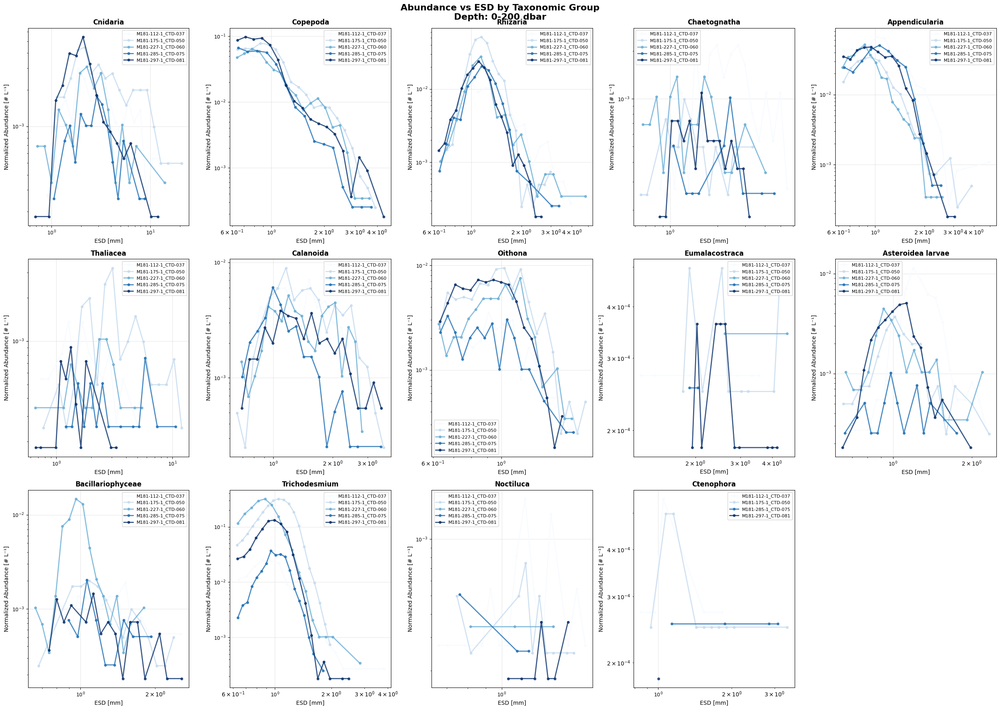

In [456]:
def plot_abundance_vs_esd_multi_profile_all_groups(df, all_images_df, depth_range, plot_path):
    """
    Plot abundance vs ESD for ALL taxonomic groups in a multi-panel subplot.
    Each group gets its own subplot with different lines for each profile.
    Colors arranged as gradient by CTD number.
    """
    # Define taxonomic groups
    #main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
    main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea", "Calanoida", "Oithona", "Eumalacostraca", "Asteroidea larvae", 
                   "Bacillariophyceae", "Trichodesmium", "Noctiluca", "Ctenophora"]    
    
    pressure_min, pressure_max = depth_range
    
    # Extract and sort profiles by CTD number for consistent coloring
    profile_ctd_pairs = []
    for profile_id in df['sample_id'].unique():
        try:
            ctd_match = profile_id.split('_CTD-')[1].split('_')[0]
            ctd_number = int(ctd_match)
            profile_ctd_pairs.append((profile_id, ctd_number))
        except (IndexError, ValueError):
            profile_ctd_pairs.append((profile_id, 9999))
    
    profile_ctd_pairs.sort(key=lambda x: x[1])
    sorted_profiles = [pair[0] for pair in profile_ctd_pairs]
    
    # Create gradient colors
    colors = plt.cm.Blues(np.linspace(0, 1, len(sorted_profiles)))
    
    # Set up subplot grid (2 rows, 3 columns for 6 groups)
    #fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig, axes = plt.subplots(3, 5, figsize=(25, 18))

    axes = axes.flatten()
    
    # Loop through each taxonomic group
    for group_idx, taxonomic_group in enumerate(main_groups):
        ax = axes[group_idx]
        
        # Filter data for this taxonomic group
        group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
        
        if group_df.empty:
            ax.text(0.5, 0.5, f'No data for\n{taxonomic_group}', 
                   transform=ax.transAxes, ha='center', va='center', fontsize=12)
            ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
            continue
        
        profiles_plotted = 0
        
        # Loop through each profile for this group
        for i, (profile_id, color) in enumerate(zip(sorted_profiles, colors)):
            # Filter data for this profile and depth range
            profile_data = group_df[
                (group_df['sample_id'] == profile_id) &
                (group_df['object_pressure'] >= pressure_min) & 
                (group_df['object_pressure'] < pressure_max)
            ]
            
            if len(profile_data) == 0:
                continue
            
            # Extract core ID and find matching images
            core_id = profile_id.split('_')[0] + '_' + profile_id.split('_')[1]
            profile_images = all_images_df[all_images_df['sample_id'] == core_id]
            profile_images_depth = profile_images[
                (profile_images['pressure'] >= pressure_min) & 
                (profile_images['pressure'] < pressure_max)
            ]
            
            sampling_volume_L = len(profile_images_depth) * VOLUME_PER_IMAGE_LITERS
            
            if sampling_volume_L == 0:
                continue
            
            # Use logarithmic ESD bins
            esd_min = profile_data['object_esd'].min()
            esd_max = profile_data['object_esd'].max()
            esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=20)
            
            # Bin particles by ESD
            esd_bin_indices = np.digitize(profile_data['object_esd'], esd_bins_log)
            
            bin_centers = []
            abundances_normalized = []
            
            for bin_idx in range(1, len(esd_bins_log)):
                particles_in_bin = profile_data[esd_bin_indices == bin_idx]
                
                if len(particles_in_bin) > 0:
                    bin_center_um = np.sqrt(esd_bins_log[bin_idx-1] * esd_bins_log[bin_idx])
                    bin_center_mm = bin_center_um / 1000
                    # COUNT particles instead of summing biovolume
                    particle_count = len(particles_in_bin)
                    
                    bin_centers.append(bin_center_mm)
                    abundances_normalized.append(particle_count / sampling_volume_L)
            
            # Plot this profile
            if len(bin_centers) > 0:
                non_zero_mask = np.array(abundances_normalized) > 0
                if np.any(non_zero_mask):
                    bin_centers_filtered = np.array(bin_centers)[non_zero_mask]
                    abundances_filtered = np.array(abundances_normalized)[non_zero_mask]
                    
                    # Use the first 18 characters of profile name in the label
                    label = profile_id[:18]
                    
                    # LOG-LOG SCALING (as per abundance convention)
                    ax.loglog(bin_centers_filtered, abundances_filtered,
                             'o-', color=color, label=label,
                             linewidth=2, markersize=4, alpha=0.8)
                    
                    profiles_plotted += 1
        
        # Format this subplot
        ax.set_xlabel('ESD [mm]', fontsize=10)
        ax.set_ylabel('Normalized Abundance [# L⁻¹]', fontsize=10)
        ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.tick_params(labelsize=9)
        
        # Only show legend if we have data and not too many profiles
        if profiles_plotted > 0 and profiles_plotted <= 8:
            ax.legend(fontsize=8, loc='best')
        elif profiles_plotted > 8:
            # For many profiles, just add a note about the color gradient
            ax.text(0.02, 0.98, f'{profiles_plotted} profiles\n(colored by CTD#)', 
                   transform=ax.transAxes, va='top', ha='left', 
                   fontsize=8, bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
        
        print(f"Plotted {taxonomic_group} with {profiles_plotted} profiles")
    
    # Hide any unused subplots
    for idx in range(len(main_groups), len(axes)):
        axes[idx].set_visible(False)
    
    # Overall title
    plt.suptitle(f'Abundance vs ESD by Taxonomic Group\nDepth: {pressure_min}-{pressure_max} dbar', 
                 fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    filename = f'abundance_vs_esd_all_groups_{pressure_min}-{pressure_max}dbar_multiprofile_comparison.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


# Test the function
plot_abundance_vs_esd_multi_profile_all_groups(
    df, all_images_df, 
    depth_range=(0, 200), 
    plot_path=plot_path
)

M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758: 63312 total particles, 5152 classified (8.1%), using 5152 for percentage calculation
M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543: 65802 total particles, 15014 classified (22.8%), using 15014 for percentage calculation
M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748: 64791 total particles, 8447 classified (13.0%), using 8447 for percentage calculation
M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024: 30918 total particles, 4279 classified (13.8%), using 4279 for percentage calculation
M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218: 52974 total particles, 10768 classified (20.3%), using 10768 for percentage calculation


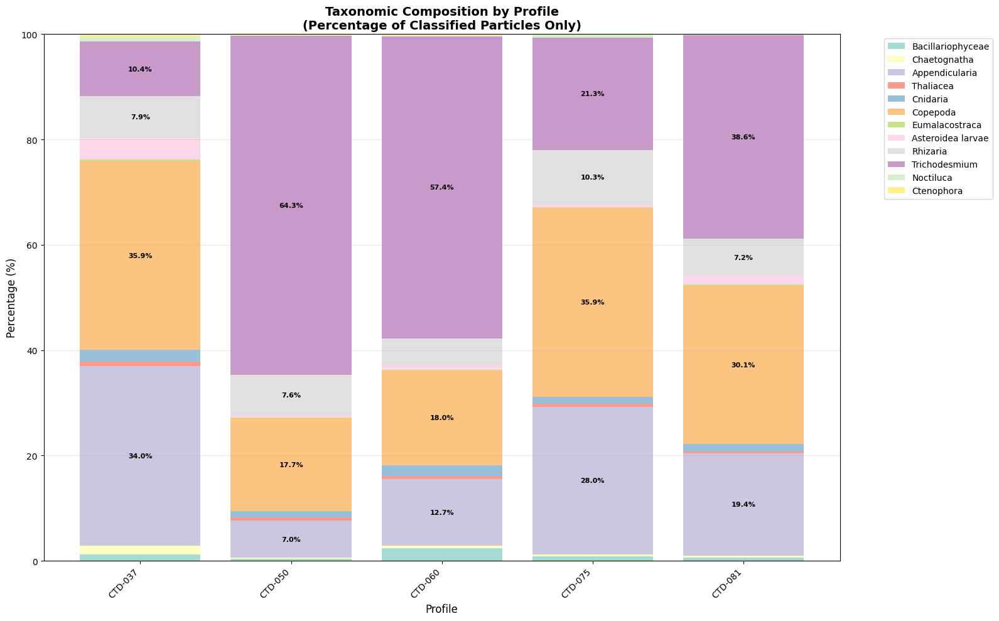

M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758: 63312 total particles, 39825753.42 mm³ classified biovolume (27.1% of total), using classified biovolume for percentage calculation
M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543: 65802 total particles, 62819648.06 mm³ classified biovolume (73.0% of total), using classified biovolume for percentage calculation
M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748: 64791 total particles, 12467331.87 mm³ classified biovolume (37.0% of total), using classified biovolume for percentage calculation
M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024: 30918 total particles, 8344637.42 mm³ classified biovolume (4.9% of total), using classified biovolume for percentage calculation
M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218: 52974 total particles, 12230804.01 mm³ classified biovolume (22.6% of total), using classified biovolume for percentage calculation


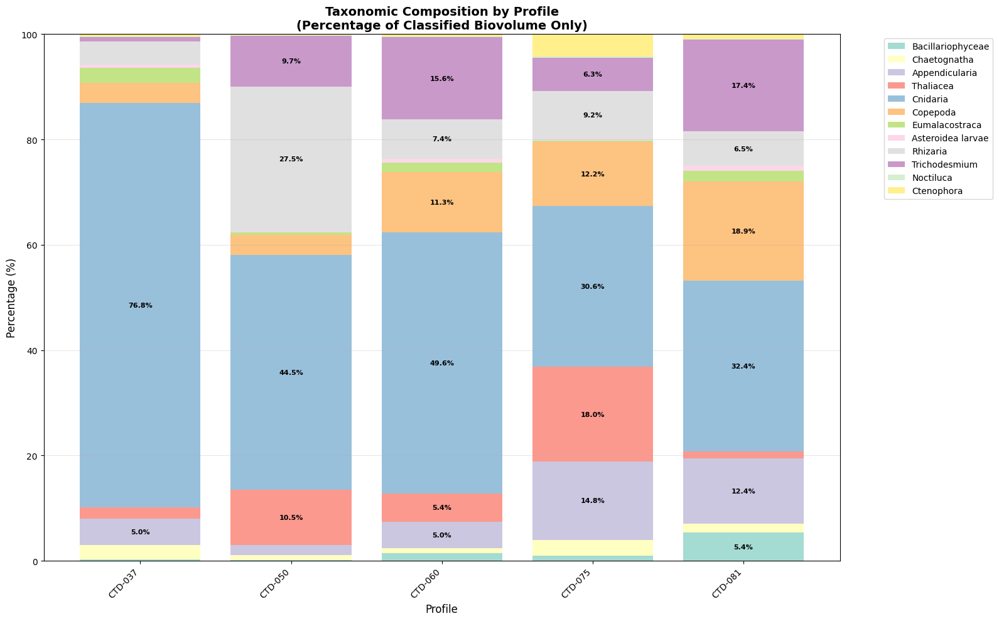

In [457]:
def plot_taxonomic_composition_overview(df, plot_path):
    """
    Plot taxonomic composition as percentage stacked bar chart for each profile.
    
    Parameters:
    - df: DataFrame with particle data including 'object_annotation_hierarchy' and 'sample_id'
    - plot_path: str, directory to save the plot
    """
    # Define the main taxonomic groups to analyze
    main_groups = [
        "Bacillariophyceae", "Chaetognatha", "Appendicularia", "Thaliacea", 
        "Cnidaria", "Copepoda", "Eumalacostraca", "Asteroidea larvae", 
        "Rhizaria", "Trichodesmium", "Noctiluca", "Ctenophora"
    ]
    
    # Get unique profiles
    profiles = sorted(df['sample_id'].unique())
    
    # Initialize results dictionary
    composition_data = {}
    
    for profile in profiles:
        profile_df = df[df['sample_id'] == profile]
        
        profile_composition = {}
        classified_count = 0
        
        # Count particles for each main group
        for group in main_groups:
            group_df = profile_df[
                profile_df["object_annotation_hierarchy"].str.contains(group, na=False)
            ]
            count = len(group_df)
            classified_count += count
            profile_composition[group] = count
        
        # Calculate percentages based only on classified particles
        for group in main_groups:
            percentage = (profile_composition[group] / classified_count * 100) if classified_count > 0 else 0
            profile_composition[group] = percentage
        
        composition_data[profile] = profile_composition
        
        total_particles = len(profile_df)
        print(f"{profile}: {total_particles} total particles, {classified_count} classified ({classified_count/total_particles*100:.1f}%), using {classified_count} for percentage calculation")
    
    # Convert to DataFrame for easier plotting
    composition_df = pd.DataFrame(composition_data).T
    composition_df = composition_df.fillna(0)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(16, 10))
    
    # Define colors for each group (use a colormap for consistency)
    colors = plt.cm.Set3(np.linspace(0, 1, len(main_groups)))
    color_dict = dict(zip(main_groups, colors))
    
    # Create stacked bar chart
    bottom = np.zeros(len(profiles))
    
    for group in main_groups:
        if group in composition_df.columns:
            values = composition_df[group].values
            ax.bar(range(len(profiles)), values, bottom=bottom, 
                   label=group, color=color_dict[group], alpha=0.8)
            bottom += values
    
    # Customize the plot
    ax.set_xlabel('Profile', fontsize=12)
    ax.set_ylabel('Percentage (%)', fontsize=12)
    ax.set_title('Taxonomic Composition by Profile\n(Percentage of Classified Particles Only)', fontsize=14, fontweight='bold')
    
    # Set x-axis labels (rotate for readability)
    profile_labels = [profile.split('_')[1] if '_' in profile else profile for profile in profiles]  # Extract CTD numbers
    ax.set_xticks(range(len(profiles)))
    ax.set_xticklabels(profile_labels, rotation=45, ha='right', fontsize=10)
    
    # Add legend
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    
    # Add grid for better readability
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_ylim(0, 100)
    
    # Add percentage labels on bars for major groups (>5%)
    for i, profile in enumerate(profiles):
        cumulative = 0
        for group in main_groups:
            if group in composition_df.columns:
                value = composition_df.loc[profile, group]
                if value > 5:  # Only label if >5%
                    y_pos = cumulative + value/2
                    ax.text(i, y_pos, f'{value:.1f}%', 
                           ha='center', va='center', fontsize=8, fontweight='bold')
                cumulative += value
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, 'taxonomic_composition_overview_classified_only.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    # Also create a summary table
    #print("\nTaxonomic Composition Summary (Percentages of Classified Particles):")
    #print(composition_df.round(1))
    
    return composition_df


def plot_taxonomic_composition_heatmap(df, plot_path):
    """
    Alternative visualization: heatmap showing taxonomic composition across profiles.
    """
    # Get composition data using the same logic as above
    main_groups = [
        "Bacillariophyceae", "Chaetognatha", "Appendicularia", "Thaliacea", 
        "Cnidaria", "Copepoda", "Eumalacostraca", "Asteroidea larvae", 
        "Rhizaria", "Trichodesmium", "Noctiluca", "Ctenophora"
    ]
    
    profiles = sorted(df['sample_id'].unique())
    composition_data = {}
    
    for profile in profiles:
        profile_df = df[df['sample_id'] == profile]
        
        profile_composition = {}
        classified_count = 0
        
        # Count particles for each main group
        for group in main_groups:
            group_df = profile_df[
                profile_df["object_annotation_hierarchy"].str.contains(group, na=False)
            ]
            count = len(group_df)
            classified_count += count
            profile_composition[group] = count
        
        # Calculate percentages based only on classified particles
        for group in main_groups:
            percentage = (profile_composition[group] / classified_count * 100) if classified_count > 0 else 0
            profile_composition[group] = percentage
        
        composition_data[profile] = profile_composition
    
    composition_df = pd.DataFrame(composition_data).T
    composition_df = composition_df.fillna(0)
    
    # Create heatmap
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create heatmap with custom colormap
    im = ax.imshow(composition_df.values, cmap='Blues', aspect='auto', vmin=0, vmax=composition_df.values.max())
    
    # Set ticks and labels
    ax.set_xticks(range(len(main_groups)))
    ax.set_xticklabels(main_groups, rotation=45, ha='right')
    ax.set_yticks(range(len(profiles)))
    
    profile_labels = [profile.split('_')[1] if '_' in profile else profile for profile in profiles]
    ax.set_yticklabels(profile_labels)
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label('Percentage (%)', rotation=270, labelpad=20)
    
    # Add text annotations for values >1%
    for i in range(len(profiles)):
        for j in range(len(main_groups)):
            value = composition_df.iloc[i, j]
            if value > 1:
                ax.text(j, i, f'{value:.1f}', ha='center', va='center', 
                       color='white' if value > composition_df.values.max()/2 else 'black',
                       fontsize=8, fontweight='bold')
    
    ax.set_title('Taxonomic Composition Heatmap\n(Percentage of Classified Particles Only)', 
                fontsize=14, fontweight='bold')
    ax.set_xlabel('Taxonomic Groups', fontsize=12)
    ax.set_ylabel('Profiles', fontsize=12)
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, 'taxonomic_composition_heatmap_classified_only.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    return composition_df



def plot_taxonomic_composition_biovolume_percentage(df, plot_path):
    """
    Plot taxonomic composition as biovolume percentage stacked bar chart for each profile.
    All bars have the same height (100%) showing relative biovolume proportions.
    
    Parameters:
    - df: DataFrame with particle data including 'object_annotation_hierarchy' and 'sample_id'
    - plot_path: str, directory to save the plot
    """
    # Calculate biovolume if not present
    df_with_vol = df.copy()
    if 'volume_um3' not in df_with_vol.columns:
        df_with_vol['volume_um3'] = (4/3) * np.pi * (df_with_vol['object_esd']/2)**3
    
    # Define the main taxonomic groups to analyze
    main_groups = [
        "Bacillariophyceae", "Chaetognatha", "Appendicularia", "Thaliacea", 
        "Cnidaria", "Copepoda", "Eumalacostraca", "Asteroidea larvae", 
        "Rhizaria", "Trichodesmium", "Noctiluca", "Ctenophora"
    ]
    
    # Get unique profiles
    profiles = sorted(df_with_vol['sample_id'].unique())
    
    # Initialize results dictionary
    biovolume_data = {}
    
    for profile in profiles:
        profile_df = df_with_vol[df_with_vol['sample_id'] == profile]
        
        profile_biovolume = {}
        classified_biovolume = 0
        
        # Sum biovolume for each main group
        for group in main_groups:
            group_df = profile_df[
                profile_df["object_annotation_hierarchy"].str.contains(group, na=False)
            ]
            biovolume_sum = group_df['volume_um3'].sum()
            classified_biovolume += biovolume_sum
            profile_biovolume[group] = biovolume_sum
        
        # Calculate percentages based only on classified biovolume
        for group in main_groups:
            percentage = (profile_biovolume[group] / classified_biovolume * 100) if classified_biovolume > 0 else 0
            profile_biovolume[group] = percentage
        
        biovolume_data[profile] = profile_biovolume
        
        total_particles = len(profile_df)
        total_biovolume = profile_df['volume_um3'].sum()
        print(f"{profile}: {total_particles} total particles, {classified_biovolume/1e6:.2f} mm³ classified biovolume ({classified_biovolume/total_biovolume*100:.1f}% of total), using classified biovolume for percentage calculation")
    
    # Convert to DataFrame for easier plotting
    biovolume_df = pd.DataFrame(biovolume_data).T
    biovolume_df = biovolume_df.fillna(0)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(16, 10))
    
    # Define colors for each group (use a colormap for consistency)
    colors = plt.cm.Set3(np.linspace(0, 1, len(main_groups)))
    color_dict = dict(zip(main_groups, colors))
    
    # Create stacked bar chart with biovolume percentages
    bottom = np.zeros(len(profiles))
    
    for group in main_groups:
        if group in biovolume_df.columns:
            values = biovolume_df[group].values
            ax.bar(range(len(profiles)), values, bottom=bottom, 
                   label=group, color=color_dict[group], alpha=0.8)
            bottom += values
    
    # Customize the plot
    ax.set_xlabel('Profile', fontsize=12)
    ax.set_ylabel('Percentage (%)', fontsize=12)
    ax.set_title('Taxonomic Composition by Profile\n(Percentage of Classified Biovolume Only)', fontsize=14, fontweight='bold')
    
    # Set x-axis labels (rotate for readability)
    profile_labels = [profile.split('_')[1] if '_' in profile else profile for profile in profiles]  # Extract CTD numbers
    ax.set_xticks(range(len(profiles)))
    ax.set_xticklabels(profile_labels, rotation=45, ha='right', fontsize=10)
    
    # Add legend
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    
    # Add grid for better readability
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_ylim(0, 100)
    
    # Add percentage labels on bars for major groups (>5%)
    for i, profile in enumerate(profiles):
        cumulative = 0
        for group in main_groups:
            if group in biovolume_df.columns:
                value = biovolume_df.loc[profile, group]
                if value > 5:  # Only label if >5%
                    y_pos = cumulative + value/2
                    ax.text(i, y_pos, f'{value:.1f}%', 
                           ha='center', va='center', fontsize=8, fontweight='bold')
                cumulative += value
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, 'taxonomic_composition_biovolume_percentage.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    # Also create a summary table
    #print("\nTaxonomic Composition Summary (Biovolume Percentages):")
    #print(biovolume_df.round(1))
    
    return biovolume_df

# Generate both visualizations (excluding unclassified)
composition_df = plot_taxonomic_composition_overview(df, plot_path)
#composition_heatmap_df = plot_taxonomic_composition_heatmap(df, plot_path)
composition_biovolume_percentage_df = plot_taxonomic_composition_biovolume_percentage(df, plot_path)

M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758: 63312 total particles, 5152 classified (8.1%)
M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543: 65802 total particles, 15014 classified (22.8%)
M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748: 64791 total particles, 8447 classified (13.0%)
M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024: 30918 total particles, 4279 classified (13.8%)
M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218: 52974 total particles, 10768 classified (20.3%)


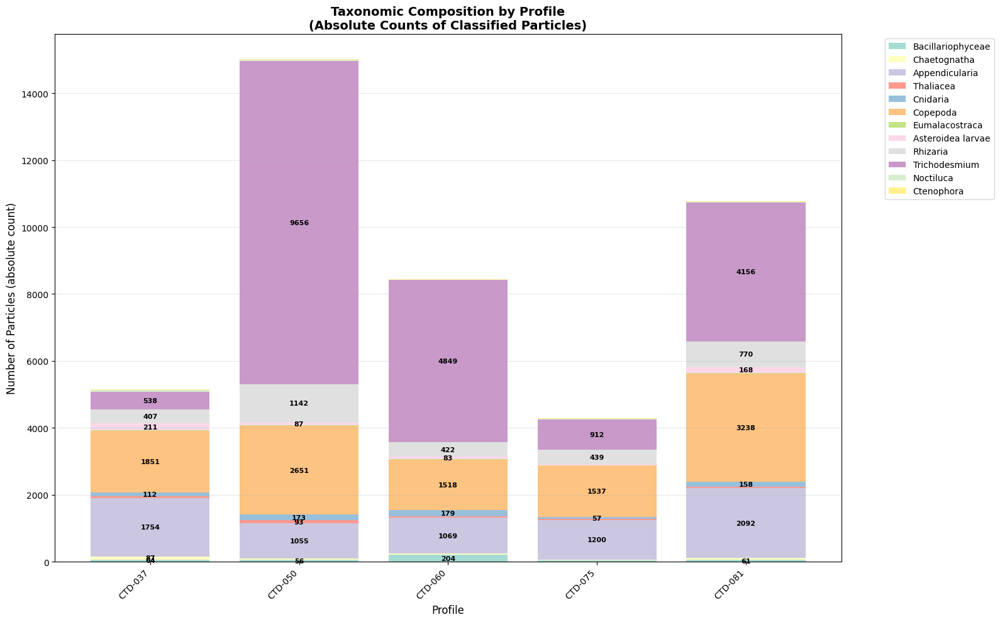

M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758: 63312 total particles, 39825753.42 mm³ classified biovolume (27.1% of total)
M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543: 65802 total particles, 62819648.06 mm³ classified biovolume (73.0% of total)
M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748: 64791 total particles, 12467331.87 mm³ classified biovolume (37.0% of total)
M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024: 30918 total particles, 8344637.42 mm³ classified biovolume (4.9% of total)
M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218: 52974 total particles, 12230804.01 mm³ classified biovolume (22.6% of total)


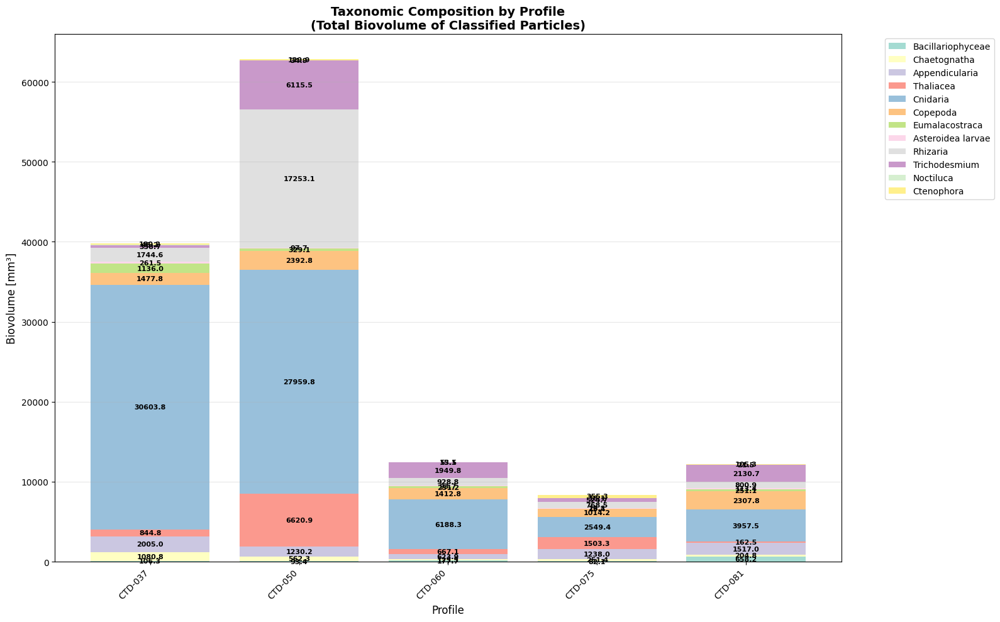

In [458]:
def plot_taxonomic_composition_absolute_counts(df, plot_path):
    """
    Plot taxonomic composition as absolute count stacked bar chart for each profile.
    Bar heights vary based on total number of classified particles per profile.
    
    Parameters:
    - df: DataFrame with particle data including 'object_annotation_hierarchy' and 'sample_id'
    - plot_path: str, directory to save the plot
    """
    # Define the main taxonomic groups to analyze
    main_groups = [
        "Bacillariophyceae", "Chaetognatha", "Appendicularia", "Thaliacea", 
        "Cnidaria", "Copepoda", "Eumalacostraca", "Asteroidea larvae", 
        "Rhizaria", "Trichodesmium", "Noctiluca", "Ctenophora"
    ]
    
    # Get unique profiles
    profiles = sorted(df['sample_id'].unique())
    
    # Initialize results dictionary
    composition_data = {}
    
    for profile in profiles:
        profile_df = df[df['sample_id'] == profile]
        
        profile_composition = {}
        classified_count = 0
        
        # Count particles for each main group
        for group in main_groups:
            group_df = profile_df[
                profile_df["object_annotation_hierarchy"].str.contains(group, na=False)
            ]
            count = len(group_df)
            classified_count += count
            profile_composition[group] = count  # Keep absolute counts, not percentages
        
        composition_data[profile] = profile_composition
        
        total_particles = len(profile_df)
        print(f"{profile}: {total_particles} total particles, {classified_count} classified ({classified_count/total_particles*100:.1f}%)")
    
    # Convert to DataFrame for easier plotting
    composition_df = pd.DataFrame(composition_data).T
    composition_df = composition_df.fillna(0)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(16, 10))
    
    # Define colors for each group (use a colormap for consistency)
    colors = plt.cm.Set3(np.linspace(0, 1, len(main_groups)))
    color_dict = dict(zip(main_groups, colors))
    
    # Create stacked bar chart with absolute counts
    bottom = np.zeros(len(profiles))
    
    for group in main_groups:
        if group in composition_df.columns:
            values = composition_df[group].values
            ax.bar(range(len(profiles)), values, bottom=bottom, 
                   label=group, color=color_dict[group], alpha=0.8)
            bottom += values
    
    # Customize the plot
    ax.set_xlabel('Profile', fontsize=12)
    ax.set_ylabel('Number of Particles (absolute count)', fontsize=12)
    ax.set_title('Taxonomic Composition by Profile\n(Absolute Counts of Classified Particles)', fontsize=14, fontweight='bold')
    
    # Set x-axis labels (rotate for readability)
    profile_labels = [profile.split('_')[1] if '_' in profile else profile for profile in profiles]  # Extract CTD numbers
    ax.set_xticks(range(len(profiles)))
    ax.set_xticklabels(profile_labels, rotation=45, ha='right', fontsize=10)
    
    # Add legend
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    
    # Add grid for better readability
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add count labels on bars for major groups (>50 particles)
    for i, profile in enumerate(profiles):
        cumulative = 0
        for group in main_groups:
            if group in composition_df.columns:
                value = composition_df.loc[profile, group]
                if value > 50:  # Only label if >50 particles
                    y_pos = cumulative + value/2
                    ax.text(i, y_pos, f'{int(value)}', 
                           ha='center', va='center', fontsize=8, fontweight='bold')
                cumulative += value
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, 'taxonomic_composition_absolute_counts.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    # Also create a summary table
    #print("\nTaxonomic Composition Summary (Absolute Counts):")
    #print(composition_df.astype(int))
    
    return composition_df


def plot_taxonomic_composition_biovolume(df, plot_path):
    """
    Plot taxonomic composition as biovolume stacked bar chart for each profile.
    Bar heights vary based on total biovolume per profile.
    
    Parameters:
    - df: DataFrame with particle data including 'object_annotation_hierarchy' and 'sample_id'
    - plot_path: str, directory to save the plot
    """
    # Calculate biovolume if not present
    df_with_vol = df.copy()
    if 'volume_um3' not in df_with_vol.columns:
        df_with_vol['volume_um3'] = (4/3) * np.pi * (df_with_vol['object_esd']/2)**3
    
    # Define the main taxonomic groups to analyze
    main_groups = [
        "Bacillariophyceae", "Chaetognatha", "Appendicularia", "Thaliacea", 
        "Cnidaria", "Copepoda", "Eumalacostraca", "Asteroidea larvae", 
        "Rhizaria", "Trichodesmium", "Noctiluca", "Ctenophora"
    ]
    
    # Get unique profiles
    profiles = sorted(df_with_vol['sample_id'].unique())
    
    # Initialize results dictionary
    biovolume_data = {}
    
    for profile in profiles:
        profile_df = df_with_vol[df_with_vol['sample_id'] == profile]
        
        profile_biovolume = {}
        classified_biovolume = 0
        
        # Sum biovolume for each main group
        for group in main_groups:
            group_df = profile_df[
                profile_df["object_annotation_hierarchy"].str.contains(group, na=False)
            ]
            biovolume_sum = group_df['volume_um3'].sum()
            classified_biovolume += biovolume_sum
            profile_biovolume[group] = biovolume_sum
        
        biovolume_data[profile] = profile_biovolume
        
        total_particles = len(profile_df)
        total_biovolume = profile_df['volume_um3'].sum()
        print(f"{profile}: {total_particles} total particles, {classified_biovolume/1e6:.2f} mm³ classified biovolume ({classified_biovolume/total_biovolume*100:.1f}% of total)")
    
    # Convert to DataFrame for easier plotting
    biovolume_df = pd.DataFrame(biovolume_data).T
    biovolume_df = biovolume_df.fillna(0)
    
    # Convert to mm³ for better readability
    biovolume_df_mm3 = biovolume_df / 1e9  # Convert from μm³ to mm³
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(16, 10))
    
    # Define colors for each group (use a colormap for consistency)
    colors = plt.cm.Set3(np.linspace(0, 1, len(main_groups)))
    color_dict = dict(zip(main_groups, colors))
    
    # Create stacked bar chart with biovolume
    bottom = np.zeros(len(profiles))
    
    for group in main_groups:
        if group in biovolume_df_mm3.columns:
            values = biovolume_df_mm3[group].values
            ax.bar(range(len(profiles)), values, bottom=bottom, 
                   label=group, color=color_dict[group], alpha=0.8)
            bottom += values
    
    # Customize the plot
    ax.set_xlabel('Profile', fontsize=12)
    ax.set_ylabel('Biovolume [mm³]', fontsize=12)
    ax.set_title('Taxonomic Composition by Profile\n(Total Biovolume of Classified Particles)', fontsize=14, fontweight='bold')
    
    # Set x-axis labels (rotate for readability)
    profile_labels = [profile.split('_')[1] if '_' in profile else profile for profile in profiles]  # Extract CTD numbers
    ax.set_xticks(range(len(profiles)))
    ax.set_xticklabels(profile_labels, rotation=45, ha='right', fontsize=10)
    
    # Add legend
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    
    # Add grid for better readability
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add biovolume labels on bars for major contributors (>0.1 mm³)
    for i, profile in enumerate(profiles):
        cumulative = 0
        for group in main_groups:
            if group in biovolume_df_mm3.columns:
                value = biovolume_df_mm3.loc[profile, group]
                if value > 0.1:  # Only label if >0.1 mm³
                    y_pos = cumulative + value/2
                    ax.text(i, y_pos, f'{value:.1f}', 
                           ha='center', va='center', fontsize=8, fontweight='bold')
                cumulative += value
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, 'taxonomic_composition_biovolume.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    # Also create a summary table
    #print("\nTaxonomic Composition Summary (Biovolume in mm³):")
    #print(biovolume_df_mm3.round(3))
    
    return biovolume_df_mm3


# Generate both new visualizations
composition_counts_df = plot_taxonomic_composition_absolute_counts(df, plot_path)
composition_biovolume_df = plot_taxonomic_composition_biovolume(df, plot_path)

M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218: 52974 total particles, 10768 classified, 32944.66L sampled, normalized by volume
M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024: 30918 total particles, 4279 classified, 32021.04L sampled, normalized by volume
M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748: 64791 total particles, 8447 classified, 25022.63L sampled, normalized by volume
M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543: 65802 total particles, 15014 classified, 39487.03L sampled, normalized by volume
M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758: 63312 total particles, 5152 classified, 46845.27L sampled, normalized by volume


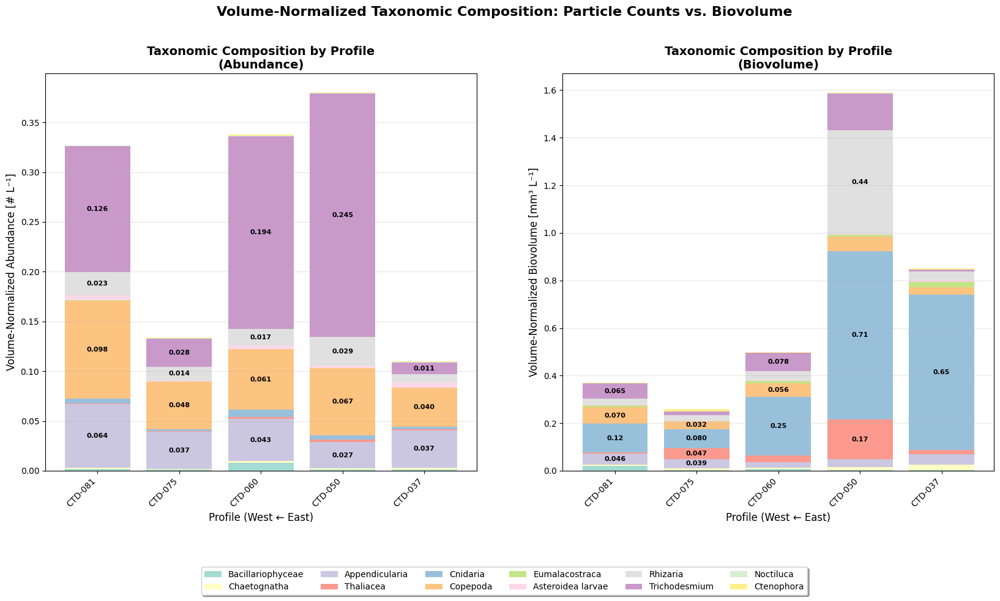

Profile order (West to East):
1. CTD-081: M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218
2. CTD-075: M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024
3. CTD-060: M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748
4. CTD-050: M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543
5. CTD-037: M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758


In [19]:
def plot_taxonomic_composition_combined_volume_normalized(df, all_images_df, plot_path):
    """
    Plot taxonomic composition showing both absolute counts and biovolume side by side.
    Profiles arranged from highest to lowest CTD number (west to east).
    Single shared legend and west-to-east indicator.
    
    UPDATED: Now uses VOLUME NORMALIZATION for both counts and biovolume
    to match your other analysis functions.
    
    Parameters:
    - df: DataFrame with particle data including 'object_annotation_hierarchy' and 'sample_id'
    - all_images_df: DataFrame with image metadata for volume normalization
    - plot_path: str, directory to save the plot
    """
    # Calculate biovolume if not present
    df_with_vol = df.copy()
    if 'volume_um3' not in df_with_vol.columns:
        df_with_vol['volume_um3'] = (4/3) * np.pi * (df_with_vol['object_esd']/2)**3
    
    # Define the main taxonomic groups to analyze
    main_groups = [
        "Bacillariophyceae", "Chaetognatha", "Appendicularia", "Thaliacea", 
        "Cnidaria", "Copepoda", "Eumalacostraca", "Asteroidea larvae", 
        "Rhizaria", "Trichodesmium", "Noctiluca", "Ctenophora"
    ]
    
    # Get unique profiles and sort by CTD number (west to east)
    profiles = sorted(df_with_vol['sample_id'].unique())
    
    # Extract CTD numbers and sort profiles by CTD number
    profile_ctd_pairs = []
    for profile in profiles:
        try:
            ctd_match = profile.split('_CTD-')[1].split('_')[0]  # Gets '037' part
            ctd_number = int(ctd_match)  # Convert to integer for sorting
            profile_ctd_pairs.append((profile, ctd_number))
        except (IndexError, ValueError):
            profile_ctd_pairs.append((profile, 9999))  # Put unparseable at end
    
    # Sort by CTD number in DESCENDING order (highest to lowest = west to east)
    profile_ctd_pairs.sort(key=lambda x: x[1], reverse=True)
    sorted_profiles = [pair[0] for pair in profile_ctd_pairs]
    sorted_ctd_numbers = [pair[1] for pair in profile_ctd_pairs]
    
    # ============= COLLECT VOLUME-NORMALIZED DATA FOR BOTH PLOTS =============
    
    # For volume-normalized counts
    composition_data_normalized = {}
    for profile in sorted_profiles:
        profile_df = df_with_vol[df_with_vol['sample_id'] == profile]
        
        # Extract core ID for image matching
        core_id = profile.split('_')[0] + '_' + profile.split('_')[1]  # e.g., 'M181-112-1_CTD-037'
        
        # Find matching image metadata for this specific profile
        profile_images = all_images_df[all_images_df['sample_id'] == core_id]
        
        if profile_images.empty:
            print(f"Warning: No matching images found for profile {profile} (core: {core_id})")
            continue
        
        # Count images per pressure bin & calculate sampled volume (SAME AS YOUR OTHER FUNCTIONS)
        profile_images = profile_images.copy()
        profile_images['pressure_bin'] = np.digitize(profile_images['pressure'], 
                                                   np.arange(0, profile_images['pressure'].max() + 50, 50))
        
        image_counts = profile_images.groupby('pressure_bin').size().reset_index(name='image_count')
        image_counts['sampled_volume_L'] = image_counts['image_count'] * VOLUME_PER_IMAGE_LITERS
        
        # Calculate total sampling volume for this profile
        total_sampling_volume_L = image_counts['sampled_volume_L'].sum()
        
        if total_sampling_volume_L == 0:
            print(f"Warning: Zero sampling volume for profile {profile}")
            continue
        
        profile_composition_normalized = {}
        
        # Count particles for each main group and NORMALIZE BY VOLUME
        for group in main_groups:
            group_df = profile_df[
                profile_df["object_annotation_hierarchy"].str.contains(group, na=False)
            ]
            count = len(group_df)
            # NORMALIZE by total sampling volume (same approach as your other functions)
            count_normalized = count / total_sampling_volume_L
            profile_composition_normalized[group] = count_normalized
        
        composition_data_normalized[profile] = profile_composition_normalized
        
        total_particles = len(profile_df)
        classified_count = sum(len(profile_df[profile_df["object_annotation_hierarchy"].str.contains(group, na=False)]) for group in main_groups)
        print(f"{profile}: {total_particles} total particles, {classified_count} classified, {total_sampling_volume_L:.2f}L sampled, normalized by volume")
    
    composition_df_normalized = pd.DataFrame(composition_data_normalized).T.fillna(0)
    
    # For volume-normalized biovolume
    biovolume_data_normalized = {}
    for profile in sorted_profiles:
        profile_df = df_with_vol[df_with_vol['sample_id'] == profile]
        
        # Extract core ID for image matching
        core_id = profile.split('_')[0] + '_' + profile.split('_')[1]
        
        # Find matching image metadata for this specific profile
        profile_images = all_images_df[all_images_df['sample_id'] == core_id]
        
        if profile_images.empty:
            continue
        
        # Count images per pressure bin & calculate sampled volume
        profile_images = profile_images.copy()
        profile_images['pressure_bin'] = np.digitize(profile_images['pressure'], 
                                                   np.arange(0, profile_images['pressure'].max() + 50, 50))
        
        image_counts = profile_images.groupby('pressure_bin').size().reset_index(name='image_count')
        image_counts['sampled_volume_L'] = image_counts['image_count'] * VOLUME_PER_IMAGE_LITERS
        
        # Calculate total sampling volume for this profile
        total_sampling_volume_L = image_counts['sampled_volume_L'].sum()
        
        if total_sampling_volume_L == 0:
            continue
        
        profile_biovolume_normalized = {}
        
        # Sum biovolume for each main group and NORMALIZE BY VOLUME
        for group in main_groups:
            group_df = profile_df[
                profile_df["object_annotation_hierarchy"].str.contains(group, na=False)
            ]
            biovolume_sum = group_df['volume_um3'].sum()
            # NORMALIZE by total sampling volume
            biovolume_normalized = biovolume_sum / total_sampling_volume_L
            profile_biovolume_normalized[group] = biovolume_normalized
        
        biovolume_data_normalized[profile] = profile_biovolume_normalized
    
    biovolume_df_normalized = pd.DataFrame(biovolume_data_normalized).T.fillna(0)
    biovolume_df_normalized_mm3_per_L = biovolume_df_normalized / 1e9  # Convert from μm³/L to mm³/L
    
    # ============= CREATE COMBINED PLOT =============
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    
    # Define colors for each group (consistent across both plots)
    colors = plt.cm.Set3(np.linspace(0, 1, len(main_groups)))
    color_dict = dict(zip(main_groups, colors))
    
    # Extract CTD numbers for x-axis labels
    profile_labels = [f"CTD-{ctd:03d}" for ctd in sorted_ctd_numbers]
    
    # ============= LEFT PLOT: VOLUME-NORMALIZED COUNTS =============
    
    bottom1 = np.zeros(len(sorted_profiles))
    
    for group in main_groups:
        if group in composition_df_normalized.columns:
            values = composition_df_normalized.loc[sorted_profiles, group].values
            ax1.bar(range(len(sorted_profiles)), values, bottom=bottom1, 
                   label=group, color=color_dict[group], alpha=0.8)
            bottom1 += values
    
    # Add count labels for major contributors (>0.5 particles/L)
    for i, profile in enumerate(sorted_profiles):
        cumulative = 0
        for group in main_groups:
            if group in composition_df_normalized.columns:
                value = composition_df_normalized.loc[profile, group]
                if value > 0.01:  # Only label if >0.5 particles/L
                    y_pos = cumulative + value/2
                    ax1.text(i, y_pos, f'{value:.3f}', 
                           ha='center', va='center', fontsize=8, fontweight='bold')
                cumulative += value
    
    ax1.set_xlabel('Profile (West ← East)', fontsize=12)
    ax1.set_ylabel('Volume-Normalized Abundance [# L⁻¹]', fontsize=12)  # UPDATED LABEL
    ax1.set_title('Taxonomic Composition by Profile\n(Abundance)', fontsize=14, fontweight='bold')  # UPDATED TITLE
    ax1.set_xticks(range(len(sorted_profiles)))
    ax1.set_xticklabels(profile_labels, rotation=45, ha='right', fontsize=10)
    ax1.grid(True, alpha=0.3, axis='y')
    
    # ============= RIGHT PLOT: VOLUME-NORMALIZED BIOVOLUME =============
    
    bottom2 = np.zeros(len(sorted_profiles))
    
    for group in main_groups:
        if group in biovolume_df_normalized_mm3_per_L.columns:
            values = biovolume_df_normalized_mm3_per_L.loc[sorted_profiles, group].values
            ax2.bar(range(len(sorted_profiles)), values, bottom=bottom2, 
                   label=group, color=color_dict[group], alpha=0.8)
            bottom2 += values
    
    # IMPROVED BIOVOLUME LABELING for normalized values
    for i, profile in enumerate(sorted_profiles):
        cumulative = 0
        for group in main_groups:
            if group in biovolume_df_normalized_mm3_per_L.columns:
                value = biovolume_df_normalized_mm3_per_L.loc[profile, group]
                segment_height = value
                
                # Only label segments that are significant contributors (>0.01 mm³/L OR >10% of profile total)
                total_height = biovolume_df_normalized_mm3_per_L.loc[profile].sum()
                percentage_of_total = (value / total_height * 100) if total_height > 0 else 0
                
                if value > 0.01 and percentage_of_total > 10:  # Significant contributors (adjusted for normalized values)
                    y_pos = cumulative + segment_height/2
                    
                    # Format the value for normalized biovolume
                    if value > 1:
                        label_text = f'{value:.1f}'    # Show as "2.7"
                    elif value > 0.1:
                        label_text = f'{value:.2f}'    # Show as "0.45" 
                    else:
                        label_text = f'{value:.3f}'    # Show as "0.025"
                    
                    ax2.text(i, y_pos, label_text, 
                           ha='center', va='center', fontsize=8, fontweight='bold',
                           color='black')
                
                cumulative += segment_height
    
    ax2.set_xlabel('Profile (West ← East)', fontsize=12)
    ax2.set_ylabel('Volume-Normalized Biovolume [mm³ L⁻¹]', fontsize=12)  # UPDATED LABEL
    ax2.set_title('Taxonomic Composition by Profile\n(Biovolume)', fontsize=14, fontweight='bold')  # UPDATED TITLE
    ax2.set_xticks(range(len(sorted_profiles)))
    ax2.set_xticklabels(profile_labels, rotation=45, ha='right', fontsize=10)
    ax2.grid(True, alpha=0.3, axis='y')
    
    # ============= SINGLE SHARED LEGEND =============
    
    # Create legend between the two plots
    handles, labels = ax1.get_legend_handles_labels()
    fig.legend(handles, labels, loc='center', bbox_to_anchor=(0.5, 0.02), 
              ncol=6, fontsize=10, frameon=True, fancybox=True, shadow=True)
    
    # Add overall title
    plt.suptitle('Volume-Normalized Taxonomic Composition: Particle Counts vs. Biovolume', 
                 fontsize=16, fontweight='bold', y=0.96)
    
    # Adjust layout to accommodate legend
    plt.subplots_adjust(bottom=0.2, top=0.85)
    
    # Save plot
    plt.savefig(os.path.join(plot_path, 'taxonomic_composition_combined_volume_normalized_west_east.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    # Print sorting information
    print("Profile order (West to East):")
    for i, (profile, ctd_num) in enumerate(zip(sorted_profiles, sorted_ctd_numbers)):
        print(f"{i+1}. CTD-{ctd_num:03d}: {profile}")
    
    return composition_df_normalized.loc[sorted_profiles], biovolume_df_normalized_mm3_per_L.loc[sorted_profiles]


# Generate the volume-normalized combined plot
composition_counts_normalized_df, composition_biovolume_normalized_df = plot_taxonomic_composition_combined_volume_normalized(df, all_images_df, plot_path)

In [460]:
#print(df.head(object_time-date))
print(df.columns)

Index(['object_id', 'object_lat', 'object_lon', 'object_date', 'object_time',
       'object_link', 'object_depth_min', 'object_depth_max',
       'object_annotation_status', 'object_annotation_person_name',
       'object_annotation_person_email', 'object_annotation_date',
       'object_annotation_time', 'object_annotation_category',
       'object_annotation_hierarchy', 'complement_info', 'object_pressure',
       'object_area', 'object_width', 'object_height', 'object_bound_box_w',
       'object_bound_box_h', 'object_circularity', 'object_area_exc',
       'object_area_rprops', 'object_%area', 'object_major_axis_len',
       'object_minor_axis_len', 'object_centroid_y', 'object_centroid_x',
       'object_convex_area', 'object_min_intensity', 'object_max_intensity',
       'object_mean_intensity', 'object_int_density', 'object_perimeter',
       'object_elongation', 'object_range', 'object_perim_area_excl',
       'object_perim_major', 'object_circularity_area_excl', 'object_angle

In [461]:
def display_profile_sample_times_from_particles(df):
    """
    Display sample time information for each profile using particle data timestamps.
    
    Parameters:
    - df: DataFrame with particle data including 'sample_id', 'object_time', 'object_date'
    """
    profiles = sorted(df['sample_id'].unique())
    
    print("Profile Sample Times (from Particle Data):")
    print("=" * 70)
    
    profile_times = []
    
    for profile in profiles:
        profile_df = df[df['sample_id'] == profile]
        particle_count = len(profile_df)
        
        if 'object_time' in profile_df.columns and 'object_date' in profile_df.columns:
            try:
                # Combine date and time columns to create full datetime
                if pd.api.types.is_datetime64_any_dtype(profile_df['object_time']):
                    # If object_time is already datetime, use it directly
                    times = pd.to_datetime(profile_df['object_time'])
                else:
                    # If separate date and time columns, combine them
                    datetime_strings = profile_df['object_date'].astype(str) + ' ' + profile_df['object_time'].astype(str)
                    times = pd.to_datetime(datetime_strings, errors='coerce')
                
                times = times.dropna()
                
                if len(times) > 0:
                    start_time = times.min()
                    end_time = times.max()
                    duration = end_time - start_time
                    
                    profile_times.append({
                        'Profile': profile,
                        'Start Time': start_time,
                        'End Time': end_time,
                        'Duration': duration,
                        'Particles': particle_count
                    })
                    
                    print(f"Profile: {profile}")
                    print(f"  Start: {start_time}")
                    print(f"  End:   {end_time}")
                    print(f"  Duration: {duration}")
                    print(f"  Particles: {particle_count}")
                    print("-" * 70)
                else:
                    print(f"Profile: {profile}")
                    print("  Could not parse time information")
                    print(f"  Particles: {particle_count}")
                    print("-" * 70)
                    
            except Exception as e:
                print(f"Profile: {profile}")
                print(f"  Error parsing dates: {e}")
                print(f"  Particles: {particle_count}")
                print("-" * 70)
        else:
            print(f"Profile: {profile}")
            print("  No time columns found")
            print(f"  Particles: {particle_count}")
            print("-" * 70)
    
    # Create a summary DataFrame
    if profile_times:
        summary_df = pd.DataFrame(profile_times)
        return summary_df
    else:
        return None




def inspect_time_columns(df):
    """
    Inspect the time-related columns in the particle DataFrame.
    """
    print("Time Column Inspection:")
    print("=" * 50)
    
    print("Available columns:", df.columns.tolist())
    print()
    
    if 'object_time' in df.columns:
        print("object_time column:")
        print(f"  Data type: {df['object_time'].dtype}")
        print(f"  Sample values: {df['object_time'].head().tolist()}")
        print(f"  Unique values: {df['object_time'].nunique()}")
        print()
    
    if 'object_date' in df.columns:
        print("object_date column:")
        print(f"  Data type: {df['object_date'].dtype}")
        print(f"  Sample values: {df['object_date'].head().tolist()}")
        print(f"  Unique values: {df['object_date'].nunique()}")
        print()


# First, let's inspect what we have in the time columns
inspect_time_columns(df)

# Then run the corrected functions
summary_df_particles = display_profile_sample_times_from_particles(df)

if summary_df_particles is not None:
    print("\nSummary Table (from Particle Data):")
    print(summary_df_particles.to_string(index=False))


Time Column Inspection:
Available columns: ['object_id', 'object_lat', 'object_lon', 'object_date', 'object_time', 'object_link', 'object_depth_min', 'object_depth_max', 'object_annotation_status', 'object_annotation_person_name', 'object_annotation_person_email', 'object_annotation_date', 'object_annotation_time', 'object_annotation_category', 'object_annotation_hierarchy', 'complement_info', 'object_pressure', 'object_area', 'object_width', 'object_height', 'object_bound_box_w', 'object_bound_box_h', 'object_circularity', 'object_area_exc', 'object_area_rprops', 'object_%area', 'object_major_axis_len', 'object_minor_axis_len', 'object_centroid_y', 'object_centroid_x', 'object_convex_area', 'object_min_intensity', 'object_max_intensity', 'object_mean_intensity', 'object_int_density', 'object_perimeter', 'object_elongation', 'object_range', 'object_perim_area_excl', 'object_perim_major', 'object_circularity_area_excl', 'object_angle', 'object_boundbox_area', 'object_eccentricity', 'obj

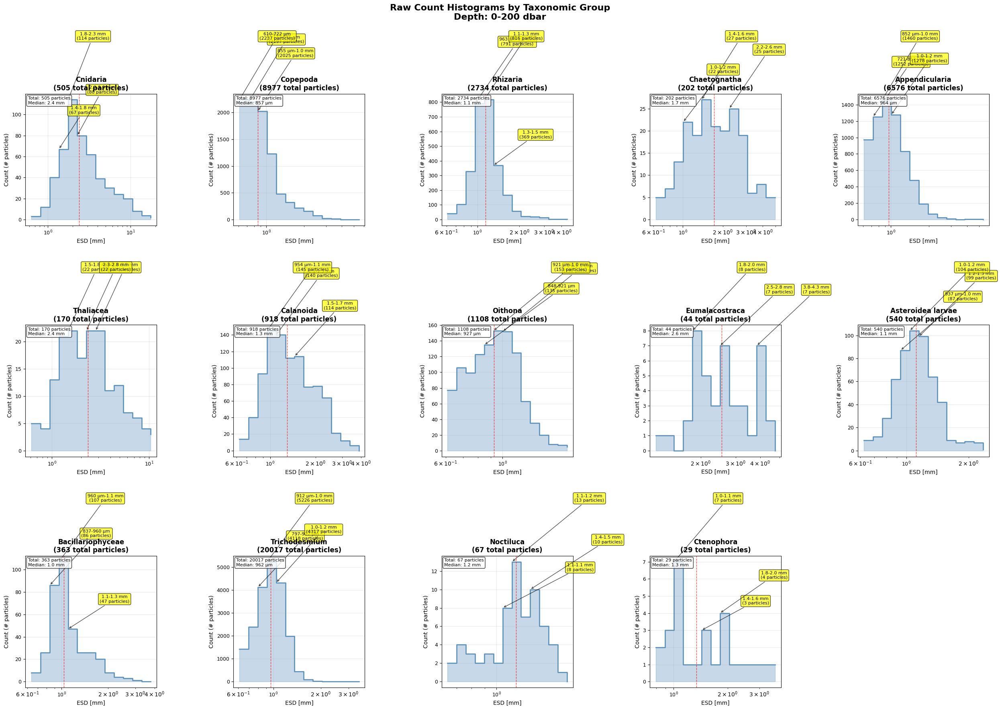

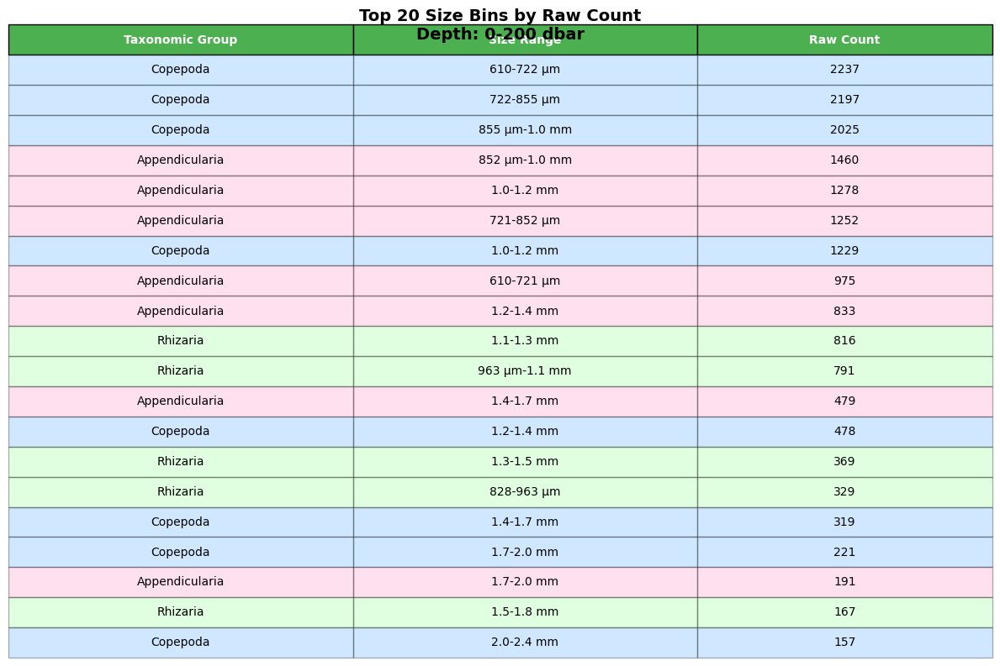

In [ ]:
def plot_abundance_histogram_multi_group_raw_counts(df, depth_range, plot_path, n_bins=15):
    """
    Plot abundance histograms for ALL taxonomic groups showing RAW COUNTS.
    Each group gets its own histogram showing particle counts per ESD size bin (no normalization).
    """
    #main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
    main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea", "Calanoida", "Oithona", "Eumalacostraca", "Asteroidea larvae", 
                   "Bacillariophyceae", "Trichodesmium", "Noctiluca", "Ctenophora"]
    pressure_min, pressure_max = depth_range
    
    #fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig, axes = plt.subplots(3, 5, figsize=(25, 18))

    axes = axes.flatten()
    
    for group_idx, taxonomic_group in enumerate(main_groups):
        ax = axes[group_idx]
        
        group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
        depth_data = group_df[
            (group_df['object_pressure'] >= pressure_min) & 
            (group_df['object_pressure'] < pressure_max)
        ]
        
        if depth_data.empty:
            ax.text(0.5, 0.5, f'No data for\n{taxonomic_group}', 
                   transform=ax.transAxes, ha='center', va='center', fontsize=12)
            ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
            continue
        
        # Create bins and calculate histogram (NO VOLUME NORMALIZATION)
        esd_min = depth_data['object_esd'].min()
        esd_max = depth_data['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=n_bins)
        
        counts, bin_edges = np.histogram(depth_data['object_esd'], bins=esd_bins_log)
        # Use raw counts directly - no normalization!
        
        # Convert to mm for plotting
        bin_edges_mm = bin_edges / 1000
        
        # Create size range labels for each bin
        size_labels = []
        for i in range(len(bin_edges)-1):
            lower_bound = bin_edges[i]
            upper_bound = bin_edges[i+1]
            
            # Format based on size range
            if upper_bound < 1000:  # Both in μm
                label = f'{lower_bound:.0f}-{upper_bound:.0f} μm'
            elif lower_bound < 1000 < upper_bound:  # Crosses the mm boundary
                label = f'{lower_bound:.0f} μm-{upper_bound/1000:.1f} mm'
            else:  # Both in mm
                label = f'{lower_bound/1000:.1f}-{upper_bound/1000:.1f} mm'
            
            size_labels.append(label)
        
        # Plot as step histogram with raw counts
        ax.step(bin_edges_mm[:-1], counts, where='post',
                linewidth=2, color='steelblue', alpha=0.8)
        ax.fill_between(bin_edges_mm[:-1], counts, step='post',
                       alpha=0.3, color='steelblue')
        
        # Add size range annotations for the 3 most abundant bins
        if len(counts) > 0:
            # Find top 3 bins by count
            top_indices = np.argsort(counts)[-3:]
            top_indices = top_indices[counts[top_indices] > 0]  # Only non-zero
            
            for idx in top_indices:
                if idx < len(size_labels):
                    x_pos = bin_edges_mm[idx]
                    y_pos = counts[idx]
                    
                    # Add annotation with arrow pointing to the bar
                    ax.annotate(f'{size_labels[idx]}\n({int(y_pos)} particles)', 
                               xy=(x_pos, y_pos),
                               xytext=(x_pos * 2, y_pos * 1.5),
                               fontsize=8,
                               ha='center',
                               bbox=dict(boxstyle="round,pad=0.3", facecolor='yellow', alpha=0.7),
                               arrowprops=dict(arrowstyle='->', color='black', alpha=0.7))
        
        ax.set_xscale('log')
        ax.set_xlabel('ESD [mm]', fontsize=10)
        ax.set_ylabel('Count (# particles)', fontsize=10)  # Changed label
        ax.set_title(f'{taxonomic_group}\n({len(depth_data)} total particles)', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.tick_params(labelsize=9)
        df = pd.concat([df1, df2], ignore_index=True)
        # Add statistics with size range info
        median_esd = depth_data['object_esd'].median()
        ax.axvline(median_esd/1000, color='red', linestyle='--', alpha=0.7, linewidth=1)
        
        median_label = f'{median_esd:.0f} μm' if median_esd < 1000 else f'{median_esd/1000:.1f} mm'
        total_count = len(depth_data)
        ax.text(0.02, 0.98, f'Total: {total_count} particles\nMedian: {median_label}', 
               transform=ax.transAxes, va='top', ha='left', 
               fontsize=8, bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
    
    # Hide unused subplots
    for idx in range(len(main_groups), len(axes)):
        axes[idx].set_visible(False)
    
    plt.suptitle(f'Raw Count Histograms by Taxonomic Group\nDepth: {pressure_min}-{pressure_max} dbar', 
                 fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    filename = f'raw_count_histograms_all_groups_{pressure_min}-{pressure_max}dbar.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

def plot_count_summary_table(df, depth_range, plot_path, n_bins=15):
    """
    Create a summary table showing raw counts for all size bins across taxonomic groups.
    """
    main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
    pressure_min, pressure_max = depth_range
    
    # Create figure for table only
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.axis('off')
    
    # Collect bin information for the table
    all_bin_info = []
    
    for taxonomic_group in main_groups:
        group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
        depth_data = group_df[
            (group_df['object_pressure'] >= pressure_min) & 
            (group_df['object_pressure'] < pressure_max)
        ]
        
        if depth_data.empty:
            continue
        
        # Create bins
        esd_min = depth_data['object_esd'].min()
        esd_max = depth_data['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=n_bins)
        
        counts, bin_edges = np.histogram(depth_data['object_esd'], bins=esd_bins_log)
        
        # Store bin information for this group
        for i, count in enumerate(counts):
            if i < len(bin_edges)-1 and count > 0:  # Only include bins with particles
                lower_bound = bin_edges[i]
                upper_bound = bin_edges[i+1]
                
                # Format size range
                if upper_bound < 1000:
                    size_range = f'{lower_bound:.0f}-{upper_bound:.0f} μm'
                elif lower_bound < 1000 < upper_bound:
                    size_range = f'{lower_bound:.0f} μm-{upper_bound/1000:.1f} mm'
                else:
                    size_range = f'{lower_bound/1000:.1f}-{upper_bound/1000:.1f} mm'
                
                all_bin_info.append({
                    'Group': taxonomic_group,
                    'Size Range': size_range,
                    'Count': int(count)
                })
    
    # Create summary table showing top bins across all groups
    if all_bin_info:
        bin_df = pd.DataFrame(all_bin_info)
        # Sort by count and take top 20 entries for more detail
        top_bins = bin_df.nlargest(20, 'Count')[['Group', 'Size Range', 'Count']]
        
        # Create table
        table_data = top_bins.values
        col_labels = ['Taxonomic Group', 'Size Range', 'Raw Count']
        
        table = ax.table(cellText=table_data, colLabels=col_labels,
                        cellLoc='center', loc='center',
                        colWidths=[0.35, 0.35, 0.3])
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1, 2)
        
        # Style the table
        for i in range(len(col_labels)):
            table[(0, i)].set_facecolor('#4CAF50')
            table[(0, i)].set_text_props(weight='bold', color='white')
        
        # Color code rows by taxonomic group
        group_colors = {
            'Cnidaria': '#ff9999',
            'Copepoda': '#66b3ff', 
            'Rhizaria': '#99ff99',
            'Chaetognatha': '#ffcc99',
            'Appendicularia': '#ff99cc',
            'Thaliacea': '#c2c2f0'
        }
        
        for i, row in enumerate(top_bins.itertuples(), 1):
            group = row.Group
            if group in group_colors:
                for j in range(len(col_labels)):
                    table[(i, j)].set_facecolor(group_colors[group])
                    table[(i, j)].set_alpha(0.3)
        
        ax.set_title(f'Top 20 Size Bins by Raw Count\nDepth: {pressure_min}-{pressure_max} dbar', 
                    fontsize=14, fontweight='bold', pad=20)
    
    plt.tight_layout()
    filename = f'size_bin_count_summary_table_{pressure_min}-{pressure_max}dbar.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()



plot_abundance_histogram_multi_group_raw_counts(
    df, 
    depth_range=(0, 200), 
    plot_path=plot_path,
    n_bins=15
)

plot_count_summary_table(
    df, 
    depth_range=(0, 200), 
    plot_path=plot_path,
    n_bins=15
)

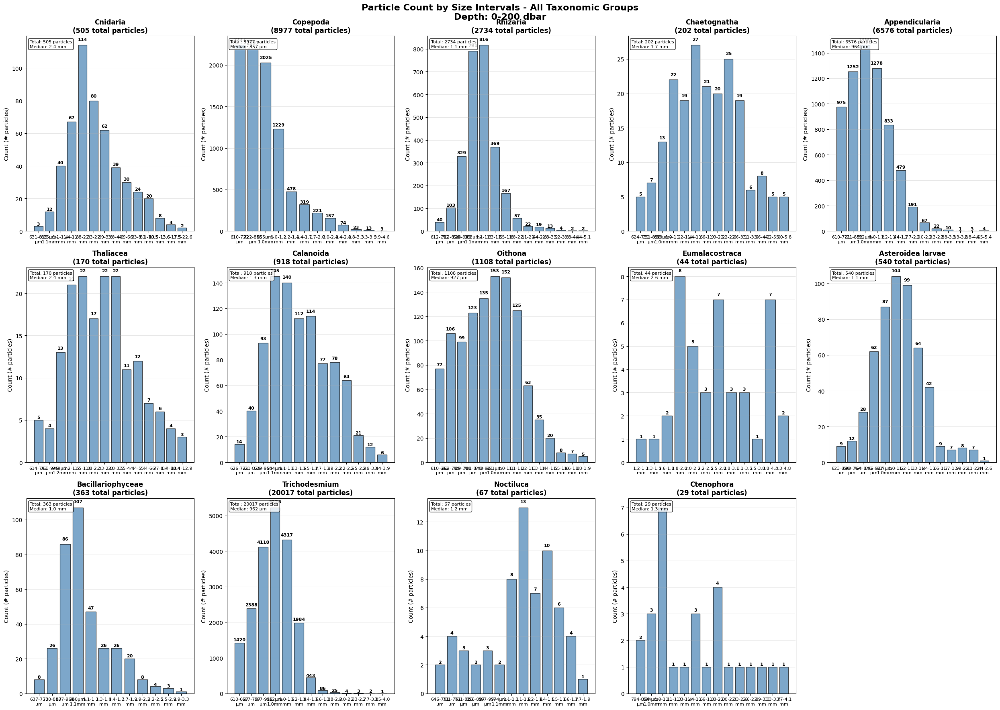

In [463]:
def plot_count_summary_table(df, depth_range, plot_path, n_bins=15):
    """
    Create a summary table showing raw counts for all size bins across taxonomic groups.
    """
    main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
    pressure_min, pressure_max = depth_range
    
    # Create figure for table only
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.axis('off')
    
    # Collect bin information for the table
    all_bin_info = []
    
    for taxonomic_group in main_groups:
        group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
        depth_data = group_df[
            (group_df['object_pressure'] >= pressure_min) & 
            (group_df['object_pressure'] < pressure_max)
        ]
        
        if depth_data.empty:
            continue
        
        # Create bins
        esd_min = depth_data['object_esd'].min()
        esd_max = depth_data['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=n_bins)
        
        counts, bin_edges = np.histogram(depth_data['object_esd'], bins=esd_bins_log)
        
        # Store bin information for this group
        for i, count in enumerate(counts):
            if i < len(bin_edges)-1 and count > 0:  # Only include bins with particles
                lower_bound = bin_edges[i]
                upper_bound = bin_edges[i+1]
                
                # Format size range
                if upper_bound < 1000:
                    size_range = f'{lower_bound:.0f}-{upper_bound:.0f} μm'
                elif lower_bound < 1000 < upper_bound:
                    size_range = f'{lower_bound:.0f} μm-{upper_bound/1000:.1f} mm'
                else:
                    size_range = f'{lower_bound/1000:.1f}-{upper_bound/1000:.1f} mm'
                
                all_bin_info.append({
                    'Group': taxonomic_group,
                    'Size Range': size_range,
                    'Count': int(count)
                })
    
    # Create summary table showing top bins across all groups
    if all_bin_info:
        bin_df = pd.DataFrame(all_bin_info)
        # Sort by count and take top 20 entries for more detail
        top_bins = bin_df.nlargest(20, 'Count')[['Group', 'Size Range', 'Count']]
        
        # Create table
        table_data = top_bins.values
        col_labels = ['Taxonomic Group', 'Size Range', 'Raw Count']
        
        table = ax.table(cellText=table_data, colLabels=col_labels,
                        cellLoc='center', loc='center',
                        colWidths=[0.35, 0.35, 0.3])
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1, 2)
        
        # Style the table
        for i in range(len(col_labels)):
            table[(0, i)].set_facecolor('#4CAF50')
            table[(0, i)].set_text_props(weight='bold', color='white')
        
        # Color code rows by taxonomic group
        group_colors = {
            'Cnidaria': '#ff9999',
            'Copepoda': '#66b3ff', 
            'Rhizaria': '#99ff99',
            'Chaetognatha': '#ffcc99',
            'Appendicularia': '#ff99cc',
            'Thaliacea': '#c2c2f0'
        }
        
        for i, row in enumerate(top_bins.itertuples(), 1):
            group = row.Group
            if group in group_colors:
                for j in range(len(col_labels)):
                    table[(i, j)].set_facecolor(group_colors[group])
                    table[(i, j)].set_alpha(0.3)
        
        ax.set_title(f'Top 20 Size Bins by Raw Count\nDepth: {pressure_min}-{pressure_max} dbar', 
                    fontsize=14, fontweight='bold', pad=20)
    
    plt.tight_layout()
    filename = f'size_bin_count_summary_table_{pressure_min}-{pressure_max}dbar.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


def plot_abundance_histogram_with_categorical_x_axis(df, depth_range, plot_path, n_bins=15):
    """
    Plot abundance histograms with size intervals as categorical x-axis labels.
    """
    #main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
    main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea", "Calanoida", "Oithona", "Eumalacostraca", "Asteroidea larvae", 
                   "Bacillariophyceae", "Trichodesmium", "Noctiluca", "Ctenophora"]
    pressure_min, pressure_max = depth_range
    
    #fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig, axes = plt.subplots(3, 5, figsize=(25, 18))
    axes = axes.flatten()
    
    for group_idx, taxonomic_group in enumerate(main_groups):
        ax = axes[group_idx]
        
        group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
        depth_data = group_df[
            (group_df['object_pressure'] >= pressure_min) & 
            (group_df['object_pressure'] < pressure_max)
        ]
        
        if depth_data.empty:
            ax.text(0.5, 0.5, f'No data for\n{taxonomic_group}', 
                   transform=ax.transAxes, ha='center', va='center', fontsize=12)
            ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
            continue
        
        # Create bins and calculate histogram
        esd_min = depth_data['object_esd'].min()
        esd_max = depth_data['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=n_bins)
        
        counts, bin_edges = np.histogram(depth_data['object_esd'], bins=esd_bins_log)
        
        # Create size range labels for x-axis
        size_labels = []
        x_positions = []
        y_values = []
        
        for i in range(len(bin_edges)-1):
            if counts[i] > 0:  # Only include bins with particles
                lower_bound = bin_edges[i]
                upper_bound = bin_edges[i+1]
                
                # Format size range label
                if upper_bound < 1000:
                    label = f'{lower_bound:.0f}-{upper_bound:.0f}\nμm'
                elif lower_bound < 1000 < upper_bound:
                    label = f'{lower_bound:.0f}μm-\n{upper_bound/1000:.1f}mm'
                else:
                    label = f'{lower_bound/1000:.1f}-{upper_bound/1000:.1f}\nmm'
                
                size_labels.append(label)
                x_positions.append(len(x_positions))
                y_values.append(counts[i])
        
        # Plot as bar chart with categorical x-axis
        if len(x_positions) > 0:
            bars = ax.bar(x_positions, y_values, color='steelblue', alpha=0.7, edgecolor='black')
            
            # Add value labels on top of bars
            for bar, value in zip(bars, y_values):
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height + height*0.02,
                       f'{int(value)}', ha='center', va='bottom', fontsize=8, fontweight='bold')
            
            # Set categorical x-axis
            ax.set_xticks(x_positions)
            ax.set_xticklabels(size_labels, fontsize=8, ha='center')
            
            # Format y-axis
            ax.set_ylabel('Count (# particles)', fontsize=10)
            ax.set_title(f'{taxonomic_group}\n({len(depth_data)} total particles)', fontsize=12, fontweight='bold')
            ax.grid(True, alpha=0.3, axis='y')
            
            # Add statistics
            median_esd = depth_data['object_esd'].median()
            median_label = f'{median_esd:.0f} μm' if median_esd < 1000 else f'{median_esd/1000:.1f} mm'
            total_count = len(depth_data)
            ax.text(0.02, 0.98, f'Total: {total_count} particles\nMedian: {median_label}', 
                   transform=ax.transAxes, va='top', ha='left', 
                   fontsize=8, bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
        else:
            ax.text(0.5, 0.5, f'No particles in\nsize range', 
                   transform=ax.transAxes, ha='center', va='center', fontsize=12)
            ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
    
    # Hide unused subplots
    for idx in range(len(main_groups), len(axes)):
        axes[idx].set_visible(False)
    
    plt.suptitle(f'Particle Count by Size Intervals - All Taxonomic Groups\nDepth: {pressure_min}-{pressure_max} dbar', 
                 fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    filename = f'count_histogram_categorical_size_intervals_{pressure_min}-{pressure_max}dbar.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


# Test the new function with categorical x-axis
plot_abundance_histogram_with_categorical_x_axis(
    df, 
    depth_range=(0, 200), 
    plot_path=plot_path,
    n_bins=15
)

Creating categorical histogram for profile: M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758


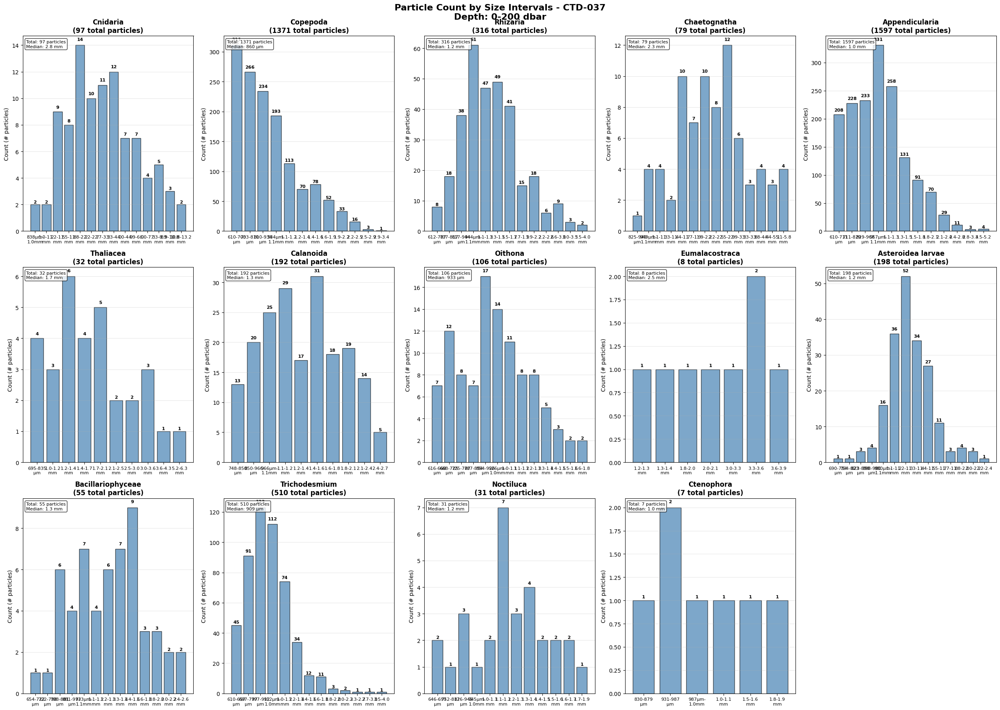

Saved: categorical_histogram_M181_112_1_CTD_037_00Âdeg00S_008Âdeg00W_20220504_1758_0-200dbar.png
Creating categorical histogram for profile: M181-175-1_CTD-050_00Â°00S-019Â°00W_20220509-0543


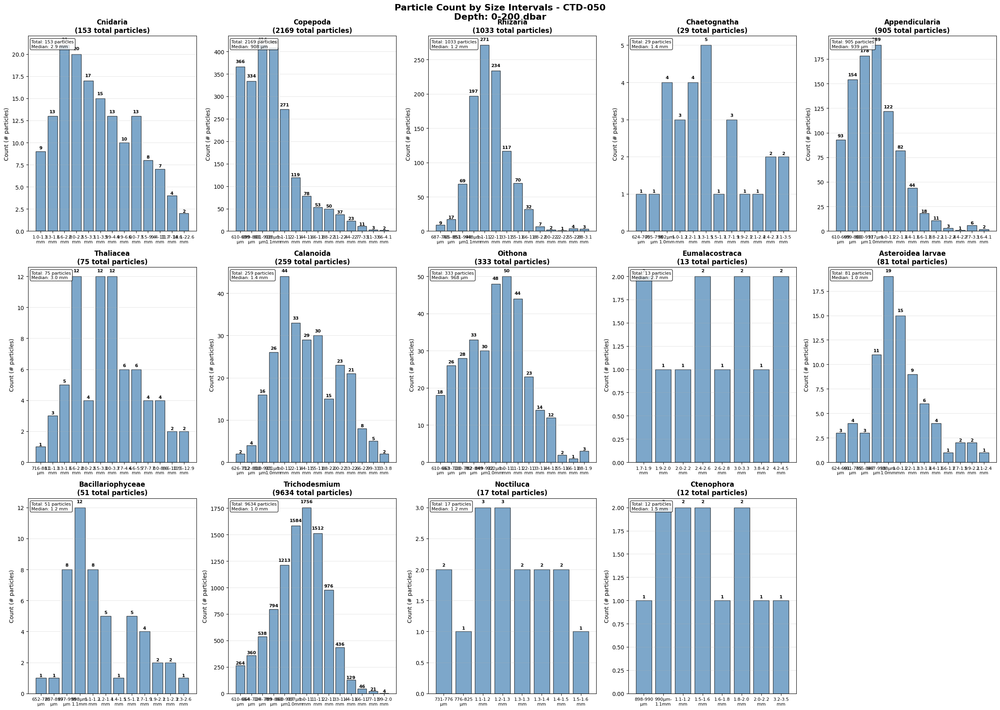

Saved: categorical_histogram_M181_175_1_CTD_050_00Âdeg00S_019Âdeg00W_20220509_0543_0-200dbar.png
Creating categorical histogram for profile: M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748


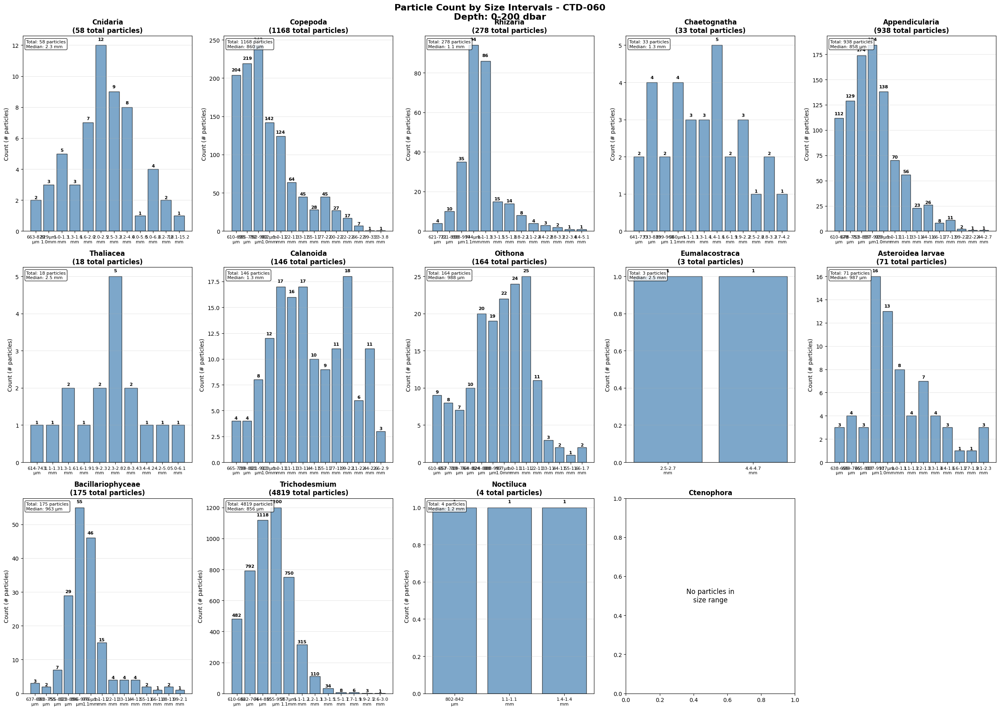

Saved: categorical_histogram_M181_227_1_CTD_060_00Âdeg00S_027Âdeg00W_20220512_1748_0-200dbar.png
Creating categorical histogram for profile: M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024


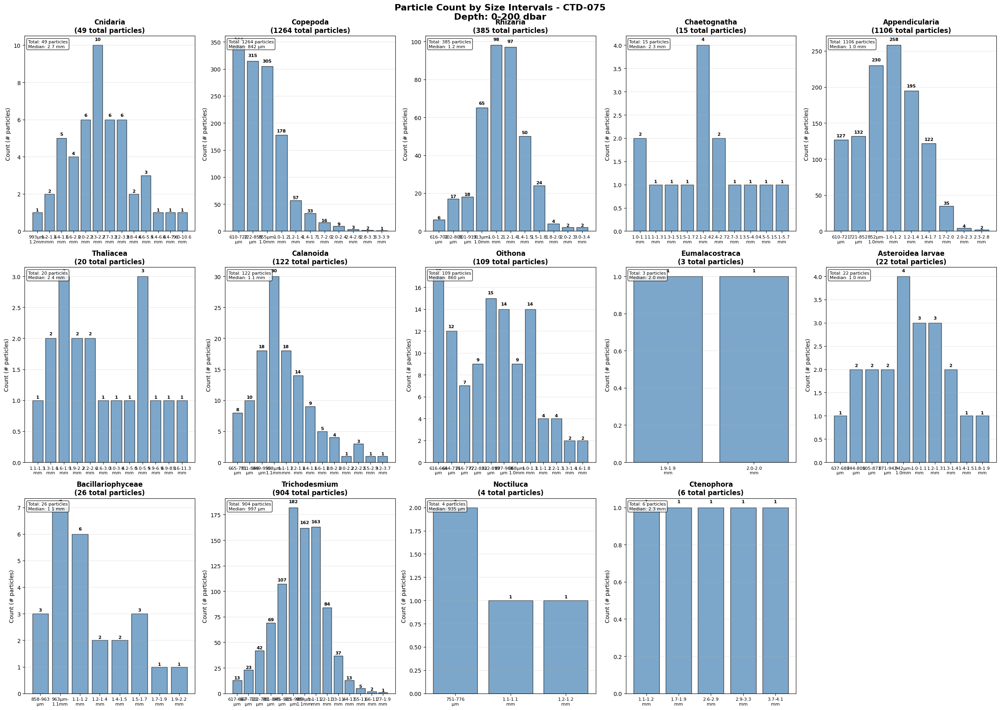

Saved: categorical_histogram_M181_285_1_CTD_075_00Âdeg00S_039Âdeg00W_20220517_2024_0-200dbar.png
Creating categorical histogram for profile: M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218


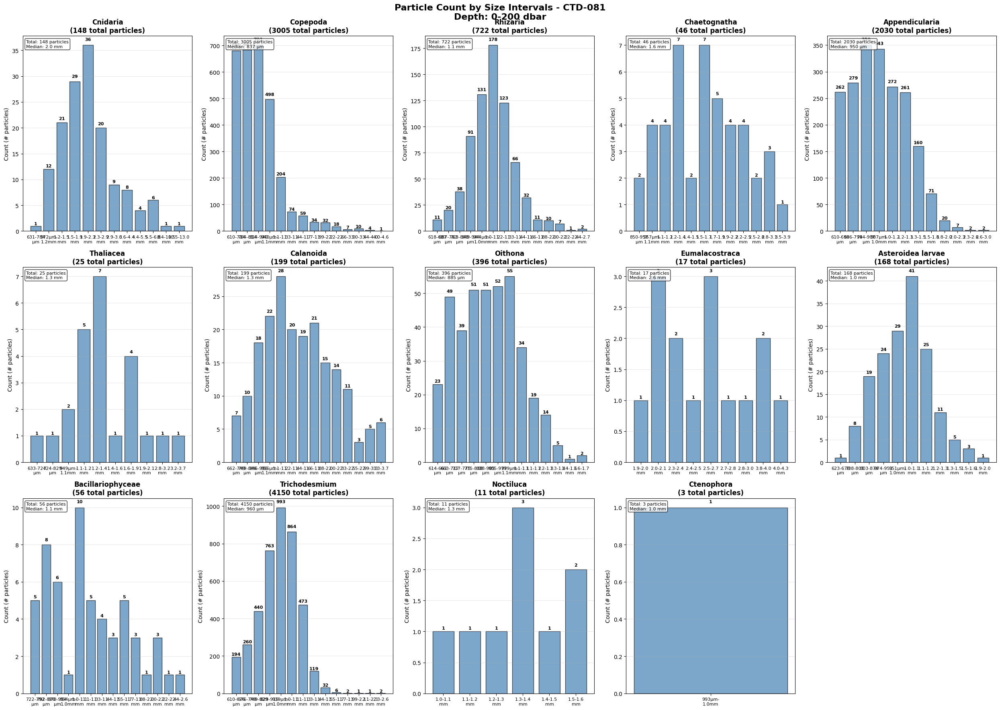

Saved: categorical_histogram_M181_297_1_CTD_081_00Âdeg00S_041Âdeg50W_20220519_0218_0-200dbar.png


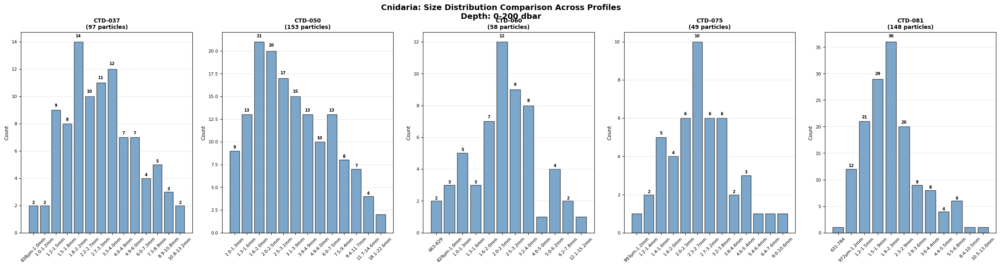

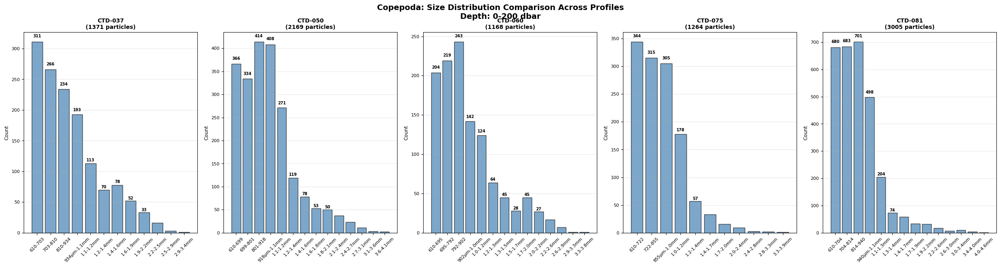

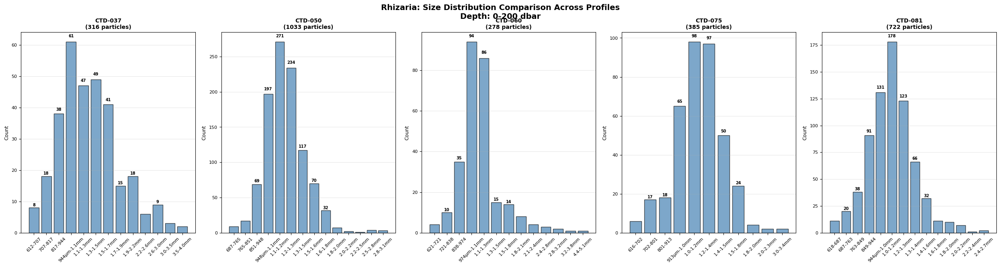

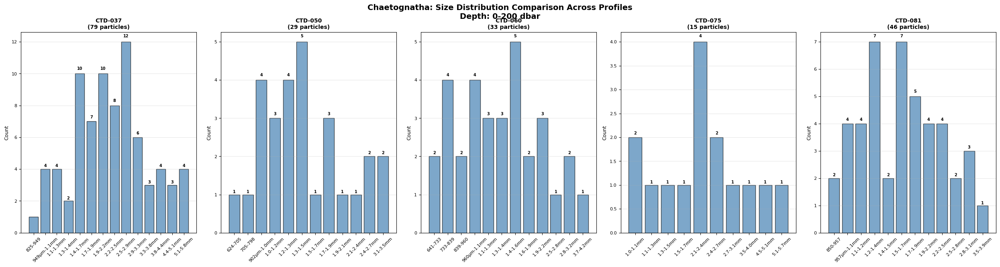

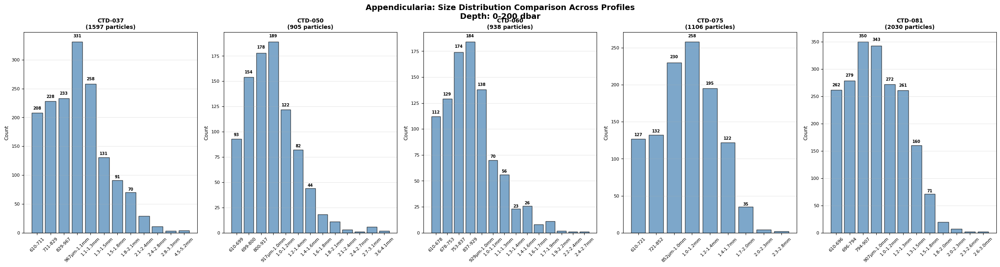

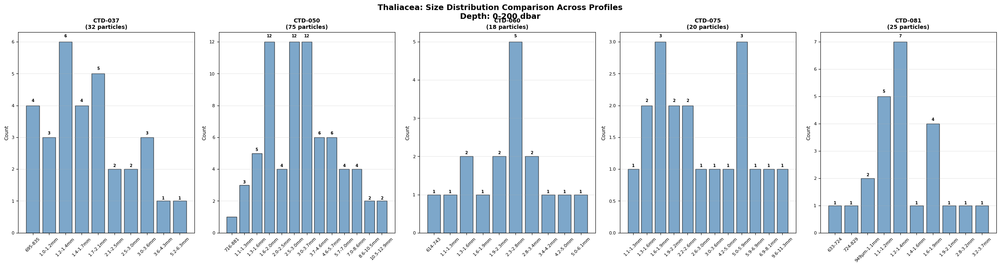

In [464]:
def plot_abundance_histogram_categorical_all_profiles(df, depth_range, plot_path, n_bins=15):
    """
    Plot abundance histograms with size intervals as categorical x-axis for ALL profiles.
    Creates separate plots for each profile showing all taxonomic groups.
    """
    main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea", "Calanoida", "Oithona", "Eumalacostraca", "Asteroidea larvae", 
                   "Bacillariophyceae", "Trichodesmium", "Noctiluca", "Ctenophora"]
    pressure_min, pressure_max = depth_range
    
    # Get all unique profiles
    profiles = sorted(df['sample_id'].unique())
    
    for profile_id in profiles:
        print(f"Creating categorical histogram for profile: {profile_id}")
        
        # Filter data for this profile
        profile_df = df[df['sample_id'] == profile_id]
        
        # Create figure for this profile
        fig, axes = plt.subplots(3, 5, figsize=(25, 18))
        #fig, axes = plt.subplots(2, 3, figsize=(20, 12))
        axes = axes.flatten()
        
        for group_idx, taxonomic_group in enumerate(main_groups):
            ax = axes[group_idx]
            
            # Filter for taxonomic group and depth range
            group_df = profile_df[profile_df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
            depth_data = group_df[
                (group_df['object_pressure'] >= pressure_min) & 
                (group_df['object_pressure'] < pressure_max)
            ]
            
            if depth_data.empty:
                ax.text(0.5, 0.5, f'No data for\n{taxonomic_group}', 
                       transform=ax.transAxes, ha='center', va='center', fontsize=12)
                ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
                continue
            
            # Create bins and calculate histogram
            esd_min = depth_data['object_esd'].min()
            esd_max = depth_data['object_esd'].max()
            esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=n_bins)
            
            counts, bin_edges = np.histogram(depth_data['object_esd'], bins=esd_bins_log)
            
            # Create size range labels for x-axis
            size_labels = []
            x_positions = []
            y_values = []
            
            for i in range(len(bin_edges)-1):
                if counts[i] > 0:  # Only include bins with particles
                    lower_bound = bin_edges[i]
                    upper_bound = bin_edges[i+1]
                    
                    # Format size range label
                    if upper_bound < 1000:
                        label = f'{lower_bound:.0f}-{upper_bound:.0f}\nμm'
                    elif lower_bound < 1000 < upper_bound:
                        label = f'{lower_bound:.0f}μm-\n{upper_bound/1000:.1f}mm'
                    else:
                        label = f'{lower_bound/1000:.1f}-{upper_bound/1000:.1f}\nmm'
                    
                    size_labels.append(label)
                    x_positions.append(len(x_positions))
                    y_values.append(counts[i])
            
            # Plot as bar chart with categorical x-axis
            if len(x_positions) > 0:
                bars = ax.bar(x_positions, y_values, color='steelblue', alpha=0.7, edgecolor='black')
                
                # Add value labels on top of bars
                for bar, value in zip(bars, y_values):
                    height = bar.get_height()
                    ax.text(bar.get_x() + bar.get_width()/2., height + height*0.02,
                           f'{int(value)}', ha='center', va='bottom', fontsize=8, fontweight='bold')
                
                # Set categorical x-axis
                ax.set_xticks(x_positions)
                ax.set_xticklabels(size_labels, fontsize=8, ha='center')
                
                # Format y-axis
                ax.set_ylabel('Count (# particles)', fontsize=10)
                ax.set_title(f'{taxonomic_group}\n({len(depth_data)} total particles)', fontsize=12, fontweight='bold')
                ax.grid(True, alpha=0.3, axis='y')
                
                # Add statistics
                median_esd = depth_data['object_esd'].median()
                median_label = f'{median_esd:.0f} μm' if median_esd < 1000 else f'{median_esd/1000:.1f} mm'
                total_count = len(depth_data)
                ax.text(0.02, 0.98, f'Total: {total_count} particles\nMedian: {median_label}', 
                       transform=ax.transAxes, va='top', ha='left', 
                       fontsize=8, bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
            else:
                ax.text(0.5, 0.5, f'No particles in\nsize range', 
                       transform=ax.transAxes, ha='center', va='center', fontsize=12)
                ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
        
        # Hide unused subplots
        for idx in range(len(main_groups), len(axes)):
            axes[idx].set_visible(False)
        
        # Create a clean profile name for the title and filename
        profile_display_name = profile_id.split('_')[1] if '_' in profile_id else profile_id  # Extract CTD number
        
        plt.suptitle(f'Particle Count by Size Intervals - {profile_display_name}\nDepth: {pressure_min}-{pressure_max} dbar', 
                     fontsize=16, fontweight='bold')
        
        plt.tight_layout()
        
        # Create safe filename (remove special characters)
        safe_profile_name = profile_id.replace('/', '_').replace('°', 'deg').replace('-', '_')
        filename = f'categorical_histogram_{safe_profile_name}_{pressure_min}-{pressure_max}dbar.png'
        plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
        plt.show()
        plt.close()
        
        print(f"Saved: {filename}")


def plot_abundance_histogram_categorical_profile_comparison(df, depth_range, plot_path, taxonomic_group, n_bins=15):
    """
    Plot abundance histograms for ONE taxonomic group across ALL profiles.
    Each profile gets its own subplot showing size interval distributions.
    """
    pressure_min, pressure_max = depth_range
    profiles = sorted(df['sample_id'].unique())
    
    # Calculate grid dimensions
    n_profiles = len(profiles)
    n_cols = min(4, n_profiles)  # Max 4 columns
    n_rows = (n_profiles + n_cols - 1) // n_cols  # Ceiling division
    
    fig, axes = plt.subplots(3, 5, figsize=(25, 18)) 
    #fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
    if n_profiles == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    axes = axes.flatten()
    
    for profile_idx, profile_id in enumerate(profiles):
        ax = axes[profile_idx]
        
        # Filter data for this profile and taxonomic group
        profile_df = df[df['sample_id'] == profile_id]
        group_df = profile_df[profile_df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
        depth_data = group_df[
            (group_df['object_pressure'] >= pressure_min) & 
            (group_df['object_pressure'] < pressure_max)
        ]
        
        if depth_data.empty:
            ax.text(0.5, 0.5, f'No data for\n{taxonomic_group}', 
                   transform=ax.transAxes, ha='center', va='center', fontsize=10)
            profile_display = profile_id.split('_')[1] if '_' in profile_id else profile_id
            ax.set_title(f'{profile_display}', fontsize=10, fontweight='bold')
            continue
        
        # Create bins and calculate histogram
        esd_min = depth_data['object_esd'].min()
        esd_max = depth_data['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=n_bins)
        
        counts, bin_edges = np.histogram(depth_data['object_esd'], bins=esd_bins_log)
        
        # Create size range labels for x-axis
        size_labels = []
        x_positions = []
        y_values = []
        
        for i in range(len(bin_edges)-1):
            if counts[i] > 0:  # Only include bins with particles
                lower_bound = bin_edges[i]
                upper_bound = bin_edges[i+1]
                
                # Format size range label (shorter for comparison plot)
                if upper_bound < 1000:
                    label = f'{lower_bound:.0f}-{upper_bound:.0f}'
                elif lower_bound < 1000 < upper_bound:
                    label = f'{lower_bound:.0f}μm-{upper_bound/1000:.1f}mm'
                else:
                    label = f'{lower_bound/1000:.1f}-{upper_bound/1000:.1f}mm'
                
                size_labels.append(label)
                x_positions.append(len(x_positions))
                y_values.append(counts[i])
        
        # Plot as bar chart
        if len(x_positions) > 0:
            bars = ax.bar(x_positions, y_values, color='steelblue', alpha=0.7, edgecolor='black')
            
            # Add value labels on top of bars (only for significant values)
            for bar, value in zip(bars, y_values):
                if value > max(y_values) * 0.1:  # Only label bars >10% of max
                    height = bar.get_height()
                    ax.text(bar.get_x() + bar.get_width()/2., height + height*0.02,
                           f'{int(value)}', ha='center', va='bottom', fontsize=7, fontweight='bold')
            
            # Set categorical x-axis
            ax.set_xticks(x_positions)
            ax.set_xticklabels(size_labels, fontsize=7, ha='center', rotation=45)
            
            # Format axes
            ax.set_ylabel('Count', fontsize=9)
            profile_display = profile_id.split('_')[1] if '_' in profile_id else profile_id
            ax.set_title(f'{profile_display}\n({len(depth_data)} particles)', fontsize=10, fontweight='bold')
            ax.grid(True, alpha=0.3, axis='y')
            ax.tick_params(labelsize=8)
        else:
            ax.text(0.5, 0.5, f'No particles', 
                   transform=ax.transAxes, ha='center', va='center', fontsize=10)
            profile_display = profile_id.split('_')[1] if '_' in profile_id else profile_id
            ax.set_title(f'{profile_display}', fontsize=10, fontweight='bold')
    
    # Hide unused subplots
    for idx in range(len(profiles), len(axes)):
        axes[idx].set_visible(False)
    
    plt.suptitle(f'{taxonomic_group}: Size Distribution Comparison Across Profiles\nDepth: {pressure_min}-{pressure_max} dbar', 
                 fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    filename = f'categorical_comparison_{taxonomic_group}_{pressure_min}-{pressure_max}dbar_all_profiles.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


# Generate categorical histograms for all profiles
plot_abundance_histogram_categorical_all_profiles(
    df, 
    depth_range=(0, 200), 
    plot_path=plot_path,
    n_bins=15
)

# Generate comparison plots for each taxonomic group
main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
for group in main_groups:
    plot_abundance_histogram_categorical_profile_comparison(
        df, 
        depth_range=(0, 200), 
        plot_path=plot_path,
        taxonomic_group=group,
        n_bins=15
    )

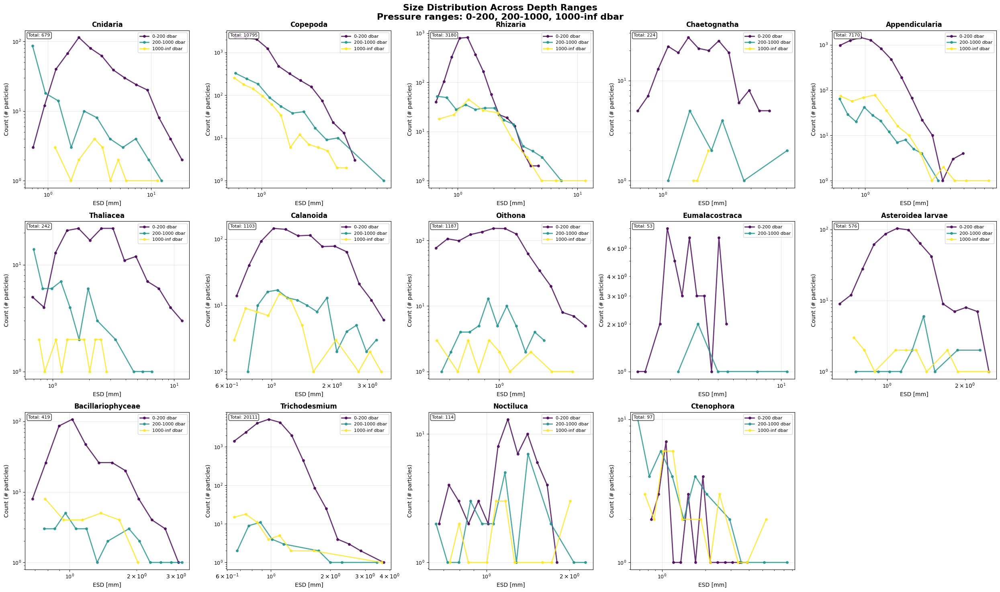

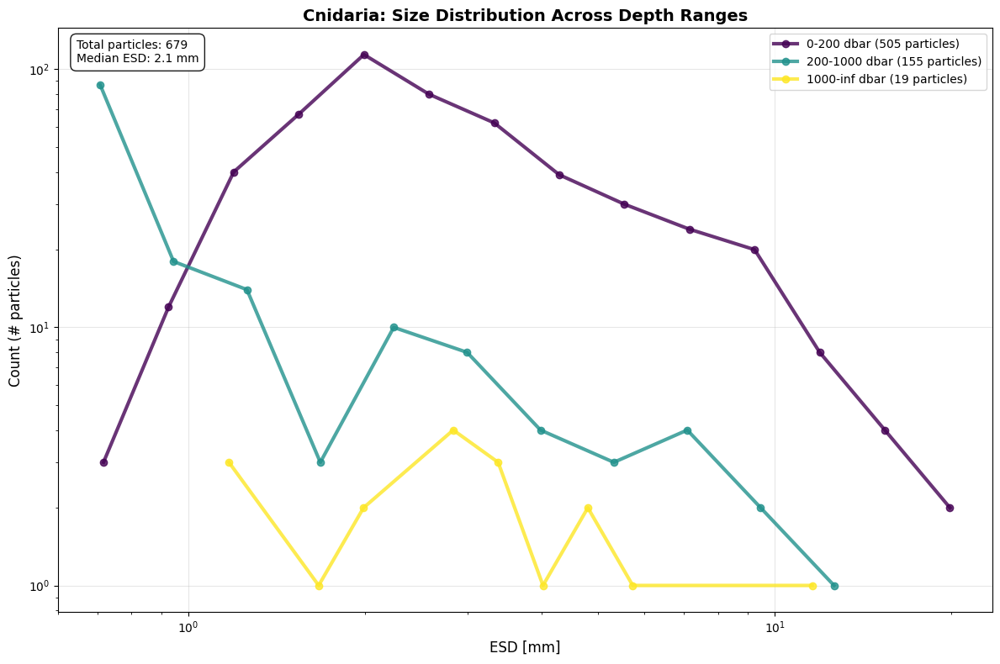

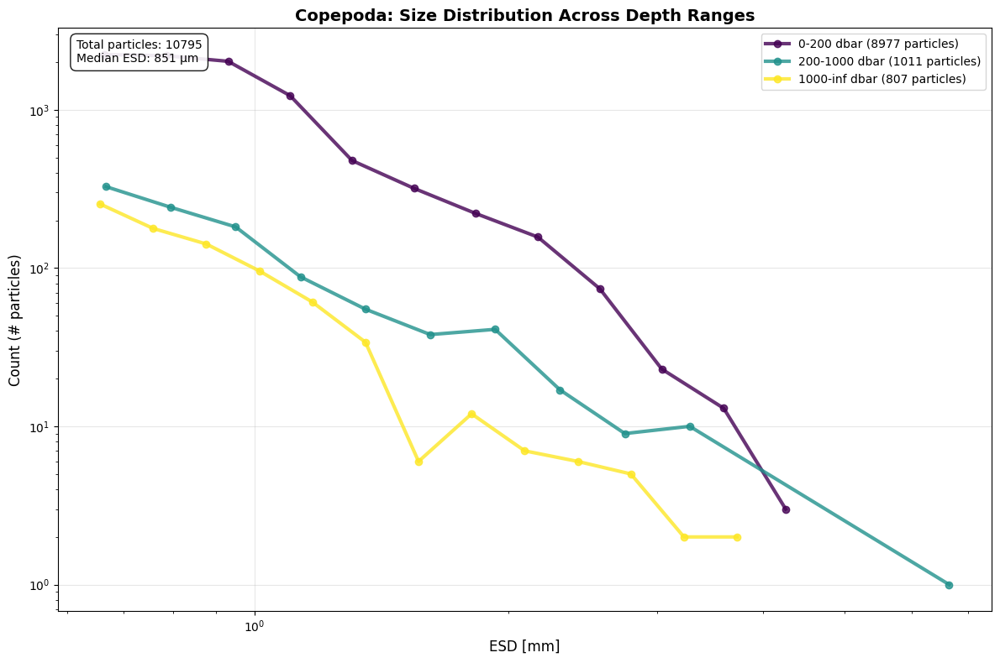

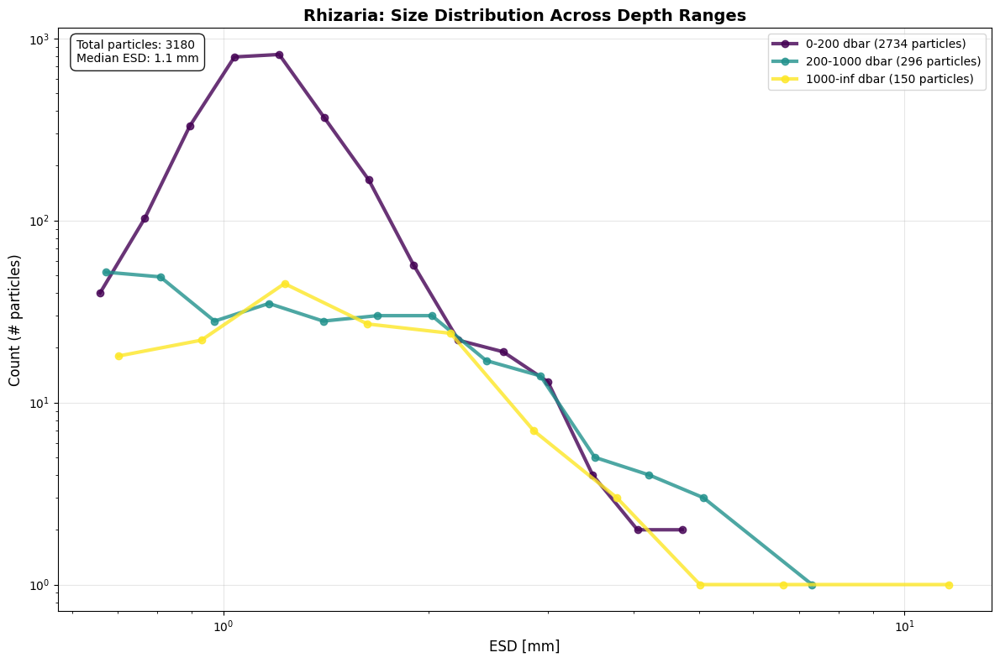

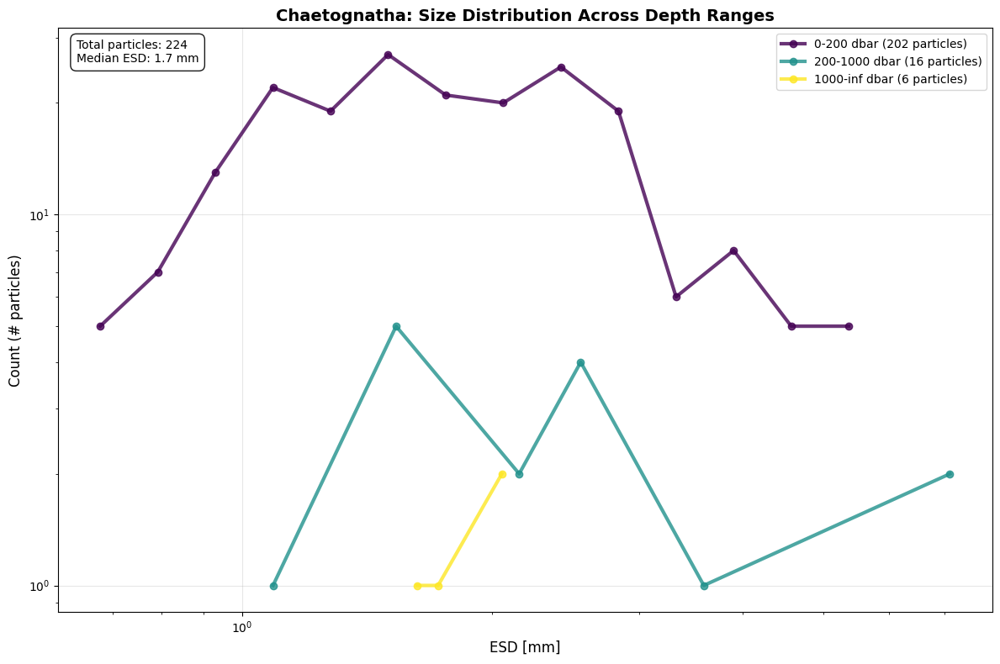

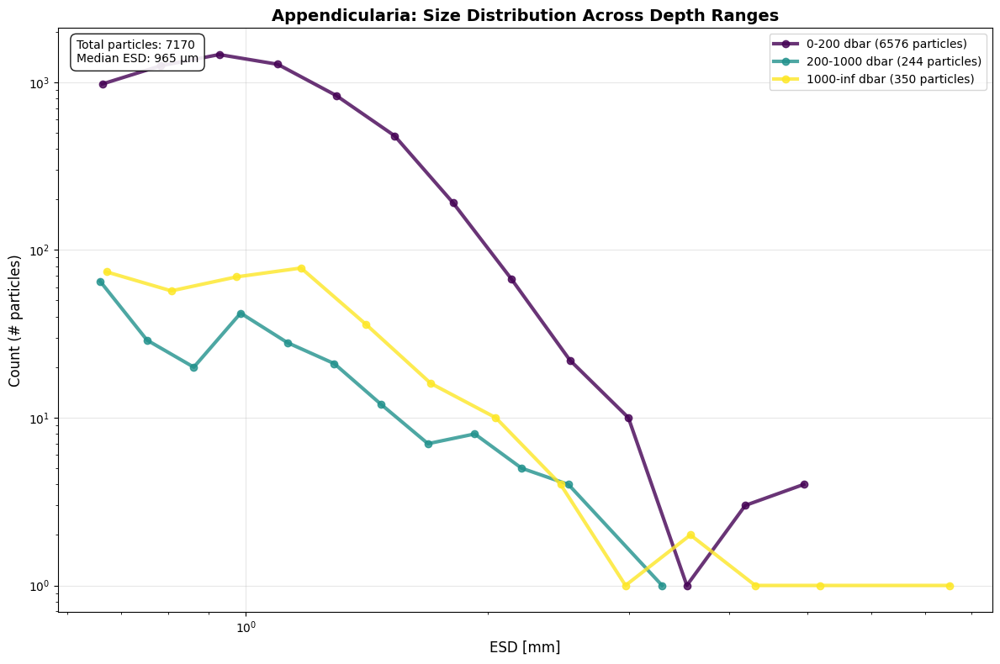

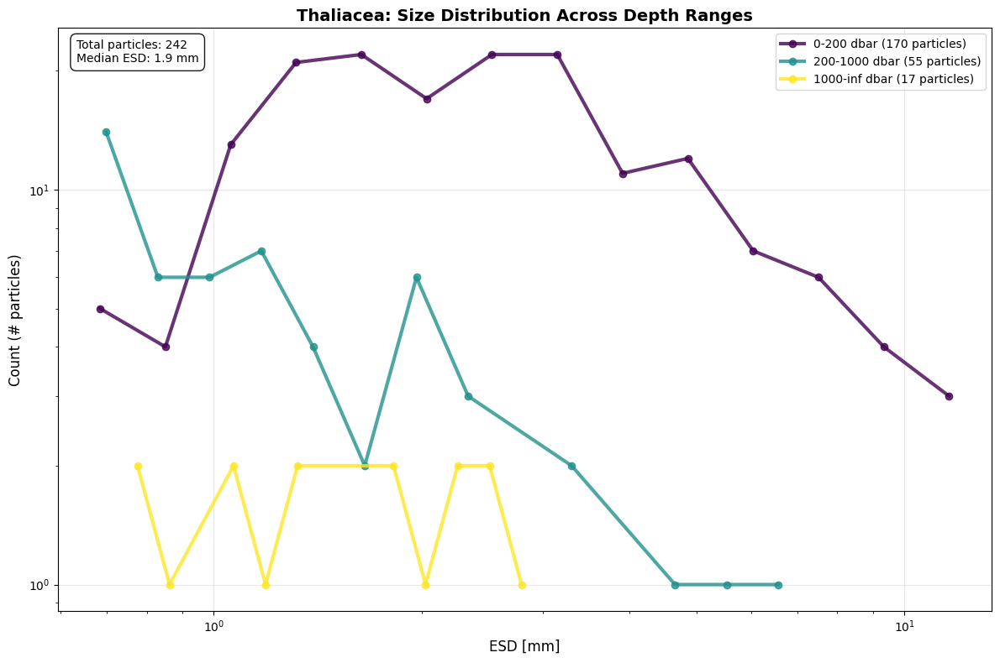

In [ ]:
def plot_abundance_vs_size_multi_depth_comparison(df, plot_path, taxonomic_groups=None, 
                                                 pressure_ranges=[(0, 200), (200, 500), (500, 1000), (1000, 2000)], 
                                                 n_bins=15):
    """
    Plot abundance vs size for each taxonomic group across multiple depth bins.
    Uses line plots to show how size distributions change with depth.
    
    Parameters:
    - df: DataFrame with particle data
    - plot_path: str, directory to save plots
    - taxonomic_groups: list of taxonomic group names (default uses main groups)
    - pressure_ranges: list of tuples defining pressure ranges
    - n_bins: number of logarithmic size bins to use
    """
    
    if taxonomic_groups is None:
        taxonomic_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea", 
                           "Calanoida", "Oithona", "Eumalacostraca", "Asteroidea larvae", 
                           "Bacillariophyceae", "Trichodesmium", "Noctiluca", "Ctenophora"]
    
    # Colors for different depth ranges
    depth_colors = plt.cm.viridis(np.linspace(0, 1, len(pressure_ranges)))
    
    # Create subplot grid
    n_groups = len(taxonomic_groups)
    n_cols = 5
    n_rows = (n_groups + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 5*n_rows))
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    axes = axes.flatten()
    
    for group_idx, taxonomic_group in enumerate(taxonomic_groups):
        ax = axes[group_idx]
        
        # Filter data for this taxonomic group
        group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
        
        if group_df.empty:
            ax.text(0.5, 0.5, f'No data for\n{taxonomic_group}', 
                   transform=ax.transAxes, ha='center', va='center', fontsize=12)
            ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
            continue
        
        has_data = False
        
        # Plot each depth range
        for depth_idx, (pressure_min, pressure_max) in enumerate(pressure_ranges):
            depth_data = group_df[
                (group_df['object_pressure'] >= pressure_min) & 
                (group_df['object_pressure'] < pressure_max)
            ]
            
            if len(depth_data) == 0:
                continue
            
            has_data = True
            
            # Create logarithmic bins
            esd_min = depth_data['object_esd'].min()
            esd_max = depth_data['object_esd'].max()
            esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=n_bins)
            
            # Calculate histogram
            counts, bin_edges = np.histogram(depth_data['object_esd'], bins=esd_bins_log)
            
            # Calculate bin centers for plotting
            bin_centers = np.sqrt(bin_edges[:-1] * bin_edges[1:])  # Geometric mean
            bin_centers_mm = bin_centers / 1000  # Convert to mm
            
            # Only plot non-zero counts
            non_zero_mask = counts > 0
            if np.any(non_zero_mask):
                bin_centers_filtered = bin_centers_mm[non_zero_mask]
                counts_filtered = counts[non_zero_mask]
                
                # Create depth range label
                depth_label = f'{pressure_min}-{pressure_max} dbar'
                
                # Plot line with markers
                ax.loglog(bin_centers_filtered, counts_filtered, 
                         'o-', color=depth_colors[depth_idx], 
                         label=depth_label, linewidth=2, markersize=4, alpha=0.8)
        
        if has_data:
            # Format axes
            ax.set_xlabel('ESD [mm]', fontsize=10)
            ax.set_ylabel('Count (# particles)', fontsize=10)
            ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
            ax.grid(True, alpha=0.3)
            ax.legend(fontsize=8, loc='best')
            ax.tick_params(labelsize=9)
            
            # Add total count for this group
            total_particles = len(group_df)
            ax.text(0.02, 0.98, f'Total: {total_particles}', 
                   transform=ax.transAxes, va='top', ha='left', 
                   fontsize=8, bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
        else:
            ax.text(0.5, 0.5, f'No data for\n{taxonomic_group}', 
                   transform=ax.transAxes, ha='center', va='center', fontsize=12)
            ax.set_title(f'{taxonomic_group}', fontsize=12, fontweight='bold')
    
    # Hide unused subplots
    for idx in range(len(taxonomic_groups), len(axes)):
        axes[idx].set_visible(False)
    
    # Create pressure range string for title
    depth_ranges_str = ', '.join([f'{p_min}-{p_max}' for p_min, p_max in pressure_ranges])
    
    plt.suptitle(f'Size Distribution Across Depth Ranges\nPressure ranges: {depth_ranges_str} dbar', 
                 fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    filename = f'size_distribution_multi_depth_comparison.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


def plot_abundance_vs_size_single_group_multi_depth(df, plot_path, taxonomic_group, 
                                                   pressure_ranges=[(0, 200), (200, 500), (500, 1000), (1000, 2000)], 
                                                   n_bins=15):
    """
    Create a detailed plot for a single taxonomic group showing size distributions across multiple depths.
    Larger plot with better readability for individual group analysis.
    """
    
    # Filter data for this taxonomic group
    group_df = df[df["object_annotation_hierarchy"].str.contains(taxonomic_group, na=False)]
    
    if group_df.empty:
        print(f"No data found for {taxonomic_group}")
        return
    
    # Create figure
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Colors for different depth ranges
    depth_colors = plt.cm.viridis(np.linspace(0, 1, len(pressure_ranges)))
    
    # Plot each depth range
    for depth_idx, (pressure_min, pressure_max) in enumerate(pressure_ranges):
        depth_data = group_df[
            (group_df['object_pressure'] >= pressure_min) & 
            (group_df['object_pressure'] < pressure_max)
        ]
        
        if len(depth_data) == 0:
            continue
        
        # Create logarithmic bins
        esd_min = depth_data['object_esd'].min()
        esd_max = depth_data['object_esd'].max()
        esd_bins_log = np.logspace(np.log10(esd_min), np.log10(esd_max), num=n_bins)
        
        # Calculate histogram
        counts, bin_edges = np.histogram(depth_data['object_esd'], bins=esd_bins_log)
        
        # Calculate bin centers for plotting
        bin_centers = np.sqrt(bin_edges[:-1] * bin_edges[1:])  # Geometric mean
        bin_centers_mm = bin_centers / 1000  # Convert to mm
        
        # Only plot non-zero counts
        non_zero_mask = counts > 0
        if np.any(non_zero_mask):
            bin_centers_filtered = bin_centers_mm[non_zero_mask]
            counts_filtered = counts[non_zero_mask]
            
            # Create depth range label with particle count
            depth_label = f'{pressure_min}-{pressure_max} dbar ({len(depth_data)} particles)'
            
            # Plot line with markers
            ax.loglog(bin_centers_filtered, counts_filtered, 
                     'o-', color=depth_colors[depth_idx], 
                     label=depth_label, linewidth=3, markersize=6, alpha=0.8)
    
    # Format axes
    ax.set_xlabel('ESD [mm]', fontsize=12)
    ax.set_ylabel('Count (# particles)', fontsize=12)
    ax.set_title(f'{taxonomic_group}: Size Distribution Across Depth Ranges', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10, loc='best')
    
    # Add statistics
    total_particles = len(group_df)
    median_esd = group_df['object_esd'].median()
    median_label = f'{median_esd:.0f} μm' if median_esd < 1000 else f'{median_esd/1000:.1f} mm'
    
    ax.text(0.02, 0.98, f'Total particles: {total_particles}\nMedian ESD: {median_label}', 
           transform=ax.transAxes, va='top', ha='left', 
           fontsize=10, bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.9))
    
    plt.tight_layout()
    filename = f'size_distribution_multi_depth_{taxonomic_group}.png'
    plt.savefig(os.path.join(plot_path, filename), dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


# Generate the multi-depth comparison plot for all groups with corrected pressure ranges
plot_abundance_vs_size_multi_depth_comparison(
    df, 
    plot_path=plot_path,
    pressure_ranges=[(0, 200), (200, 1000), (1000, np.inf)],  # Changed: >1000 dbar using np.inf
    n_bins=15
)

# Generate detailed plots for main taxonomic groups with corrected pressure ranges
main_groups = ["Cnidaria", "Copepoda", "Rhizaria", "Chaetognatha", "Appendicularia", "Thaliacea"]
for group in main_groups:
    plot_abundance_vs_size_single_group_multi_depth(
        df, 
        plot_path=plot_path,
        taxonomic_group=group,
        pressure_ranges=[(0, 200), (200, 1000), (1000, np.inf)],  # Changed: >1000 dbar using np.inf
        n_bins=15
    )


In [ ]:
#get validated profiles

ViT_validated_CTD50_df = pd.read_csv('/home/fanny/Profiles/export__TSV_17668_20250818_1533_CTD-50/ecotaxa_export__TSV_17668_20250818_1533.tsv', sep='\t')
ViT_fully_predicted_df = pd.read_csv('/home/fanny/Profiles/export__TSV_17785_20250818_1537__M181_PISCO2_deconv_fully_ViT_predicted/ecotaxa_export__TSV_17785_20250818_1537.tsv', sep='\t')

ViT_validated_CTD37_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-112-1_CTD-037_00Â°00S-008Â°00W_20220504-1758']
ViT_validated_CTD60_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-227-1_CTD-060_00Â°00S-027Â°00W_20220512-1748']
ViT_validated_CTD75_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-285-1_CTD-075_00Â°00S-039Â°00W_20220517-2024']
ViT_validated_CTD81_df = ViT_fully_predicted_df[ViT_fully_predicted_df['sample_id'] == 'M181-297-1_CTD-081_00Â°00S-041Â°50W_20220519-0218']

df_five_profiles = pd.concat([ViT_validated_CTD50_df, ViT_validated_CTD37_df, ViT_validated_CTD60_df, ViT_validated_CTD75_df, ViT_validated_CTD81_df], ignore_index=True)